<a href="https://colab.research.google.com/github/Joana-Mansa/machine_deep_learning_project/blob/jupyter_notebook/machine_and_deep_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Brain Tumor Segmentation and Classification
1. Data prepation
2. Advanced Image Analysis
3. Machine Learning
4. Deep Learning

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install SimpleITK

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 29.2 MB/s eta 0:00:00


In [ ]:
pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.0/233.0 kB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 13.2 MB/s eta 0:00:00


In [ ]:
import h5py
import shutil
import h5py
import joblib
import torch
import optuna
import numpy as np
import torch.nn as nn
from pathlib import Path

from PIL import Image
import scipy.io as sio
import SimpleITK as sitk
import torch.optim as optim
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import balanced_accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from skimage.feature import graycomatrix, greycoprops
from skimage.feature import local_binary_pattern
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.metrics import classification_report, accuracy_score, balanced_accuracy_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, StackingClassifier, AdaBoostClassifier, VotingClassifier

In [ ]:
# loading libraries
import glob
import cv2
import os
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
from scipy.signal import wiener
from skimage.filters import sobel
from sklearn import preprocessing
from skimage.color import rgb2gray
from torchvision import transforms
from sklearn.decomposition import PCA
from torch.utils.data import DataLoader
from google.colab.patches import cv2_imshow
from torchvision import transforms, datasets
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from skimage.feature import graycomatrix, graycoprops
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

## 1. Data Preparation


Task:
1. Split the data on the patient-level
2. Extract the images and the tumormasks from these images and store them in a directory.
The directories will be splitted into training(70%), testing(30%) and validation(0.2 * 0.70) maintaining the order of the patient split.

The dataset contains 3064 T1-weighted contrast-enhanced images with 3 different kinds of tumor.
- meningioma (708)
- glioma (1426)
- pituitary tumor (930)
The images were originally collected from 233 patients and the images include coronal, sagittal, axial views.

Each .mat file contains a struct with the following fields

- cjdata.label - 1 for meningioma, 2 for glioma, 3 for pituitary tumor

- cjdata.PID - patient ID
- cjdata.image - image data
- cjdata.tumorborder: a vector storing the coordinates of the discrete points on the tumor border. Can be used for binary image of tumor mask

- cjdata.tumorMask- binary image with 1s indicating the tumor region

In [ ]:
pip install h5py

In [ ]:
folder_directory = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/"

In [ ]:
import h5py
import os
import numpy as np
from imageio import imwrite
from collections import defaultdict
from sklearn.model_selection import train_test_split

# Function to extract data from a .mat file and inspect shapes
def extract_data_from_mat(file_path):
    with h5py.File(file_path, 'r') as f:
        cjdata = f['cjdata']

        # Extract data
        PIDs = cjdata['PID'][()]
        images = cjdata['image'][()]
        tumor_masks = cjdata['tumorMask'][()]

        # Inspect shapes
        print(f"PIDs shape: {PIDs.shape}")
        print(f"Images shape: {images.shape}")
        print(f"Tumor masks shape: {tumor_masks.shape}")

        return PIDs, images, tumor_masks

# Path to the .mat file
sample_file_path = '/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/pituitary/1830.mat'

# Extract and inspect data
PIDs, images, tumor_masks = extract_data_from_mat(sample_file_path)
print(PIDs)

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = '/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/pituitary/1830.mat', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

### Classifying the Files based on their Labels

In [ ]:
# Function to move folders to Google Drive
def move_folders_to_drive(source_folder, destination_folder):
    # Move the entire source folder to the destination folder in Google Drive
    shutil.move(source_folder, destination_folder)
    # print(f"Moved folder '{source_folder}' to Google Drive")

# Example usage
source_folder = '/content/meningioma'  # Update with the path to the source folder in Colab
destination_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/meningioma"
move_folders_to_drive(source_folder, destination_folder)

In [ ]:
# grouped folders
mening = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/meningioma/"
pit = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/pituitary/"
glio = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/glioma/"

In [ ]:
# Specify the input directory where your .mat files are stored
input_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/glioma/"
output_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/glioma/glioma/"
# Loop through all files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(".mat"):
        # Construct the full file path
        file_path = os.path.join(input_folder, filename)

        # Open the .mat file using h5py
        with h5py.File(file_path, 'r') as file:
            cjdata_group = file['cjdata']
            image = cjdata_group['image'][:]
            image_mask = cjdata_group['tumorMask'][:]

            # Plotting the image without axis
            plt.imshow(image, cmap='gray')
            plt.axis('off')

            # Saving the figure; strip ".mat" from filename and append ".png"
            save_path = os.path.join(output_folder, filename[:-4] + '.png')
            plt.savefig(save_path)
            plt.close()  # Close the plot to free memory


In [ ]:
# Specify the input directory where your .mat files are stored
input_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/glioma/"
output_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/glioma/glioma/"
# Loop through all files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(".mat"):
        # Construct the full file path
        file_path = os.path.join(input_folder, filename)

        # Open the .mat file using h5py
        with h5py.File(file_path, 'r') as file:
            cjdata_group = file['cjdata']
            image = cjdata_group['image'][:]
            image_mask = cjdata_group['tumorMask'][:]

            # Plotting the image without axis
            plt.imshow(image_mask, cmap='gray')
            plt.axis('off')

            # Saving the figure; strip ".mat" from filename and append ".png"
            save_path = os.path.join(output_folder, filename[:-4] + '_mask.png')
            plt.savefig(save_path)
            plt.close()  # Close the plot to free memory


In [ ]:
# Specify the input directory where your .mat files are stored
input_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/meningioma/"
output_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/meningioma/meningioma/"
# Loop through all files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(".mat"):
        # Construct the full file path
        file_path = os.path.join(input_folder, filename)

        # Open the .mat file using h5py
        with h5py.File(file_path, 'r') as file:
            cjdata_group = file['cjdata']
            image = cjdata_group['image'][:]
            image_mask = cjdata_group['tumorMask'][:]

            # Plotting the image without axis
            plt.imshow(image, cmap='gray')
            plt.axis('off')

            # Saving the figure; strip ".mat" from filename and append ".png"
            save_path = os.path.join(output_folder, filename[:-4] + '.png')
            plt.savefig(save_path)
            plt.close()  # Close the plot to free memory


In [ ]:
# Specify the input directory where your .mat files are stored
input_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/meningioma/"
output_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/meningioma/meningioma/"
# Loop through all files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(".mat"):
        # Construct the full file path
        file_path = os.path.join(input_folder, filename)

        # Open the .mat file using h5py
        with h5py.File(file_path, 'r') as file:
            cjdata_group = file['cjdata']
            image = cjdata_group['image'][:]
            image_mask = cjdata_group['tumorMask'][:]

            # Plotting the image without axis
            plt.imshow(image_mask, cmap='gray')
            plt.axis('off')

            # Saving the figure; strip ".mat" from filename and append ".png"
            save_path = os.path.join(output_folder, filename[:-4] + '_mask.png')
            plt.savefig(save_path)
            plt.close()  # Close the plot to free memory


In [ ]:
# Specify the input directory where your .mat files are stored
input_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/pituitary/"
output_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/pituitary/pituitary/"
# Loop through all files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(".mat"):
        # Construct the full file path
        file_path = os.path.join(input_folder, filename)

        # Open the .mat file using h5py
        with h5py.File(file_path, 'r') as file:
            cjdata_group = file['cjdata']
            image = cjdata_group['image'][:]
            image_mask = cjdata_group['tumorMask'][:]

            # Plotting the image without axis
            plt.imshow(image, cmap='gray')
            plt.axis('off')

            # Saving the figure; strip ".mat" from filename and append ".png"
            save_path = os.path.join(output_folder, filename[:-4] + '.png')
            plt.savefig(save_path)
            plt.close()  # Close the plot to free memory


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/pituitary/'

In [ ]:
# Specify the input directory where your .mat files are stored
input_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/pituitary/"
output_folder = "/content/drive/My Drive/multidisciplinary_project_file_dump/data_set/pituitary/pituitary/"
# Loop through all files in the input folder
for filename in os.listdir(input_folder):
    if filename.endswith(".mat"):
        # Construct the full file path
        file_path = os.path.join(input_folder, filename)

        # Open the .mat file using h5py
        with h5py.File(file_path, 'r') as file:
            cjdata_group = file['cjdata']
            image = cjdata_group['image'][:]
            image_mask = cjdata_group['tumorMask'][:]

            # Plotting the image without axis
            plt.imshow(image_mask, cmap='gray')
            plt.axis('off')

            # Saving the figure; strip ".mat" from filename and append ".png"
            save_path = os.path.join(output_folder, filename[:-4] + '_mask.png')
            plt.savefig(save_path)
            plt.close()  # Close the plot to free memory


In [ ]:
# Path to the .mat file
sample_file_path = '/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/glioma/726.mat'

# Extract and inspect data
PIDs, images, tumor_masks = extract_data_from_mat(sample_file_path)
print(PIDs)

PIDs shape: (6, 1)
Images shape: (512, 512)
Tumor masks shape: (512, 512)
[[49]
 [48]
 [51]
 [49]
 [52]
 [56]]


In [ ]:
# Path to the .mat file
sample_file_path = '/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/meningioma/19.mat'

# Extract and inspect data
PIDs, images, tumor_masks = extract_data_from_mat(sample_file_path)


PIDs shape: (6, 1)
Images shape: (512, 512)
Tumor masks shape: (512, 512)


### Splitting the Data on the Patient-level

In [ ]:
folder_directory = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/"
destination_directory = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data"

In [ ]:
import os
import h5py
import numpy as np
from sklearn.model_selection import train_test_split
import shutil
# this code was intended to move the files into training, testing and validation set
# the split was supposed to be done on the patient level

# Initialize lists to store data
file_paths = []
labels = []
patient_ids = []

# Mapping of folder names to class labels
class_mapping = {
    'meningioma': 1,
    'glioma': 2,
    'pituitary': 3
}

# Function to extract patient ID from .mat file
def extract_pid_from_mat(file_path):
    with h5py.File(file_path, 'r') as f:
        cjdata = f['cjdata']

        # Extract PID and handle different formats
        pid_data = np.array(cjdata['PID'])
        pid = ''.join(map(chr, pid_data.flatten().astype(int)))

        return pid

# Recursively traverse the directory structure and collect data
base_split_dir = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data"

base_dir = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/"  # Adjust this path to where your class folders are located

for class_folder, label in class_mapping.items():
    class_dir = os.path.join(base_dir, class_folder)
    for file_name in os.listdir(class_dir):
        if file_name.endswith('.mat'):
            file_path = os.path.join(class_dir, file_name)
            pid = extract_pid_from_mat(file_path)

            file_paths.append(file_path)
            labels.append(label)
            patient_ids.append(pid)

# Convert patient IDs to a numpy array
patient_ids = np.array(patient_ids)

# Print some details to verify data extraction
print(f'Total files collected: {len(file_paths)}')
print(f'Total labels collected: {len(labels)}')
print(f'Total PIDs collected: {len(patient_ids)}')
print(f'Sample PID: {patient_ids[0]}')

# Count the number of unique patient IDs
unique_patients = np.unique(patient_ids)
print(f'Number of unique patients: {len(unique_patients)}')

# Check the number of unique patients
if len(unique_patients) < 10:
    raise ValueError("Not enough unique patients for a meaningful split.")

# Split patients into training + validation and test sets (70% training + validation, 30% test)
train_val_patients, test_patients = train_test_split(unique_patients, test_size=0.30, random_state=42)

# Split the training + validation set into training and validation sets (60% training, 40% validation)
train_patients, val_patients = train_test_split(train_val_patients, test_size=0.2857, random_state=42)

# Ensure there is no overlap
assert len(set(train_patients).intersection(val_patients)) == 0, "Overlap between training and validation patients"
assert len(set(train_patients).intersection(test_patients)) == 0, "Overlap between training and test patients"
assert len(set(val_patients).intersection(test_patients)) == 0, "Overlap between validation and test patients"

print(f"Training patients: {len(train_patients)}")
print(f"Validation patients: {len(val_patients)}")
print(f"Test patients: {len(test_patients)}")

# Create masks for the splits
train_mask = np.isin(patient_ids, train_patients)
val_mask = np.isin(patient_ids, val_patients)
test_mask = np.isin(patient_ids, test_patients)

# Split the file paths accordingly
train_files = [file_paths[i] for i in range(len(file_paths)) if train_mask[i]]
val_files = [file_paths[i] for i in range(len(file_paths)) if val_mask[i]]
test_files = [file_paths[i] for i in range(len(file_paths)) if test_mask[i]]

# Verify the split sizes
print(f'Training set size: {len(train_files)}')
print(f'Validation set size: {len(val_files)}')
print(f'Test set size: {len(test_files)}')

# Function to move .mat files to their respective directories
def move_files_to_dir(file_paths, labels, subdir):
    for i in range(len(file_paths)):
        class_folder = next(key for key, value in class_mapping.items() if value == labels[i])
        dir_path = os.path.join(base_split_dir, subdir, class_folder)
        os.makedirs(dir_path, exist_ok=True)

        file_name = os.path.basename(file_paths[i])
        dest_path = os.path.join(dir_path, file_name)

        # Print to verify paths
        print(f"Moving file: {file_paths[i]} to {dest_path}")

        # Move the file
        shutil.move(file_paths[i], dest_path)
        print(f"Moved to {dest_path}")

# Move the training data
move_files_to_dir(train_files, [labels[i] for i in range(len(labels)) if train_mask[i]], 'train')
print(f"Training set: {len(train_files)} files")

# Move the validation data
move_files_to_dir(val_files, [labels[i] for i in range(len(labels)) if val_mask[i]], 'val')
print(f"Validation set: {len(val_files)} files")

# Move the test data
move_files_to_dir(test_files, [labels[i] for i in range(len(labels)) if test_mask[i]], 'test')
print(f"Test set: {len(test_files)} files")


Output streaming troncato alle ultime 5000 righe.
Moved to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/1846.mat
Moving file: /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/glioma/1874.mat to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/1874.mat
Moved to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/1874.mat
Moving file: /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/glioma/1877.mat to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/1877.mat
Moved to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/1877.mat
Moving file: /content/drive/My Drive/multidis

In [ ]:
# this block is mean to check the number of files within the new dataset
# Initialize a list to store patient IDs
patient_ids = []
sub_dirs = ['train', 'val', 'test']

# Mapping of folder names to class labels
class_mapping = {
    'meningioma': 1,
    'glioma': 2,
    'pituitary': 3
}

# Function to extract PID from .mat file
def extract_pid_from_mat(file_path):
    with h5py.File(file_path, 'r') as f:
        cjdata = f['cjdata']

        # Extract PID and handle different formats
        pid_data = np.array(cjdata['PID'])
        # Convert the PID data to a string
        pid = ''.join(map(chr, pid_data.flatten().astype(int)))

        return pid

# Recursively traverse the directory structure and collect PIDs
for sub_dir in sub_dirs:
    for class_folder in class_mapping.keys():
        class_dir = os.path.join(destination_directory, sub_dir, class_folder)
        if os.path.isdir(class_dir):  # Check if the class directory exists
            for file_name in os.listdir(class_dir):
                if file_name.endswith('.mat'):
                    file_path = os.path.join(class_dir, file_name)
                    pid = extract_pid_from_mat(file_path)
                    patient_ids.append(pid)

# Convert patient IDs to a numpy array
patient_ids = np.array(patient_ids)

# Count the number of unique patient IDs
unique_patients = np.unique(patient_ids)
print(f'Number of unique patients: {len(unique_patients)}')


Number of unique patients: 233


there are 233 unique patient IDs

-- The data was classified into their label folders before further spliting them based on their patient IDs, it is important to confirm if the correct files are in their respective folders

In [ ]:

# Initialize lists to store patient IDs and label verification results
patient_ids = []
label_mismatch = []
sub_dirs = ['train', 'val', 'test']

# Mapping of folder names to class labels
class_mapping = {
    'meningioma': 1,
    'glioma': 2,
    'pituitary': 3
}

# Function to extract PID and label from .mat file
def extract_info_from_mat(file_path):
    with h5py.File(file_path, 'r') as f:
        cjdata = f['cjdata']

        # Extract PID and handle different formats
        pid_data = np.array(cjdata['PID'])
        # Convert the PID data to a string
        pid = ''.join(map(chr, pid_data.flatten().astype(int)))

        # Extract label
        label = int(np.array(cjdata['label'])[0][0])

        return pid, label

# Recursively traverse the directory structure, collect PIDs and verify labels
for sub_dir in sub_dirs:
    for class_folder, expected_label in class_mapping.items():
        class_dir = os.path.join(destination_directory, sub_dir, class_folder)
        if os.path.isdir(class_dir):  # Check if the class directory exists
            for file_name in os.listdir(class_dir):
                if file_name.endswith('.mat'):
                    file_path = os.path.join(class_dir, file_name)
                    pid, label = extract_info_from_mat(file_path)
                    patient_ids.append(pid)
                    # Check if the label matches the expected label
                    if label != expected_label:
                        label_mismatch.append((file_path, label, expected_label))

# Convert patient IDs to a numpy array
patient_ids = np.array(patient_ids)

# Count the number of unique patient IDs
unique_patients = np.unique(patient_ids)
print(f'Number of unique patients: {len(unique_patients)}')

# Report any label mismatches
if label_mismatch:
    print("Label mismatches found:")
    for mismatch in label_mismatch:
        print(f"File: {mismatch[0]}, Found Label: {mismatch[1]}, Expected Label: {mismatch[2]}")
else:
    print("All file labels correspond to their folder names.")


Number of unique patients: 233
All file labels correspond to their folder names.


In [ ]:
import os

# Base directory for the split data
destination_directory = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data"
# Subdirectories for training, validation, and testing sets
subdirs = ['train', 'val', 'test']
class_folders = ['meningioma', 'glioma', 'pituitary']

# Create the directory structure
for subdir in subdirs:
    for class_folder in class_folders:
        dir_path = os.path.join(destination_directory, subdir, class_folder)
        os.makedirs(dir_path, exist_ok=True)

print("Directory structure created.")


Directory structure created.


In [ ]:
import os

# Function to count the number of .mat files in each subdirectory
def count_mat_files_in_folders(base_dir):
    counts = {}
    for subdir in ['train', 'val', 'test']:
        for class_folder in ['meningioma', 'glioma', 'pituitary']:
            folder_path = os.path.join(base_dir, 'patient_split_data', subdir, class_folder)
            if os.path.exists(folder_path):
                file_count = len([f for f in os.listdir(folder_path) if f.endswith('.mat') and os.path.isfile(os.path.join(folder_path, f))])
                counts[f'{subdir}/{class_folder}'] = file_count
            else:
                counts[f'{subdir}/{class_folder}'] = 0
    return counts

# Base directory for the project
project_directory = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/"

# Count the number of .mat files in each folder
mat_file_counts = count_mat_files_in_folders(project_directory)

# Print the counts
for folder, count in mat_file_counts.items():
    print(f'{folder}: {count}  files')


train/meningioma: 414  files
train/glioma: 614  files
train/pituitary: 462  files
val/meningioma: 100  files
val/glioma: 366  files
val/pituitary: 197  files
test/meningioma: 194  files
test/glioma: 446  files
test/pituitary: 271  files


In [ ]:
# visualising the images
glioma_sample =  "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/715.mat"
meningioma_sample = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/meningioma/61.mat"
pituitary_sample = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/pituitary/949.mat"

#### Extracting the Images and their corresponding masks from the files in .png format

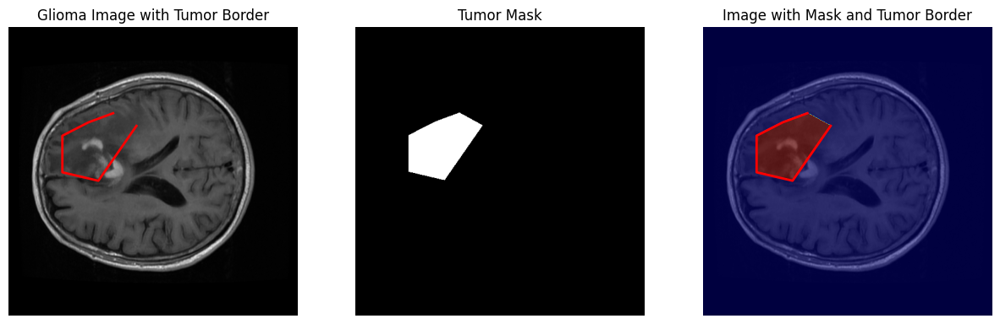

In [ ]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# Path to the .mat file
glioma_sample = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/715.mat"

# Function to extract and plot the image, mask, and tumor border
def extract_and_plot(mat_file_path):
    # Open the .mat file
    with h5py.File(mat_file_path, 'r') as f:
        cjdata = f['cjdata']

        # Extract the image, mask, and tumor border
        image = np.array(cjdata['image'])
        tumor_mask = np.array(cjdata['tumorMask'])
        tumor_border = np.array(cjdata['tumorBorder']).flatten()

    # Extract x and y coordinates of the tumor border
    x_coords = tumor_border[1::2]
    y_coords = tumor_border[::2]

    # Plot the image, mask, and tumor border
    plt.figure(figsize=(15, 5))

    # Plot the image with the tumor border outlined
    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.plot(x_coords, y_coords, 'r-', linewidth=2)
    plt.title('Glioma Image with Tumor Border')
    plt.axis('off')

    # Plot the mask
    plt.subplot(1, 3, 2)
    plt.imshow(tumor_mask, cmap='gray')
    plt.title('Tumor Mask')
    plt.axis('off')

    # Overlay the mask on the image
    plt.subplot(1, 3, 3)
    plt.imshow(image, cmap='gray')
    plt.imshow(tumor_mask, cmap='jet', alpha=0.5)  # Overlay with transparency
    plt.plot(x_coords, y_coords, 'r-', linewidth=2)
    plt.title('Image with Mask and Tumor Border')
    plt.axis('off')

    # Show the plots
    plt.show()

# Call the function to extract and plot
extract_and_plot(glioma_sample)


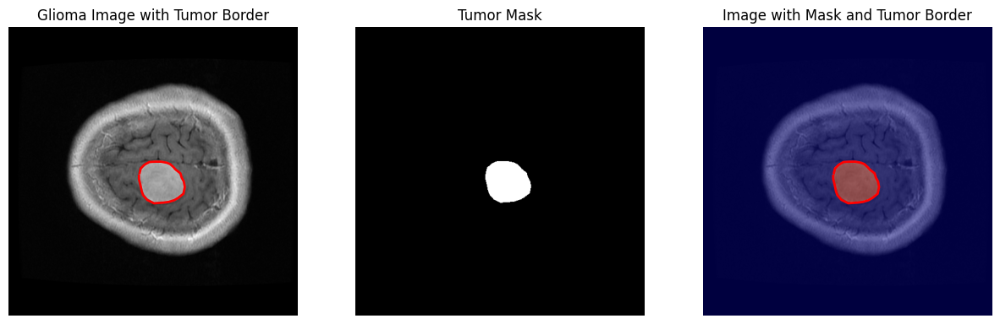

In [ ]:
# plotting the meningioma sample
extract_and_plot(meningioma_sample)

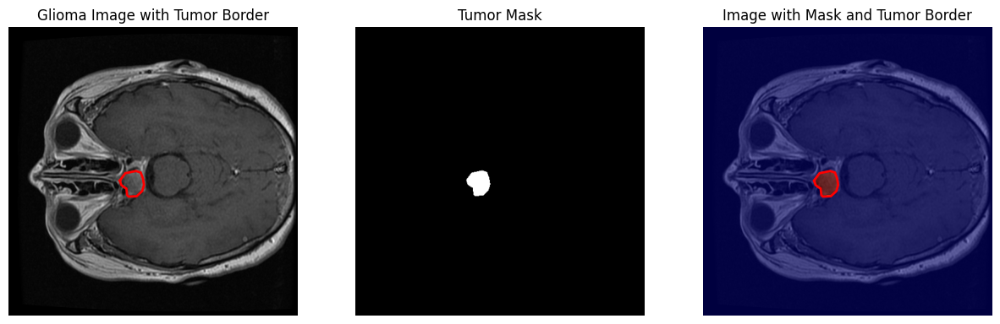

In [ ]:
# plotting the pituitary sample
extract_and_plot(pituitary_sample)


### Saving the Images in .png format across all the classes for both training and validation

In [ ]:
import os
import h5py
import numpy as np
from PIL import Image

# Base directories for the existing data and the new prepared dataset
existing_base_dir = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/"
new_base_dir = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/"

# Ensure the directory structure is created
def create_dirs_for_images(base_dir):
    subdirs = ['train', 'val', 'test']
    class_folders = ['glioma', 'meningioma', 'pituitary']
    for subdir in subdirs:
        for class_folder in class_folders:
            os.makedirs(os.path.join(base_dir, subdir, 'images', class_folder), exist_ok=True)

# Create the directory structure for images
create_dirs_for_images(new_base_dir)

# Function to extract and save image data from .mat file
def extract_and_save_image(file_path, new_images_dir):
    with h5py.File(file_path, 'r') as f:
        cjdata = f['cjdata']

        # Extract image data
        image = np.array(cjdata['image'])

        # Scale the image data to 0-255 if necessary
        if image.dtype != np.uint8:
            image = ((image - image.min()) / (image.max() - image.min()) * 255).astype(np.uint8)

        # Convert the image array to a PIL image
        image = Image.fromarray(image)

        # Create a new filename for the image
        image_filename = os.path.splitext(os.path.basename(file_path))[0] + '.png'
        image_path = os.path.join(new_images_dir, image_filename)

        # Ensure the directory exists
        os.makedirs(new_images_dir, exist_ok=True)

        # Save the image
        image.save(image_path)

# Function to process the files in a given directory
def process_files_for_images(subdir, class_folder):
    class_dir = os.path.join(existing_base_dir, subdir, class_folder)
    new_images_dir = os.path.join(new_base_dir, subdir, 'images', class_folder)

    if not os.path.exists(class_dir):
        print(f"Directory does not exist: {class_dir}")
        return

    file_names = os.listdir(class_dir)
    print(f"Found {len(file_names)} files in {class_dir}")

    for file_name in file_names:
        if file_name.endswith('.mat'):
            file_path = os.path.join(class_dir, file_name)
            print(f"Processing file: {file_path}")
            extract_and_save_image(file_path, new_images_dir)
            print(f"Saved image to {new_images_dir}")

# Function to count the number of files in each class folder
def count_files_in_folders(base_dir):
    counts = {}
    subdirs = ['train', 'val', 'test']
    class_folders = ['glioma', 'meningioma', 'pituitary']
    for subdir in subdirs:
        for class_folder in class_folders:
            folder_path = os.path.join(base_dir, subdir, 'images', class_folder)
            if os.path.exists(folder_path):
                file_count = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
                counts[f'{subdir}/images/{class_folder}'] = file_count
            else:
                counts[f'{subdir}/images/{class_folder}'] = 0
    return counts

# Process the files for each subdir and class folder
subdirs = ['train', 'val', 'test']
class_folders = ['glioma', 'meningioma', 'pituitary']

for subdir in subdirs:
    for class_folder in class_folders:
        process_files_for_images(subdir, class_folder)

# Count the number of image files in each folder
image_file_counts = count_files_in_folders(new_base_dir)

# Print the counts
for folder, count in image_file_counts.items():
    print(f'{folder}: {count} files')


Streaming output truncated to the last 5000 lines.
Saved image to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/images/glioma
Processing file: /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/892.mat
Saved image to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/images/glioma
Processing file: /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/891.mat
Saved image to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/images/glioma
Processing file: /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/glioma/867.mat
Saved image to /content/drive/My Drive/multidisciplinary_p

### Saving the Masks for the various classes across training and testing groups

In [ ]:
import os
import h5py
import numpy as np
from PIL import Image

# Base directories for the existing data and the new prepared dataset
existing_base_dir = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/"
new_base_dir = "/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/"

# Ensure the directory structure is created
def create_dirs_for_masks(base_dir):
    subdirs = ['train', 'val', 'test']
    class_folders = ['glioma', 'meningioma', 'pituitary']
    for subdir in subdirs:
        for class_folder in class_folders:
            os.makedirs(os.path.join(base_dir, subdir, 'masks', class_folder), exist_ok=True)

# Create the directory structure for masks
create_dirs_for_masks(new_base_dir)

# Function to extract and save mask data from .mat file
def extract_and_save_mask(file_path, new_masks_dir):
    with h5py.File(file_path, 'r') as f:
        cjdata = f['cjdata']

        # Check if the 'tumorMask' dataset exists
        if 'tumorMask' not in cjdata:
            print(f"Warning: 'tumorMask' dataset not found in file {file_path}. Skipping file.")
            return

        # Extract mask data
        tumor_mask = np.array(cjdata['tumorMask'])
        unique_values = np.unique(tumor_mask)
        print(f"Extracted mask shape: {tumor_mask.shape}, dtype: {tumor_mask.dtype}, unique values: {unique_values}")

        # Check if the mask contains binary values
        if set(unique_values) not in [{0}, {1}, {0, 1}]:
            print(f"Warning: Mask in file {file_path} does not contain binary values. Unique values: {unique_values}")

        # Convert binary mask to 0-255 range for visualization
        tumor_mask = (tumor_mask * 255).astype(np.uint8)

        # Convert the mask array to a PIL image
        mask_image = Image.fromarray(tumor_mask)

        # Create a new filename for the mask
        mask_filename = os.path.splitext(os.path.basename(file_path))[0] + '_mask.png'
        mask_path = os.path.join(new_masks_dir, mask_filename)

        # Ensure the directory exists
        os.makedirs(new_masks_dir, exist_ok=True)

        # Save the mask
        mask_image.save(mask_path)
        print(f"Saved mask to {mask_path}")

# Function to process the files in a given directory for masks
def process_files_for_masks(subdir, class_folder):
    class_dir = os.path.join(existing_base_dir, subdir, class_folder)
    new_masks_dir = os.path.join(new_base_dir, subdir, 'masks', class_folder)

    if not os.path.exists(class_dir):
        print(f"Directory does not exist: {class_dir}")
        return

    file_names = os.listdir(class_dir)
    print(f"Found {len(file_names)} files in {class_dir}")

    for file_name in file_names:
        if file_name.endswith('.mat'):
            file_path = os.path.join(class_dir, file_name)
            print(f"Processing file: {file_path}")
            extract_and_save_mask(file_path, new_masks_dir)

# Function to count the number of files in each class folder
def count_files_in_folders(base_dir):
    counts = {}
    subdirs = ['train', 'val', 'test']
    class_folders = ['glioma', 'meningioma', 'pituitary']
    for subdir in subdirs:
        for class_folder in class_folders:
            folder_path = os.path.join(base_dir, subdir, 'masks', class_folder)
            if os.path.exists(folder_path):
                file_count = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
                counts[f'{subdir}/masks/{class_folder}'] = file_count
            else:
                counts[f'{subdir}/masks/{class_folder}'] = 0
    return counts

# Process the files for each subdir and class folder
subdirs = ['train', 'val', 'test']
class_folders = ['glioma', 'meningioma', 'pituitary']

for subdir in subdirs:
    for class_folder in class_folders:
        process_files_for_masks(subdir, class_folder)

# Count the number of mask files in each folder
mask_file_counts = count_files_in_folders(new_base_dir)

# Print the counts
for folder, count in mask_file_counts.items():
    print(f'{folder}: {count} files')


Streaming output truncated to the last 5000 lines.
Extracted mask shape: (512, 512), dtype: uint8, unique values: [0 1]
Saved mask to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/masks/pituitary/1410_mask.png
Processing file: /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/pituitary/1375.mat
Extracted mask shape: (512, 512), dtype: uint8, unique values: [0 1]
Saved mask to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/masks/pituitary/1375_mask.png
Processing file: /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_data/train/pituitary/1389.mat
Extracted mask shape: (512, 512), dtype: uint8, unique values: [0 1]
Saved mask to /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_s

In [ ]:
type(tumorBorder_array)

In [ ]:
# datapath for the subsequent sessions
project_directory  = "/content/drive/My Drive/patient_split_image_with_masks/"


# 3. Machine Learning

1. Feature Engineering (image processing will be covered in the Image Analysis part)
  - Feature selection
  - Feature reduction

2. Model training
3. Hyperparameter Tuning

3. Model Evaluation (Performance metrics)
- specificity
- sensitivity
- balanced accuracy metric (weighted accuracy)

4. Comparison between the experimented models








In [ ]:
# prints the folders present in our project directory
print(os.listdir(project_directory))

['train', 'val', 'test']


### Feature extraction

#### Feature extractor 1: Grey-Level Co-Occurence Matrix

Histogram-based texture descriptor which are second order statistical features.
The descriptors are:

1. Correlations
2. contrast
3. uniformity
4. homogeneity
5. entropy


for the first iteration, we will overlay the tumor masks of the images on the images, to specify the ROI on which to extract the GLCM descriptors.

In [ ]:
import numpy as np
import cv2
from skimage.feature import graycomatrix, graycoprops

def extract_glcm_features(image_path, mask_path, distances, angles):

    # convert path to string
    image_path = str(image_path)
    mask_path = str(mask_path)

    # Load the images
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Check if image and mask are loaded correctly
    if image is None:
        raise ValueError("Image not loaded correctly. Check the file path.")
    if mask is None:
        raise ValueError("Mask not loaded correctly. Check the file path.")

    # Apply the mask to isolate the tumor region
    tumor_region = image[mask == 255]  # Assuming mask is binary with 255 as the region of interest

    # Ensure the tumor region is not empty
    if tumor_region.size == 0:
        raise ValueError("Tumor region is empty. Check the mask.")

    # Reshape the tumor region to 2D for GLCM computation
    tumor_region_reshaped = tumor_region.reshape(-1, 1)

    # Compute GLCM on the tumor region
    glcm = graycomatrix(tumor_region_reshaped, distances=distances, angles=angles, symmetric=True, normed=True)

    # Extract GLCM properties
    contrast = graycoprops(glcm, 'contrast')
    correlation = graycoprops(glcm, 'correlation')
    energy = graycoprops(glcm, 'energy')
    homogeneity = graycoprops(glcm, 'homogeneity')

    # Custom entropy calculation
    entropy = -np.sum(glcm * np.log2(glcm + (glcm == 0)))

    # Aggregate features
    features = np.hstack([contrast.ravel(), correlation.ravel(), energy.ravel(), homogeneity.ravel(), entropy])

    return features


In [ ]:
def apply_clahe(image):
    # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    clahe_image = clahe.apply(image)
    return clahe_image

def apply_nlm_filter(image, h=10, templateWindowSize=7, searchWindowSize=21):
    # Apply Non-local Means filtering
    nlm_filtered = cv2.fastNlMeansDenoising(image, h=h, templateWindowSize=templateWindowSize, searchWindowSize=searchWindowSize)
    return nlm_filtered

def preprocess_image(image_path, mask_path):
    # Load the image and mask
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Apply CLAHE
    clahe_image = apply_clahe(image)

    # Apply Non-Local Means filtering
    nlm_filtered_image = apply_nlm_filter(clahe_image)

    # Apply mask
    masked_image = cv2.bitwise_and(nlm_filtered_image, nlm_filtered_image, mask=mask)

    return masked_image


In [ ]:

# Example usage
# to view the features being extracted
distances = [1, 2, 3]
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

features = extract_glcm_features(mening, mening_mask, distances, angles)
print(features)


[0.00000000e+00 0.00000000e+00 1.50130692e+02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 3.42006131e+02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 5.01386772e+02 0.00000000e+00
 1.00000000e+00 1.00000000e+00 8.68054654e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 6.99291014e-01 1.00000000e+00
 1.00000000e+00 1.00000000e+00 5.59130286e-01 1.00000000e+00
 0.00000000e+00 0.00000000e+00 3.20602796e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.48302464e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.27728356e-02 0.00000000e+00
 0.00000000e+00 0.00000000e+00 2.66122349e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.53260610e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00 1.18955062e-01 0.00000000e+00
 3.31550773e+01]


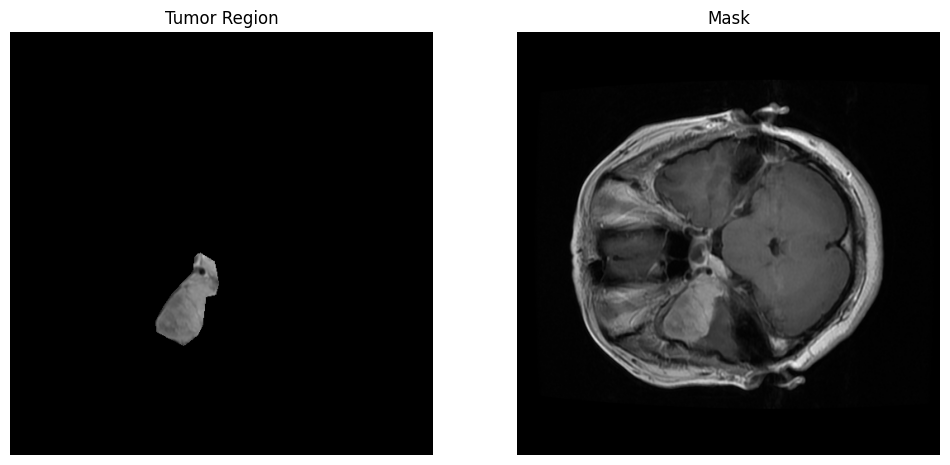

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the images
mening_mask_img = cv2.imread(mening_mask, cv2.IMREAD_GRAYSCALE)
mening_img = cv2.imread(mening)

# Normalize the mask
mask = mening_mask_img / 255 if mening_mask_img.max() > 1 else mening_mask_img

# Create an image showing the tumor region (masked)
tumor_region = np.zeros_like(mening_img)
tumor_region[mening_mask_img == 255] = mening_img[mening_mask_img == 255]

# Display the images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Display tumor region image
axs[0].imshow(cv2.cvtColor(tumor_region, cv2.COLOR_BGR2RGB))
axs[0].set_title('Tumor Region')
axs[0].axis('off')

# Display mask image
axs[1].imshow(mening_img, cmap='gray')
axs[1].set_title('Mask')
axs[1].axis('off')

plt.show()



In [ ]:
def load_data(images_dir, masks_dir, distances, angles):
    X = []
    y = []

    for class_name in os.listdir(images_dir):
        class_image_dir = os.path.join(images_dir, class_name)
        class_mask_dir = os.path.join(masks_dir, class_name)

        if os.path.isdir(class_image_dir) and os.path.isdir(class_mask_dir):
            for image_name in os.listdir(class_image_dir):
                image_path = os.path.join(class_image_dir, image_name)
                mask_path = os.path.join(class_mask_dir, image_name.replace(".png", "_mask.png"))

                if os.path.exists(image_path) and os.path.exists(mask_path):
                    # Convert Path to str for cv2.imread
                    image_path = str(image_path)
                    mask_path = str(mask_path)

                    # Extract GLCM features
                    try:
                        features = extract_glcm_features(image_path, mask_path, distances, angles)
                        # Append features and label
                        X.append(features)
                        y.append(class_name)
                    except ValueError as e:
                        print(f"Error processing {image_path} and {mask_path}: {e}")
                        continue

    return np.array(X), np.array(y)

In [ ]:
def visualize_image_and_mask(image_path, mask_path):
    # Convert Path to str for cv2.imread
    image_path = str(image_path)
    mask_path = str(mask_path)

    # Read image and mask
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Check if image and mask are loaded correctly
    if image is None:
        raise ValueError(f"Image not loaded correctly: {image_path}")
    if mask is None:
        raise ValueError(f"Mask not loaded correctly: {mask_path}")

    # Create an overlay
    overlay = cv2.addWeighted(image, 0.7, (mask * 255).astype(np.uint8), 0.3, 0)

    # Plotting
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(image, cmap='gray')
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(mask, cmap='gray')
    ax[1].set_title('Tumor Mask')
    ax[1].axis('off')

    ax[2].imshow(overlay, cmap='gray')
    ax[2].set_title('Overlay')
    ax[2].axis('off')

    plt.show()


# Parameters for GLCM
distances = [1]  # Pixel pair distance
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # Pixel pair angles

In [ ]:

# Define the base directory for the project
project_directory = Path("/content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/")

# Define the dataset directories using pathlib
train_images_dir = project_directory / 'train/images'
train_masks_dir = project_directory / 'train/masks'
val_images_dir = project_directory / 'val/images'
val_masks_dir = project_directory / 'val/masks'
test_images_dir = project_directory / 'test/images'
test_masks_dir = project_directory / 'test/masks'


In [ ]:
# Feature selection on the various datasets
X_train_glcm, y_train_glcm = load_data(train_images_dir, train_masks_dir, distances, angles)
X_val_glcm, y_val_glcm = load_data(val_images_dir, val_masks_dir, distances, angles)
X_test_glcm, y_test_glcm = load_data(test_images_dir, test_masks_dir, distances, angles)

In [ ]:
X_train_glcm.shape

(1490, 17)

#####  Model Training - GLCM

##### Model 1 - Logistic Regression

In [ ]:
# Encode the labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_glcm)
y_val_encoded = label_encoder.transform(y_val_glcm)
y_test_encoded = label_encoder.transform(y_test_glcm)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_glcm)
X_validation_scaled = scaler.transform(X_val_glcm)
X_test_scaled = scaler.transform(X_test_glcm)

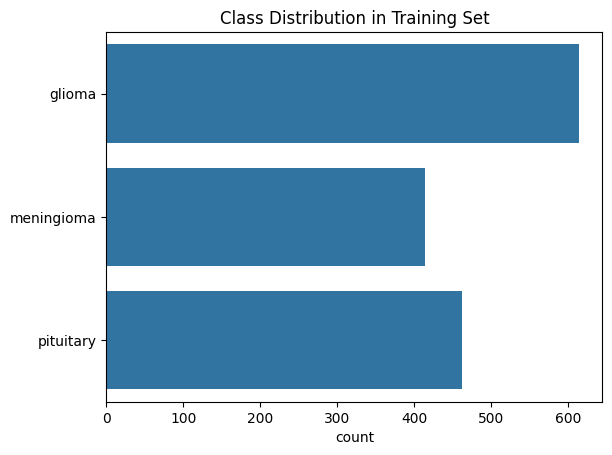

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot class distribution
sns.countplot(y_train_glcm)
plt.title('Class Distribution in Training Set')
plt.show()


In [ ]:
from sklearn.linear_model import LogisticRegression

# Initialize the logistic regression model for multi-class classification
model_lr = LogisticRegression(multi_class='ovr', solver='liblinear', class_weight="balanced")

# Train the model
model_lr.fit(X_train_scaled, y_train_encoded)


# Evaluate the model on the validation set (optional)
y_val_pred = model_lr.predict(X_validation_scaled)
val_accuracy = accuracy_score(y_val_encoded, y_val_pred)
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')


Validation Accuracy: 68.63%


In [ ]:
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = [
    {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
     'solver': ['liblinear'],
     'penalty': ['l1', 'l2'],
     'class_weight': ['balanced', None]},
    {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
     'solver': ['newton-cg', 'lbfgs'],
     'penalty': ['l2'],
     'class_weight': ['balanced', None]},
    {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
     'solver': ['saga'],
     'penalty': [ 'elasticnet'],
     'l1_ratio': [0.5],
     'class_weight': ['balanced', None]},
]
# Initialize the grid search
grid_search = GridSearchCV(LogisticRegression(multi_class='ovr', max_iter=2000, tol=1e-4, class_weight='balanced'), param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train_scaled, y_train_encoded)

# Best parameters
best_params = grid_search.best_params_
print(f'Best Parameters: {best_params}')



Best Parameters: {'C': 1, 'class_weight': None, 'penalty': 'l2', 'solver': 'liblinear'}


In [ ]:
# Evaluate the best model on the validation set
best_model = grid_search.best_estimator_
y_val_pred = best_model.predict(X_validation_scaled)
val_accuracy = accuracy_score(y_val_encoded, y_val_pred)
print(f'Validation Accuracy after Hyperparameter Tuning: {val_accuracy * 100:.2f}%')


Validation Accuracy after Hyperparameter Tuning: 70.74%


In [ ]:
# Make predictions on the test data
y_test_pred = best_model.predict(X_test_scaled)

# Calculate accuracy
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate classification report
report = classification_report(y_test_encoded, y_test_pred, target_names=['glioma', 'meningioma', 'pituitary'])
print('Test Classification Report:')
print(report)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
print('Test Confusion Matrix:')
print(conf_matrix)

Test Accuracy: 66.19%
Test Classification Report:
              precision    recall  f1-score   support

      glioma       0.71      0.77      0.74       446
  meningioma       0.56      0.25      0.34       194
   pituitary       0.62      0.77      0.69       271

    accuracy                           0.66       911
   macro avg       0.63      0.60      0.59       911
weighted avg       0.65      0.66      0.64       911

Test Confusion Matrix:
[[345  25  76]
 [ 95  48  51]
 [ 49  12 210]]


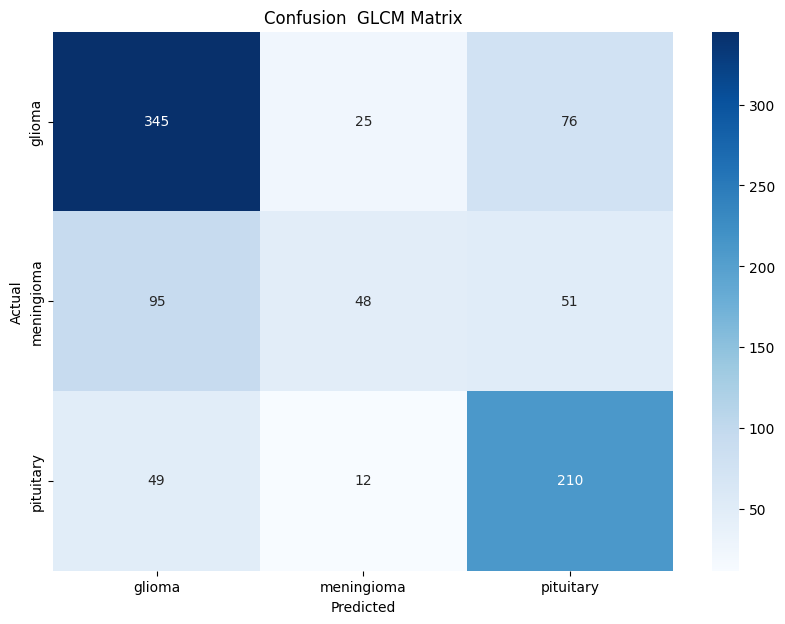

In [ ]:
# confusion matrix

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion  GLCM Matrix')
plt.show()

RFE - Recursive Feature Elimination (RFE) to further reduce the feature set after the PCA.

When PCA was used initially, the meningioma class had 0 recorded for the precision and recall


In [ ]:
from sklearn.feature_selection import RFE

# Apply PCA
pca = PCA(n_components=0.95)  # Retain 95% of variance
X_train_pca = pca.fit_transform(X_train_scaled)
X_validation_pca = pca.transform(X_validation_scaled)
X_test_pca = pca.transform(X_test_scaled)


# Apply RFE for further feature reduction
model_rfe = LogisticRegression(multi_class='ovr', solver='liblinear', class_weight='balanced')
rfe = RFE(model_rfe, n_features_to_select=10)  # Adjust n_features_to_select as needed
X_train_rfe = rfe.fit_transform(X_train_pca, y_train_encoded)
X_validation_rfe = rfe.transform(X_validation_pca)
X_test_rfe = rfe.transform(X_test_pca)

In [ ]:
# Initialize the logistic regression model for multi-class classification
model = LogisticRegression(multi_class='ovr', solver='liblinear', class_weight='balanced')

# Fit the model on the training data
model.fit(X_train_rfe, y_train_encoded)

# Evaluate the model on the validation set
y_val_pred = model.predict(X_validation_rfe)
val_accuracy = accuracy_score(y_val_encoded, y_val_pred)
print(f'Validation Accuracy after RFE: {val_accuracy * 100:.2f}%')


Validation Accuracy after RFE: 63.95%


In [ ]:
# Evaluate Model on the Test Set
y_test_pred = model.predict(X_test_rfe)
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)
print(f'Test Accuracy after RFE: {test_accuracy * 100:.2f}%')

# Generate classification report
report = classification_report(y_test_encoded, y_test_pred, target_names=['glioma', 'meningioma', 'pituitary'], zero_division=0)
print('Classification Report:')
print(report)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
print('Confusion Matrix:')
print(conf_matrix)

Test Accuracy after RFE: 61.69%
Classification Report:
              precision    recall  f1-score   support

      glioma       0.70      0.77      0.73       446
  meningioma       0.32      0.07      0.12       194
   pituitary       0.55      0.76      0.64       271

    accuracy                           0.62       911
   macro avg       0.52      0.53      0.49       911
weighted avg       0.57      0.62      0.57       911

Confusion Matrix:
[[342  20  84]
 [ 93  14  87]
 [ 55  10 206]]


Feature reduction on the glcm features affects the least class, as the recall is nearing 0.

Bayesian optimisation on the Logistic Regressor

In [ ]:
# Define the objective function for Optuna
def objective(trial):
    # Define the hyperparameter search space
    C = trial.suggest_float('C', 1e-6, 1e+6, log=True)
    solver = trial.suggest_categorical('solver', ['liblinear', 'saga'])
    penalty = trial.suggest_categorical('penalty', ['l1', 'l2'])
    class_weight = trial.suggest_categorical('class_weight', ['balanced', None])
    max_iter = trial.suggest_int('max_iter', 100, 2000)

    # Initialize the logistic regression model with the suggested hyperparameters
    model = LogisticRegression(multi_class='ovr', C=C, solver=solver, penalty=penalty, class_weight=class_weight, max_iter=max_iter)

    # Perform cross-validation on the training set and return the mean accuracy
    score = cross_val_score(model, X_train_scaled, y_train_encoded, cv=5, scoring='accuracy').mean()
    return score

In [ ]:
# Create the Optuna study and optimize
import optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100, timeout=1200)

# Print the best hyperparameters
best_params = study.best_trial.params
print(f'Best Parameters: {best_params}')

# Train the model with the best hyperparameters on the training set
best_model = LogisticRegression(multi_class='ovr', **best_params)
best_model.fit(X_train_scaled, y_train_encoded)

[I 2024-06-30 07:36:16,599] A new study created in memory with name: no-name-3d1687ca-7115-47de-b858-6f209a52d1a0
[I 2024-06-30 07:36:16,844] Trial 0 finished with value: 0.621476510067114 and parameters: {'C': 8657.689851509343, 'solver': 'liblinear', 'penalty': 'l1', 'class_weight': None, 'max_iter': 1804}. Best is trial 0 with value: 0.621476510067114.
[I 2024-06-30 07:36:16,915] Trial 1 finished with value: 0.5738255033557047 and parameters: {'C': 0.018442209616187675, 'solver': 'liblinear', 'penalty': 'l1', 'class_weight': 'balanced', 'max_iter': 869}. Best is trial 0 with value: 0.621476510067114.
[I 2024-06-30 07:36:19,253] Trial 2 finished with value: 0.6221476510067114 and parameters: {'C': 2.9810352624450056, 'solver': 'saga', 'penalty': 'l2', 'class_weight': None, 'max_iter': 1166}. Best is trial 2 with value: 0.6221476510067114.
[I 2024-06-30 07:36:21,663] Trial 3 finished with value: 0.621476510067114 and parameters: {'C': 1.945970428434751, 'solver': 'saga', 'penalty': 'l

Best Parameters: {'C': 1.2756617082623005, 'solver': 'saga', 'penalty': 'l2', 'class_weight': None, 'max_iter': 886}


LogisticRegression(C=1.2756617082623005, max_iter=886, multi_class='ovr',
                   solver='saga')

In [ ]:
# Evaluate the model on the validation set
y_val_pred = best_model.predict(X_validation_scaled)
val_accuracy = accuracy_score(y_val_encoded, y_val_pred)
print(f'Validation Accuracy after Optuna Optimization: {val_accuracy * 100:.2f}%')


Validation Accuracy after Optuna Optimization: 70.74%


In [ ]:
# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test_scaled)
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)
print(f'Test Accuracy after Optuna Optimization: {test_accuracy * 100:.2f}%')

# Generate classification report
report = classification_report(y_test_encoded, y_test_pred, target_names=['glioma', 'meningioma', 'pituitary'], zero_division=0)
print('Classification Report:')
print(report)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
print('Confusion Matrix:')
print(conf_matrix)

Test Accuracy after Optuna Optimization: 65.86%
Classification Report:
              precision    recall  f1-score   support

      glioma       0.70      0.77      0.73       446
  meningioma       0.55      0.25      0.35       194
   pituitary       0.62      0.77      0.69       271

    accuracy                           0.66       911
   macro avg       0.63      0.60      0.59       911
weighted avg       0.65      0.66      0.64       911

Confusion Matrix:
[[343  27  76]
 [ 95  49  50]
 [ 50  13 208]]


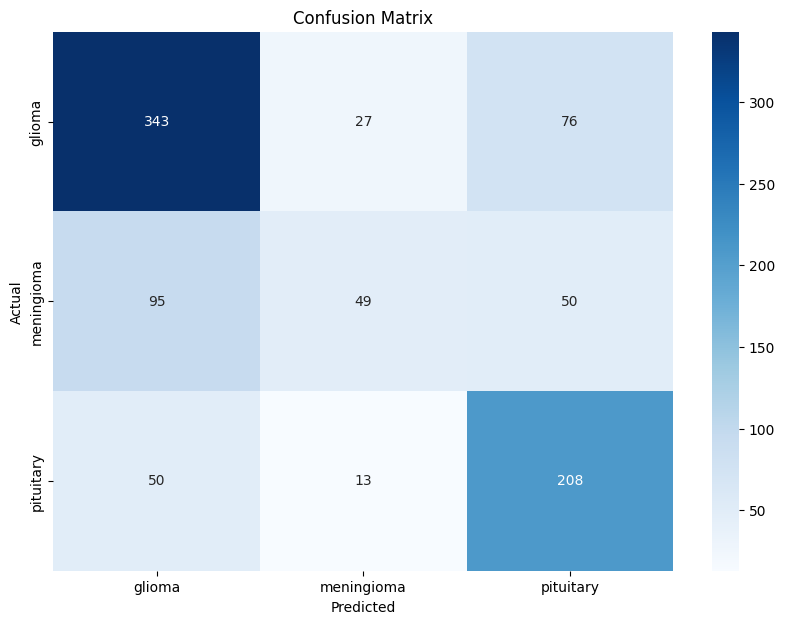

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

##### Model 2: Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier

random_forest_classifier = RandomForestClassifier(n_estimators = 1000, random_state = 42)
random_forest_classifier.fit(X_train_glcm, y_train_glcm)

RandomForestClassifier(n_estimators=1000, random_state=42)

In [ ]:
# validation
y_val_pred = random_forest_classifier.predict(X_val_glcm)

In [ ]:
print("Validation Accuracy:", accuracy_score(y_val_glcm, y_val_pred))
print("Validation Classification Report:\n", classification_report(y_val_glcm, y_val_pred))

Validation Accuracy: 0.702865761689291
Validation Classification Report:
               precision    recall  f1-score   support

      glioma       0.82      0.79      0.80       366
  meningioma       0.34      0.35      0.34       100
   pituitary       0.69      0.73      0.71       197

    accuracy                           0.70       663
   macro avg       0.61      0.62      0.62       663
weighted avg       0.71      0.70      0.71       663



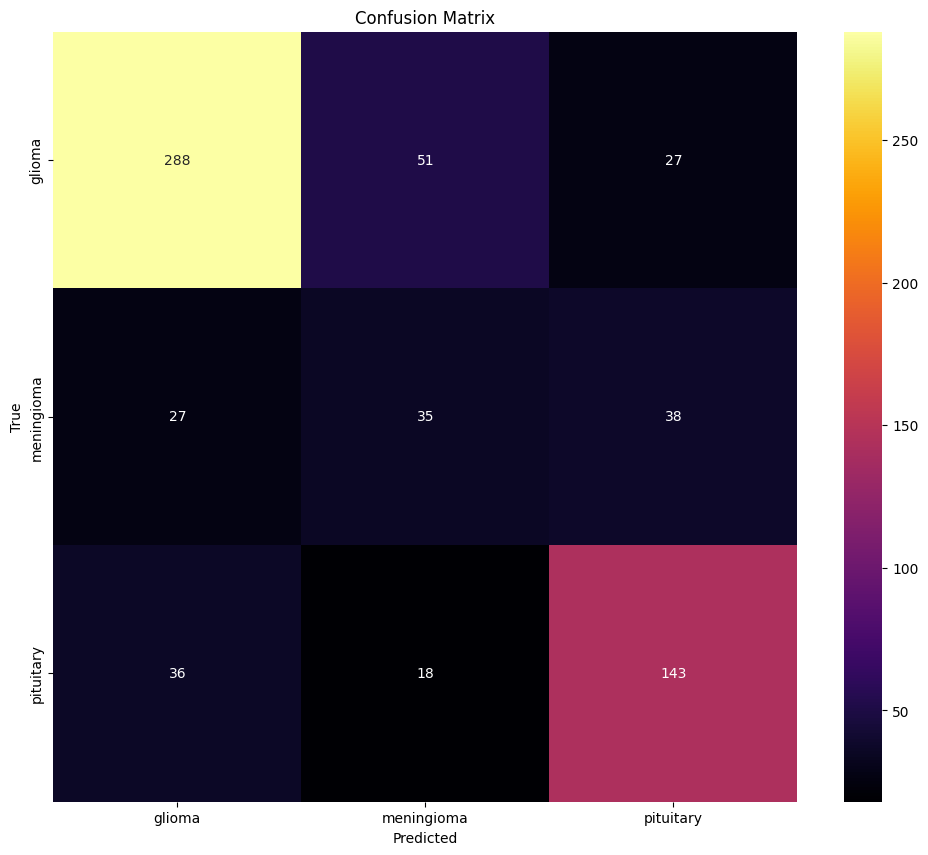

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_val_glcm, y_val_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='inferno', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


###### Hyperparameter tuning


In [ ]:
from sklearn.model_selection import GridSearchCV, train_test_split

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'criterion':['entropy', 'gini'],
    'max_depth': [3, 5, 7, 9, 13]
}

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Perform the grid search on the training data
grid_search.fit(X_train_glcm, y_train_glcm)

# Print the best parameters and the best score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'criterion': 'gini', 'max_depth': 9, 'n_estimators': 100}
Best Cross-Validation Score: 0.6382550335570469


In [ ]:
from sklearn.model_selection import GridSearchCV, train_test_split, StratifiedKFold

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=cv, n_jobs=-1, verbose=2)
grid_search.fit(X_train_glcm, y_train_glcm)

# Print the best parameters and the best score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'criterion': 'gini', 'max_depth': 9, 'n_estimators': 2000}
Best Cross-Validation Score: 0.6604026845637584


In [ ]:
# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_test_pred = best_rf.predict(X_val_glcm)

# Evaluate the performance on the test set
print("Validation Accuracy(after optimisation):", accuracy_score(y_val_glcm, y_val_pred))
print("Validation Classification Report(after optimisation):\n", classification_report(y_val_glcm, y_val_pred))

Validation Accuracy(after optimisation): 0.702865761689291
Validation Classification Report(after optimisation):
               precision    recall  f1-score   support

      glioma       0.82      0.79      0.80       366
  meningioma       0.34      0.35      0.34       100
   pituitary       0.69      0.73      0.71       197

    accuracy                           0.70       663
   macro avg       0.61      0.62      0.62       663
weighted avg       0.71      0.70      0.71       663



In [ ]:
# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_test_pred = best_rf.predict(X_test_glcm)

# Evaluate the performance on the test set
print("Testing Accuracy(after optimisation):", accuracy_score(y_test_glcm, y_test_pred))
print("Testing Classification Report(after optimisation):\n", classification_report(y_test_glcm, y_test_pred))

Testing Accuracy(after optimisation): 0.6410537870472008
Testing Classification Report(after optimisation):
               precision    recall  f1-score   support

      glioma       0.73      0.74      0.73       446
  meningioma       0.45      0.32      0.37       194
   pituitary       0.60      0.70      0.65       271

    accuracy                           0.64       911
   macro avg       0.59      0.59      0.59       911
weighted avg       0.63      0.64      0.63       911



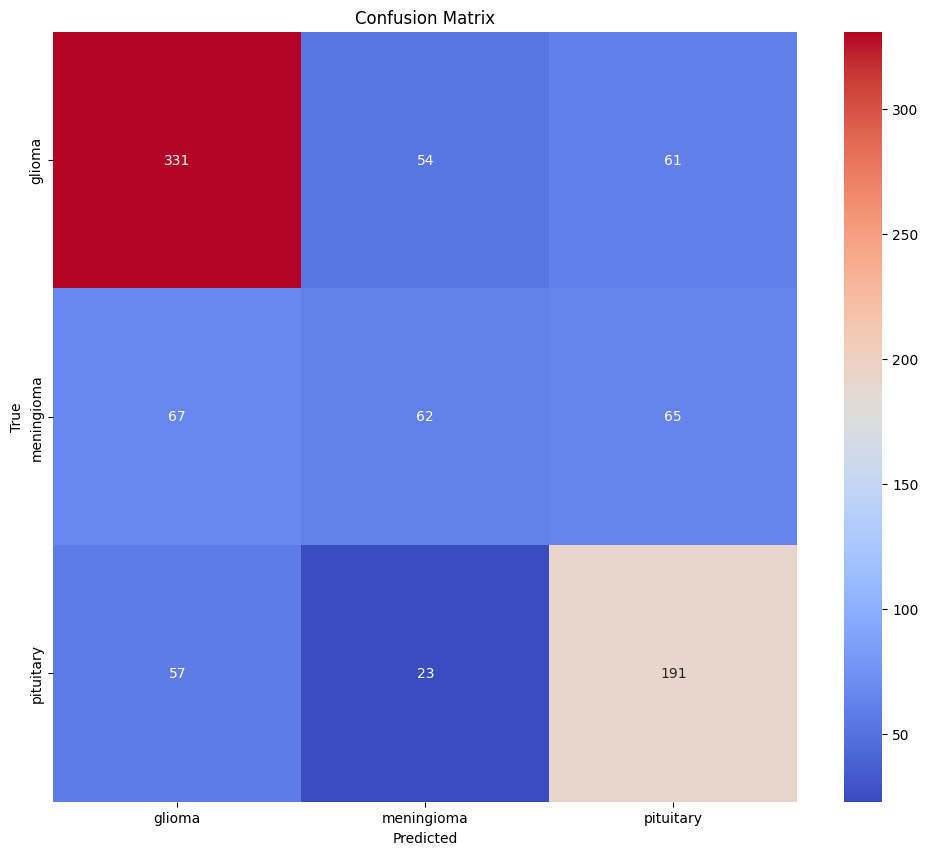

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_glcm, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


###### Bayesian optimisation - hyperparameter tuning

In [ ]:

# Resample the training data using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_glcm, y_train_glcm)

# Define an objective function for the optimization
def objective(trial):
    # Define the hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 100, 2000)
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])
   # max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2'])
    max_depth = trial.suggest_int('max_depth', 3, 13)

    # Initialize the RandomForestClassifier with the suggested hyperparameters
    rf = RandomForestClassifier(
        n_estimators=n_estimators,
        criterion=criterion,
       # max_features=max_features,
        max_depth=max_depth,
        random_state=42
    )

    # Perform cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(rf, X_train_resampled, y_train_resampled, cv=cv, n_jobs=-1, scoring='accuracy')
    return scores.mean()


# Create a study object and optimize the objective function
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, n_jobs=-1)

# Print the best hyperparameters
print("Best Parameters:", study.best_params)
print("Best Cross-Validation Score:", study.best_value)



[I 2024-06-30 08:00:11,545] A new study created in memory with name: no-name-f7e6dd8a-6c12-4da5-a645-0da20ec2b2de
[I 2024-06-30 08:00:33,215] Trial 0 finished with value: 0.6617709437963945 and parameters: {'n_estimators': 155, 'criterion': 'entropy', 'max_depth': 8}. Best is trial 0 with value: 0.6617709437963945.
[I 2024-06-30 08:00:39,926] Trial 1 finished with value: 0.6764286555909037 and parameters: {'n_estimators': 1243, 'criterion': 'gini', 'max_depth': 13}. Best is trial 1 with value: 0.6764286555909037.
[I 2024-06-30 08:01:08,224] Trial 3 finished with value: 0.6161938847649346 and parameters: {'n_estimators': 957, 'criterion': 'gini', 'max_depth': 4}. Best is trial 1 with value: 0.6764286555909037.
[I 2024-06-30 08:01:11,793] Trial 2 finished with value: 0.6340947920348768 and parameters: {'n_estimators': 1785, 'criterion': 'gini', 'max_depth': 5}. Best is trial 1 with value: 0.6764286555909037.
[I 2024-06-30 08:01:47,014] Trial 4 finished with value: 0.6715461882879699 and 

Best Parameters: {'n_estimators': 1832, 'criterion': 'entropy', 'max_depth': 13}
Best Cross-Validation Score: 0.6845661010957935


In [ ]:
# Train the best model on the full training set
best_rf = RandomForestClassifier(
    n_estimators=study.best_params['n_estimators'],
    criterion=study.best_params['criterion'],
    # max_features=study.best_params['max_features'],
    max_depth=study.best_params['max_depth'],
    random_state=42
)
best_rf.fit(X_train_glcm, y_train_glcm)

# Evaluate the best model on the validation set
y_val_pred = best_rf.predict(X_val_glcm)
print("Validation Accuracy:", accuracy_score(y_val_glcm, y_val_pred))
print("Validation Classification Report:")
print(classification_report(y_val_glcm, y_val_pred))

Validation Accuracy: 0.7043740573152338
Validation Classification Report:
              precision    recall  f1-score   support

      glioma       0.82      0.80      0.81       366
  meningioma       0.35      0.35      0.35       100
   pituitary       0.69      0.71      0.70       197

    accuracy                           0.70       663
   macro avg       0.62      0.62      0.62       663
weighted avg       0.71      0.70      0.71       663



In [ ]:
# Evaluate the final model on the test set
y_test_pred = best_rf.predict(X_test_glcm)
print("Test Accuracy:", accuracy_score(y_test_glcm, y_test_pred))
print("Test Classification Report:")
print(classification_report(y_test_glcm, y_test_pred))


Test Accuracy: 0.6267837541163557
Test Classification Report:
              precision    recall  f1-score   support

      glioma       0.74      0.72      0.73       446
  meningioma       0.41      0.33      0.37       194
   pituitary       0.58      0.68      0.63       271

    accuracy                           0.63       911
   macro avg       0.58      0.58      0.57       911
weighted avg       0.62      0.63      0.62       911



##### RandomForest One-vs-All

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Get the unique classes
classes = np.unique(y_train_glcm)
print(classes, y_train_glcm.shape)

['glioma' 'meningioma' 'pituitary'] (1490,)


In [ ]:
y = np.random.choice(['glioma', 'meningioma', 'pituitary'], 1490)  # 100 labels (replace with your actual data)

# Encode the string labels to integers
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_glcm)
y_val_encoded = label_encoder.transform(y_val_glcm)
y_test_encoded = label_encoder.transform(y_test_glcm)

# Get the unique classes
classes = np.unique(y_train_encoded)

# Train one-vs-all random forest classifiers
classifiers = {}
for cls in classes:
    # Create binary labels for the current class
    y_train_binary = (y_train_encoded == cls).astype(int)
    y_test_binary = (y_val_encoded == cls).astype(int)

    # Initialize and train the classifier
    clf = RandomForestClassifier(n_estimators=100, random_state=42)
    clf.fit(X_train_glcm, y_train_binary)

    # Store the classifier
    classifiers[cls] = clf



In [ ]:
# Predict using the one-vs-all approach
val_predictions = np.zeros((X_val_glcm.shape[0], len(classes)))

for cls in classes:
    clf = classifiers[cls]
    val_predictions[:, cls] = clf.predict_proba(X_val_glcm)[:, 1]

# Determine the final predictions based on the highest probability
val_final_predictions = np.argmax(val_predictions, axis=1)

# Decode the predictions back to original labels
val_final_predictions_labels = label_encoder.inverse_transform(val_final_predictions)
y_val_labels = label_encoder.inverse_transform(y_val_encoded)

# Evaluate the classifier
val_accuracy = accuracy_score(y_val_labels, val_final_predictions_labels)
val_report = classification_report(y_val_labels, val_final_predictions_labels)

print(f"Accuracy: {val_accuracy}")
print(f"Classification Report:\n{val_report}")

Accuracy: 0.702865761689291
Classification Report:
              precision    recall  f1-score   support

      glioma       0.82      0.81      0.81       366
  meningioma       0.33      0.32      0.32       100
   pituitary       0.68      0.70      0.69       197

    accuracy                           0.70       663
   macro avg       0.61      0.61      0.61       663
weighted avg       0.70      0.70      0.70       663



In [ ]:
# Predict using the one-vs-all approach on test data
test_predictions = np.zeros((X_test_glcm.shape[0], len(classes)))

for cls in classes:
    clf = classifiers[cls]
    test_predictions[:, cls] = clf.predict_proba(X_test_glcm)[:, 1]

# Determine the final predictions based on the highest probability
test_final_predictions = np.argmax(test_predictions, axis=1)

# Decode the predictions back to original labels
test_final_predictions_labels = label_encoder.inverse_transform(test_final_predictions)
y_test_labels = label_encoder.inverse_transform(y_test_encoded)

# Evaluate the classifier on test data
test_accuracy = accuracy_score(y_test_labels, test_final_predictions_labels)
test_report = classification_report(y_test_labels, test_final_predictions_labels)

print(f"Test Accuracy: {test_accuracy}")
print(f"Test Classification Report:\n{test_report}")

Test Accuracy: 0.6322722283205269
Test Classification Report:
              precision    recall  f1-score   support

      glioma       0.74      0.72      0.73       446
  meningioma       0.43      0.39      0.41       194
   pituitary       0.60      0.66      0.63       271

    accuracy                           0.63       911
   macro avg       0.59      0.59      0.59       911
weighted avg       0.63      0.63      0.63       911



###### RandomForest Ovr Optimisation

In [ ]:
# Define the parameter grid for Grid Search
param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'max_depth': [3, 5, 7, 9, 13],
    'criterion': ['gini', 'entropy']
}

# Train one-vs-all random forest classifiers with Grid Search
classifiers = {}
best_params = {}
for cls in np.unique(y_train_encoded):
    # Create binary labels for the current class
    y_train_binary = (y_train_encoded == cls).astype(int)

    # Initialize and perform Grid Search
    clf = RandomForestClassifier(random_state=42)
    grid_search = GridSearchCV(clf, param_grid, cv=3, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train_glcm, y_train_binary)

    # Store the best classifier and its parameters
    classifiers[cls] = grid_search.best_estimator_
    best_params[cls] = grid_search.best_params_

In [ ]:
# Save classifiers and best parameters
joblib.dump(classifiers, 'classifiers_rfova_optimized.pkl')
joblib.dump(best_params, 'best_rfova_params.pkl')

['best_rfova_params.pkl']

In [ ]:
# Load classifiers
classifiers = joblib.load('classifiers_rfova_optimized.pkl')
best_params = joblib.load('best_rfova_params.pkl')

In [ ]:
# Predict using the one-vs-all approach on validation data
val_predictions = np.zeros((X_val_glcm.shape[0], len(classes)))

for cls in np.unique(y_train_encoded):
    clf = classifiers[cls]
    val_predictions[:, cls] = clf.predict_proba(X_val_glcm)[:, 1]

# Determine the final predictions based on the highest probability
val_final_predictions = np.argmax(val_predictions, axis=1)

# Decode the predictions back to original labels
val_final_predictions_labels = label_encoder.inverse_transform(val_final_predictions)
y_val_labels = label_encoder.inverse_transform(y_val_encoded)

# Evaluate the classifier on validation data
val_accuracy = accuracy_score(y_val_labels, val_final_predictions_labels)
val_report = classification_report(y_val_labels, val_final_predictions_labels)

print(f"Validation Accuracy: {val_accuracy}")
print(f"Validation Classification Report:\n{val_report}")

Validation Accuracy: 0.7209653092006033
Validation Classification Report:
              precision    recall  f1-score   support

      glioma       0.80      0.87      0.83       366
  meningioma       0.37      0.22      0.27       100
   pituitary       0.67      0.71      0.69       197

    accuracy                           0.72       663
   macro avg       0.61      0.60      0.60       663
weighted avg       0.70      0.72      0.71       663



In [ ]:
test_predictions = np.zeros((X_test_glcm.shape[0], len(classes)))

for cls in np.unique(y_train_encoded):
    clf = classifiers[cls]
    test_predictions[:, cls] = clf.predict_proba(X_test_glcm)[:, 1]

# Determine the final predictions based on the highest probability
test_final_predictions = np.argmax(test_predictions, axis=1)

# Decode the predictions back to original labels
test_final_predictions_labels = label_encoder.inverse_transform(test_final_predictions)
y_test_labels = label_encoder.inverse_transform(y_test_encoded)

# Evaluate the classifier on test data
test_accuracy = accuracy_score(y_test_labels, test_final_predictions_labels)
test_report = classification_report(y_test_labels, test_final_predictions_labels)

print(f"Test Accuracy: {test_accuracy}")
print(f"Test Classification Report:\n{test_report}")

# Print best parameters for each classifier
print("Best Parameters for Each Classifier:")
for cls, params in best_params.items():
    print(f"Class {label_encoder.inverse_transform([cls])[0]}: {params}")

Test Accuracy: 0.6564215148188803
Test Classification Report:
              precision    recall  f1-score   support

      glioma       0.73      0.78      0.75       446
  meningioma       0.54      0.26      0.35       194
   pituitary       0.59      0.73      0.65       271

    accuracy                           0.66       911
   macro avg       0.62      0.59      0.59       911
weighted avg       0.65      0.66      0.64       911

Best Parameters for Each Classifier:
Class glioma: {'criterion': 'entropy', 'max_depth': 13, 'n_estimators': 100}
Class meningioma: {'criterion': 'entropy', 'max_depth': 3, 'n_estimators': 100}
Class pituitary: {'criterion': 'entropy', 'max_depth': 9, 'n_estimators': 100}


The seems to be a general improvement of accuracy of the RF ova without the optimisation and with the optmisation. looking at it's performance on the class level,

- the precision of Glioma has decreased by 0.1 but the recall and the f1 scores have increased.

- for the meningioma class, there's been an increase in the precision, but a 0.13 decrease in recall and 0.14 decrease in f1-score

- for pituitary, a 0.1 decrease in precision, with incrases in both the recall and f1-scores.



In [ ]:
# weighting the classes
from sklearn.utils.class_weight import compute_class_weight

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_encoded), y=y_train_encoded)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

# Update parameter grid to include class weights
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7, 9, 13],
    'class_weight': [class_weight_dict]
}

# Initialize and perform Grid Search with F1-score as the metric
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1)


In [ ]:
from sklearn.ensemble import VotingClassifier

# Define individual classifiers
classifiers_list = [(str(cls), classifiers[cls]) for cls in np.unique(y_train_encoded)]

# Create a Voting Classifier
voting_clf = VotingClassifier(estimators=classifiers_list, voting='soft')

# Fit the Voting Classifier
voting_clf.fit(X_train_glcm, y_train_encoded)

# Evaluate on validation data
val_predictions = voting_clf.predict(X_val_glcm)
val_final_predictions_labels = label_encoder.inverse_transform(val_predictions)
val_accuracy = accuracy_score(y_val_labels, val_final_predictions_labels)
val_report = classification_report(y_val_labels, val_final_predictions_labels)

print(f"Validation Accuracy with Voting Classifier: {val_accuracy}")
print(f"Validation Classification Report with Voting Classifier:\n{val_report}")



Validation Accuracy with Voting Classifier: 0.7164404223227753
Validation Classification Report with Voting Classifier:
              precision    recall  f1-score   support

      glioma       0.81      0.83      0.82       366
  meningioma       0.37      0.30      0.33       100
   pituitary       0.69      0.71      0.70       197

    accuracy                           0.72       663
   macro avg       0.62      0.61      0.62       663
weighted avg       0.71      0.72      0.71       663



In [ ]:
# Predict using the one-vs-all approach on test data
test_predictions = np.zeros((X_test_glcm.shape[0], len(np.unique(y_train_encoded))))

for cls in np.unique(y_train_encoded):
    clf = classifiers[cls]
    test_predictions[:, cls] = clf.predict_proba(X_test_glcm)[:, 1]

# Determine the final predictions based on the highest probability
test_final_predictions = np.argmax(test_predictions, axis=1)

# Decode the predictions back to original labels
test_final_predictions_labels = label_encoder.inverse_transform(test_final_predictions)
y_test_labels = label_encoder.inverse_transform(y_test_encoded)

# Evaluate the classifier on test data
test_accuracy = accuracy_score(y_test_labels, test_final_predictions_labels)
test_report = classification_report(y_test_labels, test_final_predictions_labels)

print(f"Test Accuracy: {test_accuracy}")
print(f"Test Classification Report:\n{test_report}")

# Print best parameters for each classifier
print("Best Parameters for Each Classifier:")
for cls, params in best_params.items():
    print(f"Class {label_encoder.inverse_transform([cls])[0]}: {params}")


Test Accuracy: 0.6564215148188803
Test Classification Report:
              precision    recall  f1-score   support

      glioma       0.73      0.78      0.75       446
  meningioma       0.54      0.26      0.35       194
   pituitary       0.59      0.73      0.65       271

    accuracy                           0.66       911
   macro avg       0.62      0.59      0.59       911
weighted avg       0.65      0.66      0.64       911

Best Parameters for Each Classifier:
Class glioma: {'criterion': 'entropy', 'max_depth': 13, 'n_estimators': 100}
Class meningioma: {'criterion': 'entropy', 'max_depth': 3, 'n_estimators': 100}
Class pituitary: {'criterion': 'entropy', 'max_depth': 9, 'n_estimators': 100}


###### Dealing with the Class Imbalance

- Resampling
- Using Class Weights: the class weight assigns higher weights to the minority class allowing the model to pay more attention to its pattern, reducing bias towards the majority class.

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight


# Encode the labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_glcm)
y_val_encoded = label_encoder.transform(y_val_glcm)
y_test_encoded = label_encoder.transform(y_test_glcm)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_encoded), y=y_train_encoded)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}


# Combine train and validation sets for hyperparameter tuning
X_train_combined = np.vstack((X_train_glcm, X_val_glcm))
y_train_combined = np.hstack((y_train_encoded, y_val_encoded))


compute_class_weight function calculates the weight for each class, to balance the dataset.

'balanced' argument tells the function to adjust the weights inversely proportional to the class frequencies

the resulting weights are converted into a dictionary format that maps each class label to its corresponding weight.

In [ ]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'criterion':['entropy', 'gini'],
    # 'max_features': ['sqrt', 'log2'],
    'max_depth': [3, 5, 7, 9, 13],
    'class_weight': ['balanced', None]  # Use 'balanced' class weight
}

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Perform the grid search on the training data
grid_search.fit(X_train_combined, y_train_combined)

Fitting 5 folds for each of 80 candidates, totalling 400 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'class_weight': ['balanced', None],
                         'criterion': ['entropy', 'gini'],
                         'max_depth': [3, 5, 7, 9, 13],
                         'n_estimators': [100, 500, 1000, 2000]},
             verbose=2)

In [ ]:
# Perform the grid search on the training data
grid_search.fit(X_train_combined, y_train_combined)

# Print the best parameters and the best score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)



Fitting 5 folds for each of 80 candidates, totalling 400 fits
Best Parameters: {'class_weight': None, 'criterion': 'entropy', 'max_depth': 7, 'n_estimators': 1000}
Best Cross-Validation Score: 0.6632730804510873


In [ ]:
# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_test_pred_weight = best_rf.predict(X_test_glcm)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_encoded, y_test_pred_weight))
print("Test Classification Report:\n", classification_report(y_test_encoded, y_test_pred_weight))

Test Accuracy: 0.6520307354555434
Test Classification Report:
               precision    recall  f1-score   support

           0       0.70      0.81      0.75       446
           1       0.57      0.20      0.30       194
           2       0.59      0.71      0.65       271

    accuracy                           0.65       911
   macro avg       0.62      0.57      0.57       911
weighted avg       0.64      0.65      0.62       911



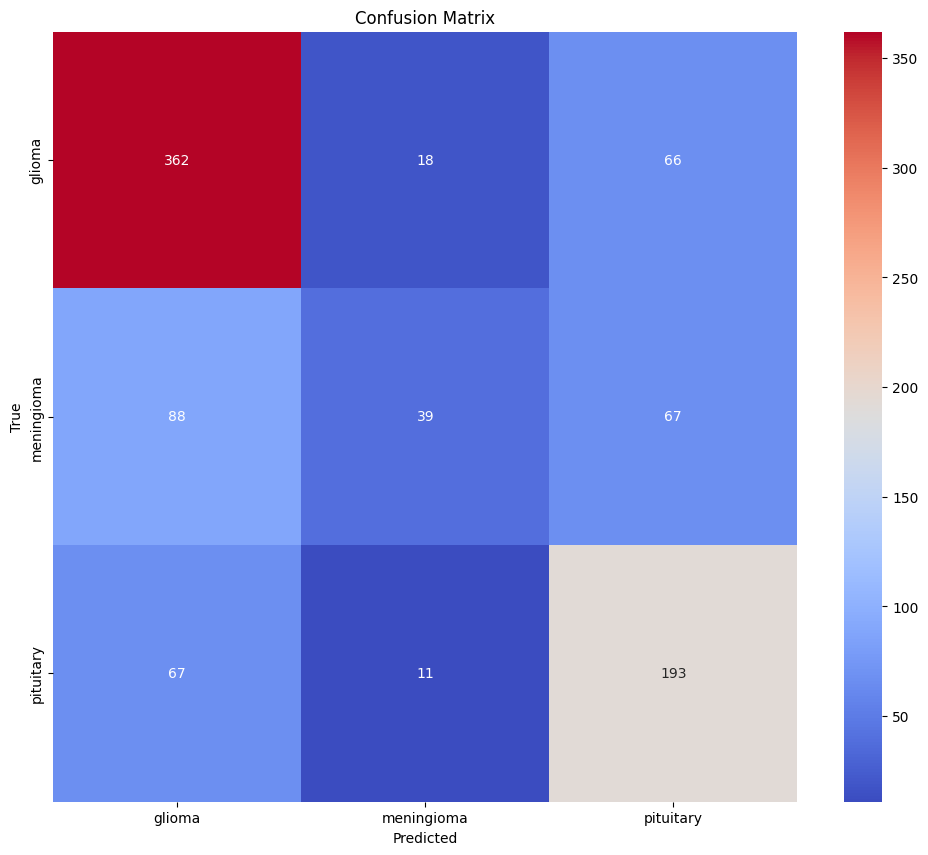

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_encoded, y_test_pred_weight)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:

# Resample the training data using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_combined, y_train_combined)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'criterion':['entropy', 'gini'],
    #'max_features': ['sqrt', 'log2'],
    'max_depth': [3, 5, 7, 9, 13],
}


# Initialize GridSearchCV
rf = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train_resampled, y_train_resampled)




Fitting 5 folds for each of 40 candidates, totalling 200 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [3, 5, 7, 9, 13],
                         'n_estimators': [100, 500, 1000, 2000]},
             verbose=2)

Comparing the confusion matrix before and after the class weighting, the correct prediction for meningioma on the diagonal has increased from 56 to 76. An interesting observation is how the misclassification of other classes for the meningioma class has also increased.

###### Resampling

In [ ]:

# Resample the training data using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_combined, y_train_combined)


In [ ]:

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'criterion':['entropy', 'gini'],
    'max_depth': [3, 5, 7, 9, 13],
}


# Initialize GridSearchCV
rf = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train_resampled, y_train_resampled)


Fitting 5 folds for each of 40 candidates, totalling 200 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [3, 5, 7, 9, 13],
                         'n_estimators': [100, 500, 1000, 2000]},
             verbose=2)

In [ ]:
# Print the best parameters and the best score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_test_pred = best_rf.predict(X_test_glcm)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_encoded, y_test_pred))
print("Test Classification Report:\n", classification_report(y_test_encoded, y_test_pred))

Best Parameters: {'criterion': 'entropy', 'max_depth': 13, 'n_estimators': 1000}
Best Cross-Validation Score: 0.6891156462585034
Test Accuracy: 0.6147091108671789
Test Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.64      0.69       446
           1       0.40      0.47      0.43       194
           2       0.60      0.68      0.64       271

    accuracy                           0.61       911
   macro avg       0.59      0.60      0.59       911
weighted avg       0.64      0.61      0.62       911



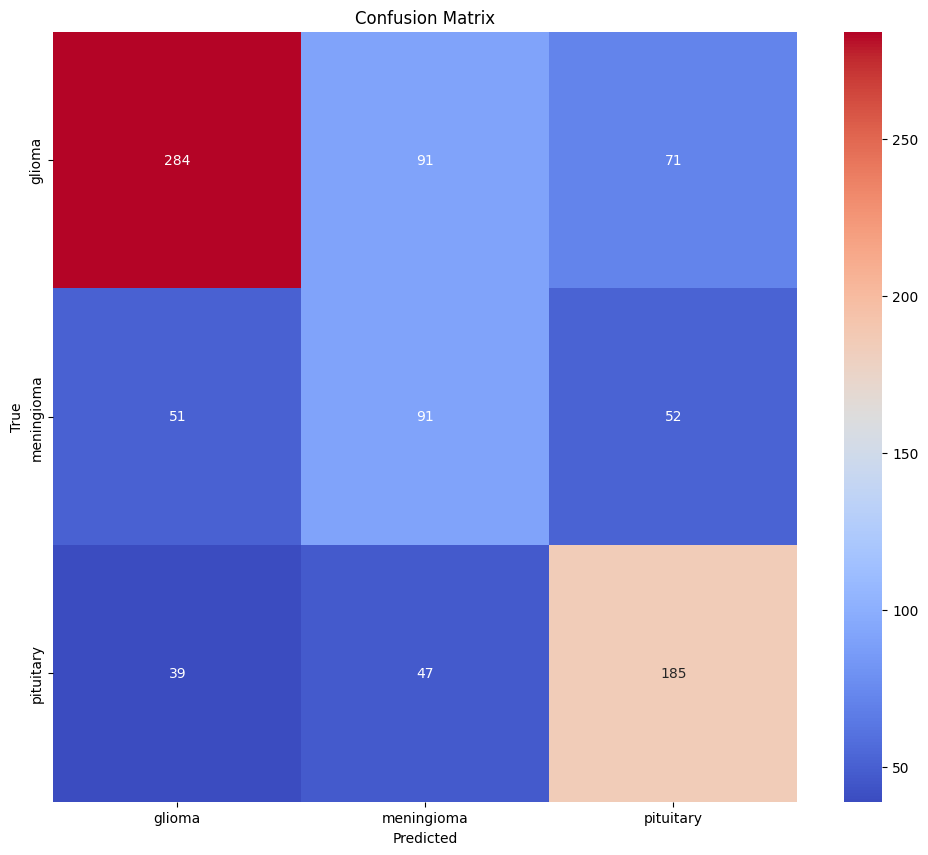

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_encoded, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


Resampling seems to have improved the classification of the meningioma class, however, the majority class seems to be getting bad with the misclassifications

##### Model 3 : SVM - GLCM

In [ ]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train_glcm)
X_val = scaler.transform(X_val_glcm)
X_test = scaler.transform(X_test_glcm)

svm_classifier = SVC(kernel='rbf')

# Hyperparameter tuning using Grid Search for RBF kernel
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'decision_function_shape': ['ovr', 'ovo']
}


baseline_svm = SVC(kernel='rbf', C=11, gamma='scale', class_weight="balanced", decision_function_shape="ovr",)  # Default parameters
baseline_svm.fit(X_train, y_train_glcm)



SVC(C=11, class_weight='balanced')

In [ ]:

# Evaluate the baseline model on the validation set
y_val_pred_baseline = baseline_svm.predict(X_val)
val_accuracy_baseline = accuracy_score(y_val_glcm, y_val_pred_baseline)
val_report_baseline = classification_report(y_val_glcm, y_val_pred_baseline)

print("Baseline Model Validation Performance:")
print(f"Validation Accuracy: {val_accuracy_baseline}")
print("Validation Classification Report:")
print(val_report_baseline)


Baseline Model Validation Performance:
Validation Accuracy: 0.6832579185520362
Validation Classification Report:
              precision    recall  f1-score   support

      glioma       0.84      0.76      0.80       366
  meningioma       0.32      0.47      0.38       100
   pituitary       0.70      0.65      0.67       197

    accuracy                           0.68       663
   macro avg       0.62      0.63      0.62       663
weighted avg       0.72      0.68      0.70       663



In [ ]:
import optuna
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score

def objective(trial):
    # Define the hyperparameter search space
    C = trial.suggest_float('C', 1e-6, 1e+2, log=True)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])

    if kernel == 'poly':
        degree = trial.suggest_int('degree', 2, 5)
    else:
        degree = 3  # Default value, not used for other kernels

    gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
    coef0 = trial.suggest_float('coef0', 0.0, 1.0) if kernel in ['poly', 'sigmoid'] else 0.0

    # Initialize the SVM model with the suggested hyperparameters
    model = SVC(C=C, kernel=kernel, degree=degree, gamma=gamma, coef0=coef0, random_state=42)

    # Perform cross-validation on the training set and return the mean accuracy
    score = cross_val_score(model, X_train_scaled, y_train_encoded, cv=5, scoring='accuracy', n_jobs=-1).mean()
    return score


In [ ]:
# Set the random seed for numpy and other libraries
np.random.seed(42)

# Create a study object with a specific seed for reproducibility
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
study.optimize(objective, n_trials=100)

# Print the best hyperparameters
print(study.best_params)

[I 2024-06-30 10:06:46,608] A new study created in memory with name: no-name-d496dd46-c6f8-4f6f-acd2-ee3a56215a28
[I 2024-06-30 10:06:49,058] Trial 0 finished with value: 0.5140939597315437 and parameters: {'C': 0.0009915644566638397, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 0 with value: 0.5140939597315437.
[I 2024-06-30 10:06:49,664] Trial 1 finished with value: 0.4731543624161073 and parameters: {'C': 8.499808989183016, 'kernel': 'sigmoid', 'gamma': 'scale', 'coef0': 0.18182496720710062}. Best is trial 0 with value: 0.5140939597315437.
[I 2024-06-30 10:06:50,212] Trial 2 finished with value: 0.4120805369127517 and parameters: {'C': 2.9324868872723792e-05, 'kernel': 'poly', 'degree': 4, 'gamma': 'auto', 'coef0': 0.3663618432936917}. Best is trial 0 with value: 0.5140939597315437.
[I 2024-06-30 10:06:50,718] Trial 3 finished with value: 0.5630872483221475 and parameters: {'C': 0.0044520483657488515, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 3 with value: 0.563087

{'C': 11.722147993327937, 'kernel': 'poly', 'degree': 2, 'gamma': 'scale', 'coef0': 0.513320069569988}


In [ ]:
# Train the model with the best hyperparameters on the training set
best_model = SVC(**best_params)
best_model.fit(X_train_scaled, y_train_encoded)

# Evaluate the model on the validation set
y_val_pred = best_model.predict(X_validation_scaled)
val_accuracy = accuracy_score(y_val_encoded, y_val_pred)
print(f'Validation Accuracy after Optuna Optimization: {val_accuracy * 100:.2f}%')



Validation Accuracy after Optuna Optimization: 71.34%


In [ ]:
# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test_scaled)
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)
print(f'Test Accuracy after Optuna Optimization: {test_accuracy * 100:.2f}%')

# Generate classification report
report = classification_report(y_test_encoded, y_test_pred, target_names=['glioma', 'meningioma', 'pituitary'], zero_division=0)
print('Classification Report:')
print(report)

Test Accuracy after Optuna Optimization: 65.64%
Classification Report:
              precision    recall  f1-score   support

      glioma       0.71      0.76      0.74       446
  meningioma       0.51      0.38      0.44       194
   pituitary       0.63      0.68      0.65       271

    accuracy                           0.66       911
   macro avg       0.62      0.61      0.61       911
weighted avg       0.65      0.66      0.65       911



Confusion Matrix:
[[340  42  64]
 [ 77  74  43]
 [ 59  28 184]]


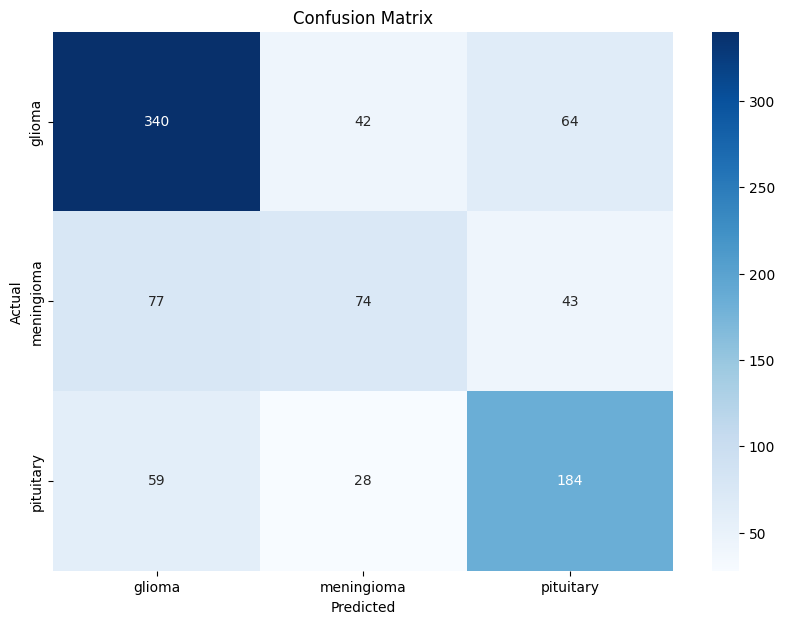

In [ ]:
# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
print('Confusion Matrix:')
print(conf_matrix)

# Optional: If you want to display the confusion matrix visually
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train_encoded)

In [ ]:
# Define the objective function for Optuna
def objective(trial):
    # Define the hyperparameter search space
    C = trial.suggest_float('C', 1e-6, 1e+2, log=True)
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])

    if kernel == 'poly':
        degree = trial.suggest_int('degree', 2, 5)
    else:
        degree = 3  # Default value, not used for other kernels

    gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
    coef0 = trial.suggest_float('coef0', 0.0, 1.0) if kernel in ['poly', 'sigmoid'] else 0.0

    # Initialize the SVM model with the suggested hyperparameters
    model = SVC(C=C, kernel=kernel, degree=degree, gamma=gamma, coef0=coef0, class_weight='balanced')
    # Perform cross-validation on the training set and return the mean accuracy
    score = cross_val_score(model, X_train_resampled, y_train_resampled, cv=5, scoring='accuracy').mean()
    return score


In [ ]:

# Create the Optuna study and optimize
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, timeout=1200)

# Print the best hyperparameters
best_params = study.best_trial.params
print(f'Best Parameters: {best_params}')

[I 2024-06-30 10:09:32,549] A new study created in memory with name: no-name-66eddb55-36ec-4ac9-b269-d5cc79c72160
[I 2024-06-30 10:09:34,744] Trial 0 finished with value: 0.49784228820549076 and parameters: {'C': 0.009103134692117883, 'kernel': 'sigmoid', 'gamma': 'scale', 'coef0': 0.6470802311261385}. Best is trial 0 with value: 0.49784228820549076.
[I 2024-06-30 10:09:35,746] Trial 1 finished with value: 0.47992517968657944 and parameters: {'C': 0.0006553788852449741, 'kernel': 'linear', 'gamma': 'auto'}. Best is trial 0 with value: 0.49784228820549076.
[I 2024-06-30 10:09:36,551] Trial 2 finished with value: 0.5961337928596677 and parameters: {'C': 0.03837987884605289, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 2 with value: 0.5961337928596677.
[I 2024-06-30 10:09:37,158] Trial 3 finished with value: 0.6183707434900436 and parameters: {'C': 0.4043767709903999, 'kernel': 'linear', 'gamma': 'scale'}. Best is trial 3 with value: 0.6183707434900436.
[I 2024-06-30 10:09:37,777]

Best Parameters: {'C': 77.85582244261848, 'kernel': 'rbf', 'gamma': 'auto'}


In [ ]:
# Train the model with the best hyperparameters on the training set
best_model = SVC(**best_params)
best_model.fit(X_train_resampled, y_train_resampled)

# Evaluate the model on the validation set
y_val_pred = best_model.predict(X_val)
val_accuracy = accuracy_score(y_val_encoded, y_val_pred)
print(f'Validation Accuracy after Sampling and Optuna Optimization: {val_accuracy * 100:.2f}%')


Validation Accuracy after Sampling and Optuna Optimization: 69.38%


In [ ]:
# Evaluate the model on the test set
y_test_pred = best_model.predict(X_test)
test_accuracy = accuracy_score(y_test_encoded, y_test_pred)
print(f'Test Accuracy after Optuna Optimization: {test_accuracy * 100:.2f}%')

# Generate classification report
report = classification_report(y_test_encoded, y_test_pred, target_names=['glioma', 'meningioma', 'pituitary'], zero_division=0)
print('Classification Report:')
print(report)

Test Accuracy after Optuna Optimization: 64.43%
Classification Report:
              precision    recall  f1-score   support

      glioma       0.78      0.66      0.72       446
  meningioma       0.44      0.52      0.48       194
   pituitary       0.63      0.70      0.66       271

    accuracy                           0.64       911
   macro avg       0.62      0.63      0.62       911
weighted avg       0.66      0.64      0.65       911



Confusion Matrix:
[[295  83  68]
 [ 47 101  46]
 [ 36  44 191]]


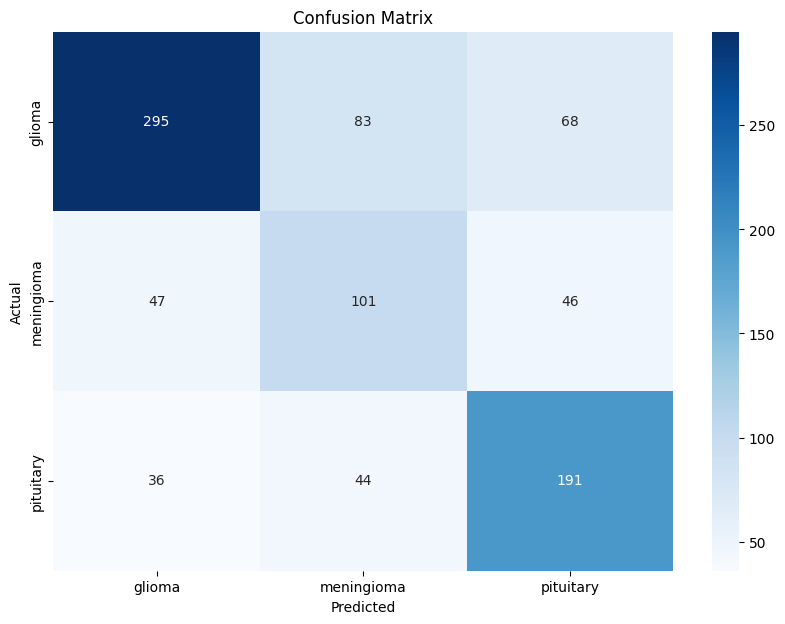

In [ ]:
# Generate confusion matrix
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred)
print('Confusion Matrix:')
print(conf_matrix)

# Optional: If you want to display the confusion matrix visually
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

###### Model 4: Extra Trees

In [ ]:
# Initialize the Extra Trees classifier
from sklearn.ensemble import ExtraTreesClassifier

extra_trees_clf = ExtraTreesClassifier(n_estimators=1000, random_state=42, class_weight=None)

# Train the classifier
extra_trees_clf.fit(X_train_glcm, y_train_glcm)



ExtraTreesClassifier(n_estimators=1000, random_state=42)

In [ ]:
# Predict on the validation set
y_val_pred = extra_trees_clf.predict(X_val_glcm)

# Evaluate the classifier
print("Validation Accuracy:", accuracy_score(y_val_glcm, y_val_pred))

Validation Accuracy: 0.6998491704374057


###### Optimising the Extra Trees

In [ ]:
import optuna
import numpy as np
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import accuracy_score

# Initialize the stratified cross-validator
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define the objective function for Optuna
def objective(trial):
    # Define the hyperparameter search space
    n_estimators = trial.suggest_categorical('n_estimators', [100, 500, 1000, 2000])
    max_depth = trial.suggest_categorical('max_depth', [3, 5, 7, 9, 13])
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])

    # Initialize the Extra Trees classifier with the suggested hyperparameters
    model = ExtraTreesClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        criterion=criterion,
        random_state=42
    )

    # Perform stratified cross-validation
    scores = []
    for train_index, valid_index in cv.split(X_train_glcm, y_train_glcm):
        X_train_cv, X_valid_cv = X_train_glcm[train_index], X_train_glcm[valid_index]
        y_train_cv, y_valid_cv = y_train_glcm[train_index], y_train_glcm[valid_index]

        model.fit(X_train_cv, y_train_cv)
        y_pred = model.predict(X_valid_cv)
        scores.append(accuracy_score(y_valid_cv, y_pred))

    return np.mean(scores)


In [ ]:
# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_glcm, y_train_glcm)
# Set the random seed for reproducibility
np.random.seed(42)

# Create a study object and optimize the objective function
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=42))
study.optimize(objective, n_trials=50)

# Print the best hyperparameters
print("Best hyperparameters:", study.best_params)

# Train the classifier with the best hyperparameters
best_params = study.best_params
best_model = ExtraTreesClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    criterion=best_params['criterion'],
    random_state=42
)
best_model.fit(X_train_glcm, y_train_glcm)

# Evaluate the best model on the training set
train_accuracy = best_model.score(X_train_resampled, y_train_resampled)
print(f"Training Accuracy: {train_accuracy}")

[I 2024-06-30 10:58:51,012] A new study created in memory with name: no-name-e5792d8e-1d3e-479b-b84e-6b2819075d87
[I 2024-06-30 10:58:56,844] Trial 0 finished with value: 0.6328859060402684 and parameters: {'n_estimators': 500, 'max_depth': 9, 'criterion': 'gini'}. Best is trial 0 with value: 0.6328859060402684.
[I 2024-06-30 10:58:57,679] Trial 1 finished with value: 0.6093959731543623 and parameters: {'n_estimators': 100, 'max_depth': 7, 'criterion': 'gini'}. Best is trial 0 with value: 0.6328859060402684.
[I 2024-06-30 10:59:17,189] Trial 2 finished with value: 0.6570469798657719 and parameters: {'n_estimators': 2000, 'max_depth': 13, 'criterion': 'gini'}. Best is trial 2 with value: 0.6570469798657719.
[I 2024-06-30 10:59:20,633] Trial 3 finished with value: 0.587248322147651 and parameters: {'n_estimators': 500, 'max_depth': 5, 'criterion': 'entropy'}. Best is trial 2 with value: 0.6570469798657719.
[I 2024-06-30 10:59:25,781] Trial 4 finished with value: 0.608724832214765 and par

Best hyperparameters: {'n_estimators': 100, 'max_depth': 13, 'criterion': 'gini'}
Training Accuracy: 0.8273615635179153


In [ ]:
# Evaluate the best model on the validation set
y_valid_pred = best_model.predict(X_val_glcm)
valid_accuracy = accuracy_score(y_val_glcm, y_valid_pred)
print(f"Validation Accuracy: {valid_accuracy}")

# Print the classification report
classification_rep = classification_report(y_val_glcm, y_valid_pred)
print("Validation Classification Report:\n", classification_rep)

Validation Accuracy: 0.7119155354449472
Validation Classification Report:
               precision    recall  f1-score   support

      glioma       0.79      0.83      0.81       366
  meningioma       0.39      0.27      0.32       100
   pituitary       0.68      0.71      0.69       197

    accuracy                           0.71       663
   macro avg       0.62      0.60      0.61       663
weighted avg       0.70      0.71      0.70       663



In [ ]:
# Evaluate the best model on the validation set
y_test_pred = best_model.predict(X_test_glcm)
test_accuracy = accuracy_score(y_test_glcm, y_test_pred)
print(f"Testing Accuracy: {test_accuracy}")

# Print the classification report
classification_rep = classification_report(y_test_glcm, y_test_pred)
print("Testing Classification Report:\n", classification_rep)

conf_matrix = confusion_matrix(y_test_glcm, y_test_pred)
print("Confusion Matrix:", conf_matrix)


Validation Accuracy: 0.6619099890230515
Testing Classification Report:
               precision    recall  f1-score   support

      glioma       0.74      0.76      0.75       446
  meningioma       0.50      0.27      0.35       194
   pituitary       0.61      0.77      0.68       271

    accuracy                           0.66       911
   macro avg       0.62      0.60      0.60       911
weighted avg       0.65      0.66      0.65       911

Confusion Matrix: [[340  37  69]
 [ 77  53  64]
 [ 45  16 210]]


##### Model 5: Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Step 4: Train the Gradient Boosting model
gb_model = GradientBoostingClassifier(n_estimators=1000, learning_rate=0.1, max_depth=3, random_state=42, subsample=0.7)
gb_model.fit(X_train_glcm, y_train_glcm)

GradientBoostingClassifier(n_estimators=1000, random_state=42, subsample=0.7)

In [ ]:
# Step 5: Evaluate the model's performance
y_val_pred = gb_model.predict(X_val_glcm)
val_accuracy = accuracy_score(y_val_glcm, y_val_pred)
val_report = classification_report(y_val_glcm, y_val_pred, target_names=['glioma', 'meningioma', 'pituitary'])

print(f"Accuracy: {val_accuracy}")
print("Classification Report:", val_report)


Accuracy: 0.6772247360482655
Classification Report:               precision    recall  f1-score   support

      glioma       0.83      0.75      0.79       366
  meningioma       0.30      0.40      0.34       100
   pituitary       0.67      0.68      0.67       197

    accuracy                           0.68       663
   macro avg       0.60      0.61      0.60       663
weighted avg       0.70      0.68      0.69       663



###### Hyperparameter Tuning

In [ ]:
param_grid = {
    'n_estimators': [100, 300, 500, 1000],
    'max_depth': [3, 4, 5, 6],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'max_features': ['sqrt', 'log2', None]  # Adding max_features to the grid
}
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(estimator=GradientBoostingClassifier(random_state=42),
                           param_grid=param_grid,
                           scoring='accuracy',
                           cv=stratified_kfold,  # Use StratifiedKFold
                           n_jobs=-1,  # Use all available CPUs
                           verbose=2)
grid_search.fit(X_train_glcm, y_train_glcm)



Fitting 5 folds for each of 240 candidates, totalling 1200 fits


In [ ]:
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print("Best Parameters:", best_params)
print("Best Model:", best_model)


In [ ]:
# Step 5: Evaluate the model's performance
y_test_pred = best_model.predict(X_test_glcm)
test_accuracy = best_model.score(X_test_glcm, y_test_glcm)
report = classification_report(y_test_glcm, y_test_pred)

print(f"Accuracy: {test_accuracy}")
print("Classification Report:", report)


In [ ]:
# Confusion matrix
conf_matrix = confusion_matrix(y_test_glcm, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_test_glcm), yticklabels=np.unique(y_test_glcm))
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

##### Model 6 : Stacking Ensemble

In [ ]:
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
# Define the base models
base_model1 = RandomForestClassifier(n_estimators=1000, random_state=42)
base_model2 = SVC(kernel='rbf', probability=True, random_state=42)
base_model3 = ExtraTreesClassifier(n_estimators=1000, random_state=42)
base_model4 = GradientBoostingClassifier(n_estimators=1000, random_state=42)


# Create a list of (name, model) tuples for stacking
estimators = [
    ('random_forest', base_model1),
    ('svc', base_model2),
    ('extra_trees', base_model3),
    ('gradient_boosting', base_model4)
]

# Define the meta-model
meta_model = LogisticRegression()

# Create the stacking classifier
stacking_clf = StackingClassifier(estimators=estimators, final_estimator=meta_model)


# Evaluate with cross-validation
cv_scores = cross_val_score(stacking_clf, X_train_glcm, y_train_glcm, cv=5)
print(f'Cross-validation accuracy: {cv_scores.mean()}')


Cross-validation accuracy: 0.6261744966442953


In [ ]:
# Train the stacking classifier on the entire training data
stacking_clf.fit(X_train_glcm, y_train_glcm)

# Validate the stacking classifier on the validation data
y_val_pred = stacking_clf.predict(X_val_glcm)
validation_accuracy = accuracy_score(y_val_glcm, y_val_pred)
print(f'Validation set accuracy: {validation_accuracy}')

Validation set accuracy: 0.7073906485671192


In [ ]:
# Predict with the stacking classifier on the test data
y_test_pred = stacking_clf.predict(X_test_glcm)

# Evaluate the performance on the test data
test_accuracy = accuracy_score(y_test_glcm, y_test_pred)
print(f'Ensemble model accuracy on test set: {test_accuracy}')

Ensemble model accuracy on test set: 0.6344676180021954


##### Machine Learning Pipeline Definition

In [ ]:

# Define StratifiedKFold for cross-validation using validation set
stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define pipelines for different classifiers

# Logistic Regression Pipeline
logistic_regression_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(
        C=0.01,
        penalty='l2',
        solver='newton-cg',
        class_weight=None,
        multi_class='ovr',
        max_iter=1000,
        random_state=42
    ))
])

# Random Forest Pipeline with best parameters
random_forest_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', RandomForestClassifier(
        criterion='gini',
        max_depth=13,
        n_estimators=1000,
        random_state=42
    ))
])

# Support Vector Machine Pipeline
svm_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', SVC(
        C=10,
        kernel='rbf',
        gamma='scale',
        coef0=0.5,
        class_weight='balanced',
        probability=True,
        random_state=42
    ))
])

# Extra Trees Pipeline
extra_trees_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', ExtraTreesClassifier(
        n_estimators=100,
        max_depth=13,
        criterion='gini',
        random_state=42
    ))
])

# Gradient Boosting Pipeline
gradient_boosting_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', GradientBoostingClassifier(
        n_estimators=500,
        learning_rate=0.1,
        max_depth=13,
        max_features='sqrt',
        subsample=0.7,
        random_state=42
    ))
])

# AdaBoost Pipeline
ada_boost_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', AdaBoostClassifier(
        n_estimators=100,
        random_state=42
    ))
])

# XGBoost Pipeline
xg_boost_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', XGBClassifier(
        n_estimators=100,
        learning_rate=0.1,
        objective='multi:softmax',
        max_depth=3,
        random_state=42,
        eval_metric='logloss'
    ))
])


# Stacking 1: SVM and Extra Trees with Logistic Regression as meta-classifier
stacking_pipeline_1 = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', StackingClassifier(
        estimators=[
            ('svm', svm_pipeline),
            ('et', extra_trees_pipeline)
        ],
        final_estimator=LogisticRegression(max_iter=1000, random_state=42)
    ))
])

# Stacking 2: Gradient Boosting and Random Forest with Logistic Regression as meta-classifier
stacking_pipeline_2 = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', StackingClassifier(
        estimators=[
            ('gb', gradient_boosting_pipeline),
            ('rf', random_forest_pipeline)
        ],
        final_estimator=LogisticRegression(max_iter=1000, random_state=42)
    ))
])

# Voting Classifier with soft voting
voting_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', VotingClassifier(
        estimators=[
            ('ada', ada_boost_pipeline),
            ('gb', gradient_boosting_pipeline),
            ('xgb', xg_boost_pipeline)
        ],
        voting='soft'
    ))
])

# List of pipelines
pipelines = [
    ('Logistic Regression', logistic_regression_pipeline),
     ('Random Forest', random_forest_pipeline),
    ('Support Vector Machine', svm_pipeline),
    ('Extra Trees', extra_trees_pipeline),
    ('Gradient Boosting', gradient_boosting_pipeline),
    ('AdaBoost', ada_boost_pipeline),
    ('XGBoost', xg_boost_pipeline),
    ('Stacking 1 (SVM + Extra Trees)', stacking_pipeline_1),
    ('Stacking 2 (Gradient Boosting + Random Forest)', stacking_pipeline_2),
    ('Voting Ensemble', voting_pipeline)
]



In [ ]:

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_glcm)
y_val_encoded = label_encoder.transform(y_val_glcm)
y_test_encoded = label_encoder.transform(y_test_glcm)

# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_glcm, y_train_encoded)

    # Calculate training balanced accuracy
    y_train_pred = pipeline.predict(X_train_glcm)

    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_glcm, y_val_encoded, cv=stratified_kfold, scoring='balanced_accuracy', n_jobs=-1)
    print(f"{name} cross-validated balanced accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_glcm)
    test_accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_encoded, y_pred, target_names=label_encoder.classes_))

    # Calculate balanced accuracy on the test set
    balanced_acc = balanced_accuracy_score(y_test_encoded, y_pred)
    print(f'{name} test balanced accuracy: {balanced_acc:.3f}')

    # Confusion matrix function
    def calculate_specificity_per_class(y_true, y_pred):
        labels = np.unique(y_true)  # Get unique classes from true labels
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        specificity_per_class = []
        for i in range(len(cm)):
            tn = sum(sum(cm)) - (sum(cm[i, :]) + sum(cm[:, i]) - cm[i, i])
            fp = sum(cm[:, i]) - cm[i, i]
            specificity = tn / (tn + fp) if (tn + fp) != 0 else 0  # Handle division by zero
            specificity_per_class.append(specificity)
        return specificity_per_class

    # Assuming y_test_encoded and y_pred are available
    specificity_per_class = calculate_specificity_per_class(y_test_encoded, y_pred)
    balanced_specificity = np.mean(specificity_per_class)

    print(f'Balanced Specificity: {balanced_specificity:.3f}')


Voting Ensemble test specificity (average across classes): 0.803


#### Feature Extractor 2: ISOTROPIC GLCM
Isotropic GLCM is the average of GLCMs in four directions (0, 45, 90, 135), and instead of using the second order derivatives, it uses the raw elements of the lower (or upper) triangular elements of the matrix

In [ ]:
import numpy as np
import cv2
import os
from skimage.feature import graycomatrix

def normalize_image_intensity(image):
    """
    Normalize the intensity of the image to the range [0, 1].
    """
    return cv2.normalize(image, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)

def calculate_isotropic_glcm(image, mask, distances, num_levels=256):
    # Apply the mask to isolate the tumor region
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    # Ensure the masked region is not empty
    if np.count_nonzero(mask) == 0:
        raise ValueError("Masked region is empty. Check the mask.")

    # Normalize the masked image intensity
    normalized_image = normalize_image_intensity(masked_image)

    # Quantize the masked image to reduce the number of gray levels
    quantized_image = (normalized_image * (num_levels - 1)).astype(np.uint8)

    # Initialize the isotropic GLCM
    glcm_isotropic = np.zeros((num_levels, num_levels))

    # Compute GLCMs for each distance and each of the four directions
    for distance in distances:
        glcm_0 = graycomatrix(quantized_image, distances=[distance], angles=[0], levels=num_levels, symmetric=True, normed=False)
        glcm_45 = graycomatrix(quantized_image, distances=[distance], angles=[np.pi/4], levels=num_levels, symmetric=True, normed=False)
        glcm_90 = graycomatrix(quantized_image, distances=[distance], angles=[np.pi/2], levels=num_levels, symmetric=True, normed=False)
        glcm_135 = graycomatrix(quantized_image, distances=[distance], angles=[3*np.pi/4], levels=num_levels, symmetric=True, normed=False)

        # Sum the GLCMs to get isotropic GLCM for this distance
        glcm_isotropic += (glcm_0[:, :, 0, 0] + glcm_45[:, :, 0, 0] + glcm_90[:, :, 0, 0] + glcm_135[:, :, 0, 0]) / 4.0

    # Normalize the isotropic GLCM by dividing by the sum of its elements
    glcm_isotropic /= glcm_isotropic.sum()

    return glcm_isotropic

def extract_lower_triangular_features(glcm):
    num_levels = glcm.shape[0]
    features = []
    for i in range(num_levels):
        for j in range(i + 1):
            features.append(glcm[i, j])
    return np.array(features)

def extract_isoglcm_features(image_path, mask_path, distances):

    # Load the images
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    # Check if image and mask are loaded correctly
    if image is None:
        raise ValueError("Image not loaded correctly. Check the file path.")
    if mask is None:
        raise ValueError("Mask not loaded correctly. Check the file path.")

    # Calculate isotropic GLCM for the masked region
    glcm_isotropic = calculate_isotropic_glcm(image, mask, distances)

    # Extract lower triangular GLCM elements as features
    glcm_features = extract_lower_triangular_features(glcm_isotropic)

    return glcm_features



In [ ]:
def load_isoglcm(images_dir, masks_dir, distances):
    X = []
    y = []

    for class_name in os.listdir(images_dir):
        class_image_dir = os.path.join(images_dir, class_name)
        class_mask_dir = os.path.join(masks_dir, class_name)

        if os.path.isdir(class_image_dir) and os.path.isdir(class_mask_dir):
            for image_name in os.listdir(class_image_dir):
                image_path = os.path.join(class_image_dir, image_name)
                mask_path = os.path.join(class_mask_dir, image_name.replace(".png", "_mask.png"))

                if os.path.exists(image_path) and os.path.exists(mask_path):
                    # Convert Path to str for cv2.imread
                    image_path = str(image_path)
                    mask_path = str(mask_path)

                    # Extract GLCM features
                    try:
                        features = extract_isoglcm_features(image_path, mask_path, distances)
                        # Append features and label
                        X.append(features)
                        y.append(class_name)
                    except ValueError as e:
                        print(f"Error processing {image_path} and {mask_path}: {e}")
                        continue

    return np.array(X), np.array(y)
distances = [1, 2, 3]  # Example distances


In [ ]:
# Feature selection on the various datasets
X_train_isoglcm, y_train_isoglcm = load_isoglcm(train_images_dir, train_masks_dir, distances)
X_val_isoglcm, y_val_isoglcm = load_isoglcm(val_images_dir, val_masks_dir, distances)
X_test_isoglcm, y_test_isoglcm = load_isoglcm(test_images_dir, test_masks_dir, distances)

In [ ]:
X_train_isoglcm.shape

(1490, 32896)

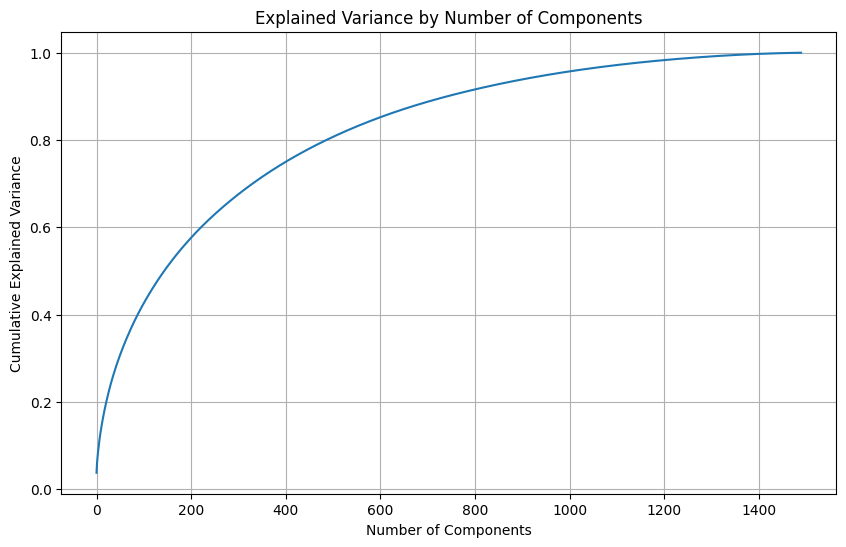

In [ ]:
# Standardize the data
scaler = StandardScaler()
X_train_isoglcm = scaler.fit_transform(X_train_isoglcm)
X_val_isoglcm = scaler.transform(X_val_isoglcm)
X_test_isoglcm = scaler.transform(X_test_isoglcm)

# Apply PCA and inspect explained variance ratio
pca = PCA().fit(X_train_isoglcm)
explained_variance = pca.explained_variance_ratio_

# Plot the explained variance
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(explained_variance))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Components')
plt.grid()

In [ ]:
# Calculate the number of components to retain 95% of the variance
cumulative_variance = np.cumsum(explained_variance)
n_components = np.argmax(cumulative_variance >= 0.95) + 1
print(f'Number of components to retain 95% variance: {n_components}')

# Apply PCA with the chosen number of components
pca = PCA(n_components=n_components)
X_train_pca = pca.fit_transform(X_train_isoglcm)
X_val_pca = pca.transform(X_val_isoglcm)
X_test_pca = pca.transform(X_test_isoglcm)

# Print the shape of the transformed training data
print(X_train_pca.shape)

Number of components to retain 95% variance: 959
(1490, 959)


In [ ]:

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_isoglcm)
y_val_encoded = label_encoder.transform(y_val_isoglcm)
y_test_encoded = label_encoder.transform(y_test_isoglcm)

# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_pca, y_train_encoded)

    # Calculate training balanced accuracy
    y_train_pred = pipeline.predict(X_train_pca)

    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_pca, y_val_encoded, cv=stratified_kfold, scoring='balanced_accuracy', n_jobs=-1)
    print(f"{name} cross-validated balanced accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_pca)
    test_accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_encoded, y_pred, target_names=label_encoder.classes_))

    # Calculate balanced accuracy on the test set
    balanced_acc = balanced_accuracy_score(y_test_encoded, y_pred)
    print(f'{name} test balanced accuracy: {balanced_acc:.3f}')

        # Confusion matrix function
    def calculate_specificity_per_class(y_true, y_pred):
        labels = np.unique(y_true)  # Get unique classes from true labels
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        specificity_per_class = []
        for i in range(len(cm)):
            tn = sum(sum(cm)) - (sum(cm[i, :]) + sum(cm[:, i]) - cm[i, i])
            fp = sum(cm[:, i]) - cm[i, i]
            specificity = tn / (tn + fp) if (tn + fp) != 0 else 0  # Handle division by zero
            specificity_per_class.append(specificity)
        return specificity_per_class

    # Assuming y_test_encoded and y_pred are available
    specificity_per_class = calculate_specificity_per_class(y_test_encoded, y_pred)
    balanced_specificity = np.mean(specificity_per_class)

    print(f'Balanced Specificity: {balanced_specificity:.3f}')


Training and evaluating Logistic Regression pipeline...
Logistic Regression cross-validated balanced accuracy on validation set: 0.611 ± 0.037
Logistic Regression test accuracy: 0.688
Logistic Regression Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.82      0.71      0.76       446
  meningioma       0.72      0.56      0.63       194
   pituitary       0.54      0.75      0.63       271

    accuracy                           0.69       911
   macro avg       0.69      0.67      0.67       911
weighted avg       0.72      0.69      0.69       911

Logistic Regression test balanced accuracy: 0.672
Balanced Specificity: 0.841

Training and evaluating Random Forest pipeline...
Random Forest cross-validated balanced accuracy on validation set: 0.515 ± 0.034
Random Forest test accuracy: 0.665
Random Forest Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.75     

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LassoCV

lasso_cv = LassoCV(cv=5, max_iter=10000)
lasso_cv.fit(X_train_isoglcm, y_train_encoded)

sfm = SelectFromModel(lasso_cv, threshold=0.1 * np.max(np.abs(lasso_cv.coef_)))  # Using 'mean' to select features above average importance
sfm.fit(X_train_isoglcm, y_train_encoded)


X_train_isoglcm = sfm.transform(X_train_isoglcm)
X_val_isoglcm = sfm.transform(X_val_isoglcm)
X_test_isoglcm = sfm.transform(X_test_isoglcm)

X_train_isoglcm.shape

(1490, 47)

In [ ]:

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_isoglcm)
y_val_encoded = label_encoder.transform(y_val_isoglcm)
y_test_encoded = label_encoder.transform(y_test_isoglcm)

# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_isoglcm, y_train_encoded)

    # Calculate training balanced accuracy
    y_train_pred = pipeline.predict(X_train_isoglcm)


    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_isoglcm, y_val_encoded, cv=stratified_kfold, scoring='balanced_accuracy', n_jobs=-1)
    print(f"{name} cross-validated balanced accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_isoglcm)
    test_accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_encoded, y_pred, target_names=label_encoder.classes_))

    # Calculate balanced accuracy on the test set
    balanced_acc = balanced_accuracy_score(y_test_encoded, y_pred)
    print(f'{name} test balanced accuracy: {balanced_acc:.2f}')

    def calculate_specificity_per_class(y_true, y_pred):
        labels = np.unique(y_true)  # Get unique classes from true labels
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        specificity_per_class = []
        for i in range(len(cm)):
            tn = sum(sum(cm)) - (sum(cm[i, :]) + sum(cm[:, i]) - cm[i, i])
            fp = sum(cm[:, i]) - cm[i, i]
            specificity = tn / (tn + fp) if (tn + fp) != 0 else 0  # Handle division by zero
            specificity_per_class.append(specificity)
        return specificity_per_class

    # Assuming y_test_encoded and y_pred are available
    specificity_per_class = calculate_specificity_per_class(y_test_encoded, y_pred)
    balanced_specificity = np.mean(specificity_per_class)

    print(f'Balanced Specificity: {balanced_specificity:.3f}')


Training and evaluating Logistic Regression pipeline...
Logistic Regression training balanced accuracy: 0.689
Logistic Regression cross-validated balanced accuracy on validation set: 0.531 ± 0.030
Logistic Regression test accuracy: 0.622
Logistic Regression Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.77      0.69      0.73       446
  meningioma       0.53      0.29      0.38       194
   pituitary       0.50      0.75      0.60       271

    accuracy                           0.62       911
   macro avg       0.60      0.58      0.57       911
weighted avg       0.64      0.62      0.62       911

Logistic Regression test balanced accuracy: 0.58

Training and evaluating Random Forest pipeline...
Random Forest training balanced accuracy: 0.926
Random Forest cross-validated balanced accuracy on validation set: 0.600 ± 0.040
Random Forest test accuracy: 0.686
Random Forest Classification Report on test set:
           

#### Feature Extractor 3: Geometic Moment (GM) Descriptors + Gray-level Co-Occurence matrix (GLCM)

I applied the GM to the image masks, and the GLCM descriptors to the images as a whole. And combined their features


To create the moment descriptors
1. process the images

  - convert them to grayscale if they are coloured
  - binarise the image where the ROI(region of interest) is clearly defined. In our case we will use the tumor masks

  2. Calculate the raw moments M_{pq}

  3. compute the centroid (X_{c}, y_{c})
  4. find the central moments using the centroid points
  5. Derive the Hu moments
  

In [ ]:
#GLCM
# define the raw moments
def compute_raw_moments(binary_image):
    moments = cv2.moments(binary_image)
    return moments

# extract central moments from the raw moments of the binary image
def compute_central_moments(moments):

  # centroid (x_c, y_c)
    centroid_x = moments['m10'] / moments['m00']
    centroid_y = moments['m01'] / moments['m00']

    # central moments U_pq
    mu20 = moments['mu20']
    mu02 = moments['mu02']
    mu11 = moments['mu11']
    mu30 = moments['mu30']
    mu21 = moments['mu21']
    mu12 = moments['mu12']
    mu03 = moments['mu03']

    # returns the centroid co-ordinates
    return (centroid_x, centroid_y), mu20, mu02, mu11, mu30, mu21, mu12, mu03


# computes both the eccentricity and the orientation theta
def compute_orientation_eccentricity(mu20, mu02, mu11):
    # Orientation
    theta = 0.5 * np.arctan2(2 * mu11, mu20 - mu02)

    # Eigenvalues
    term1 = mu20 + mu02
    term2 = np.sqrt((mu20 - mu02) ** 2 + 4 * mu11 ** 2)
    lambda1 = (term1 + term2) / 2
    lambda2 = (term1 - term2) / 2

    # Eccentricity
    eccentricity = np.sqrt(1 - (lambda2 / lambda1))

    return theta, eccentricity


def compute_hu_moments(moments):
  # computes the 7 hu moments from the raw or central moments
  # .flatten() converts the 2D array of Hu moments into a 1D
    hu_moments = cv2.HuMoments(moments).flatten()
    return hu_moments


# returns the
# area: zeroth order Moo
# centroid
# orientation and eccentricity
# Hu moments derived from the central moments
def extract_geometric_moment_features(mask_path):
  # reads the mask image
  # read in grayscale mode
    binary_image = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    moments = compute_raw_moments(binary_image)
    (centroid_x, centroid_y), mu20, mu02, mu11, mu30, mu21, mu12, mu03 = compute_central_moments(moments)
    hu_moments = compute_hu_moments(moments)
    orientation, eccentricity = compute_orientation_eccentricity(mu20, mu02, mu11)


    feature_vector = [
        moments['m00'],
        centroid_x,
        centroid_y,
        mu20, mu02, mu11, mu30, mu21, mu12, mu03,
        orientation,
        eccentricity,
        *hu_moments
    ]

    return feature_vector



In [ ]:
def extract_glcm_features(image_path, distances, angles):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    glcm_features = []

    for distance in distances:
        for angle in angles:
            glcm = graycomatrix(image, distances=[distance], angles=[angle], symmetric=True, normed=True)
            features = [graycoprops(glcm, prop).ravel() for prop in ('contrast', 'dissimilarity', 'homogeneity', 'energy', 'correlation', 'ASM')]
            glcm_features.extend(features)

    return np.hstack(glcm_features).tolist()

In [ ]:
def load_data_gg(images_dir, masks_dir, distances, angles):
    X = []
    y = []

    for class_name in os.listdir(images_dir):
        class_image_dir = os.path.join(images_dir, class_name)
        class_mask_dir = os.path.join(masks_dir, class_name)

        if os.path.isdir(class_image_dir) and os.path.isdir(class_mask_dir):
            for image_name in os.listdir(class_image_dir):
                image_path = os.path.join(class_image_dir, image_name)
                mask_path = os.path.join(class_mask_dir, image_name.replace(".png", "_mask.png"))


                if os.path.exists(image_path) and os.path.exists(mask_path):
                    # Convert Path to str for cv2.imread
                    image_path = str(image_path)
                    mask_path = str(mask_path)

                    # Extract GLCM features
                    try:
                        glcm_features = extract_glcm_features(image_path, distances, angles)
                        geometric_features = extract_geometric_moment_features(mask_path)
                        features = glcm_features + geometric_features
                        # Append features and label
                        X.append(features)
                        y.append(class_name)
                    except ValueError as e:
                        print(f"Error processing {image_path} and {mask_path}: {e}")
                        continue

    return np.array(X), np.array(y)

In [ ]:

# Process the dataset
features, labels = load_data(train_images_dir, train_masks_dir)

# Save features to a CSV file
df = pd.DataFrame(features)
df['label'] = labels
df.to_csv('geometric_moment_features.csv', index=False)

print("Feature extraction complete. Features saved to geometric_moment_features.csv")

Error processing /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/images/glioma/210.png and /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/masks/glioma/210_mask.png: operands could not be broadcast together with shapes (17,) (19,) 
Error processing /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/images/glioma/209.png and /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/masks/glioma/209_mask.png: operands could not be broadcast together with shapes (17,) (19,) 
Error processing /content/drive/My Drive/multidisciplinary_project_file_dump/original_dataset_mat_files/patient_split_image_with_masks/train/images/glioma/719.png and /content/drive/My Drive/multidisciplinary_project_file_dump/origi

KeyboardInterrupt: 

In [ ]:
# Feature selection on the various datasets
X_train_com, y_train_com = load_data_gg(train_images_dir, train_masks_dir, distances, angles)
X_val_com, y_val_com = load_data_gg(val_images_dir, val_masks_dir, distances, angles)
X_test_com, y_test_com = load_data_gg(test_images_dir, test_masks_dir, distances, angles)

# Print debug information
def print_dataset_info(X, y, dataset_name):
    print(f"{dataset_name} - Features shape: {X.shape}, Labels shape: {y.shape}")
    if len(X) > 0 and len(y) > 0:
        print(f"Sample features: {X[0]}")
        print(f"Sample label: {y[0]}")
    else:
        print(f"{dataset_name} is empty!")

print_dataset_info(X_train_com, y_train_com, "Training Set")
print_dataset_info(X_val_com, y_val_com, "Validation Set")
print_dataset_info(X_test_com, y_test_com, "Test Set")

Training Set - Features shape: (1490, 43), Labels shape: (1490,)
Sample features: [ 4.45450633e+01  2.35822071e+00  6.36838333e-01  3.02321805e-01
  9.85571980e-01  9.13984735e-02  8.36708805e+01  3.39764324e+00
  5.93519332e-01  2.97933709e-01  9.72919557e-01  8.87644949e-02
  4.28006360e+01  2.38948600e+00  6.51275161e-01  3.02937077e-01
  9.86136995e-01  9.17708728e-02  8.38616197e+01  3.32010830e+00
  5.95978139e-01  2.97813145e-01  9.72857824e-01  8.86926693e-02
  4.22178000e+06  1.56067166e+02  2.11732363e+02  6.75506559e+09
  6.40352713e+09 -2.27547857e+09 -4.55501963e+10 -4.46827490e+10
  7.51336880e+10  1.94659402e+10 -7.46852231e-01  7.17699017e-01
  7.38275147e-04  6.55853348e-08  7.23118584e-11  1.12669590e-12
  8.88329570e-24  2.87574594e-16 -4.95106481e-24]
Sample label: glioma
Validation Set - Features shape: (663, 43), Labels shape: (663,)
Sample features: [ 1.85560711e+01  1.57308739e+00  7.20317793e-01  3.62010408e-01
  9.92110246e-01  1.31051535e-01  4.85575193e+01  

In [ ]:
X_train_com.shape

(1490, 43)


Training and evaluating Logistic Regression pipeline...
Logistic Regression cross-validated balanced accuracy on validation set: 0.645 ± 0.047
Logistic Regression test accuracy: 0.750
Logistic Regression Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.80      0.79      0.79       446
  meningioma       0.60      0.48      0.54       194
   pituitary       0.76      0.87      0.81       271

    accuracy                           0.75       911
   macro avg       0.72      0.72      0.71       911
weighted avg       0.74      0.75      0.74       911

Logistic Regression test balanced accuracy: 0.716
Balanced Specificity: 0.867


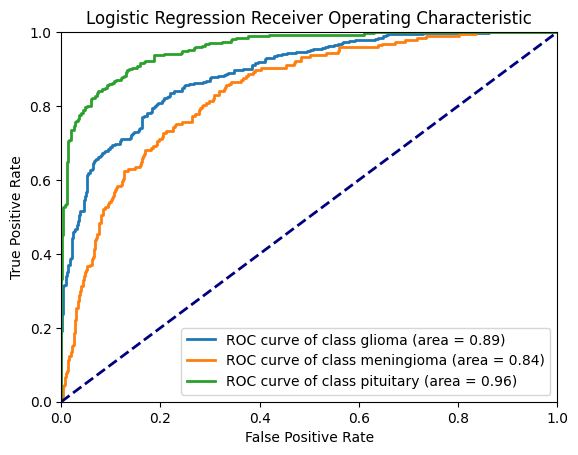


Training and evaluating Random Forest pipeline...
Random Forest cross-validated balanced accuracy on validation set: 0.898 ± 0.017
Random Forest test accuracy: 0.838
Random Forest Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.89      0.85      0.87       446
  meningioma       0.64      0.75      0.69       194
   pituitary       0.93      0.89      0.91       271

    accuracy                           0.84       911
   macro avg       0.82      0.83      0.82       911
weighted avg       0.85      0.84      0.84       911

Random Forest test balanced accuracy: 0.827
Balanced Specificity: 0.918


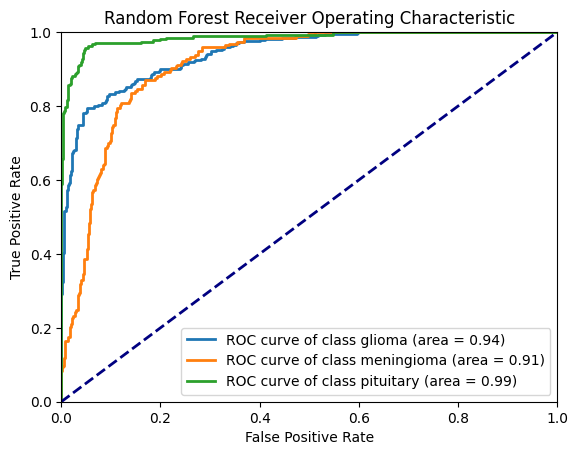


Training and evaluating Support Vector Machine pipeline...
Support Vector Machine cross-validated balanced accuracy on validation set: 0.948 ± 0.010
Support Vector Machine test accuracy: 0.845
Support Vector Machine Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.89      0.83      0.86       446
  meningioma       0.67      0.70      0.68       194
   pituitary       0.90      0.97      0.94       271

    accuracy                           0.85       911
   macro avg       0.82      0.83      0.83       911
weighted avg       0.85      0.85      0.85       911

Support Vector Machine test balanced accuracy: 0.834
Balanced Specificity: 0.921


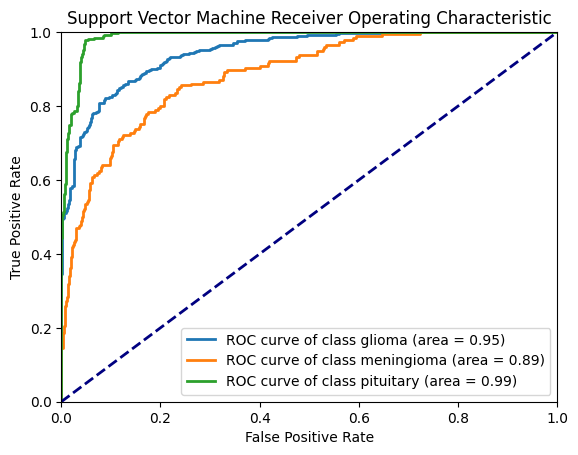


Training and evaluating Extra Trees pipeline...
Extra Trees cross-validated balanced accuracy on validation set: 0.943 ± 0.018
Extra Trees test accuracy: 0.836
Extra Trees Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.89      0.83      0.86       446
  meningioma       0.63      0.77      0.69       194
   pituitary       0.94      0.89      0.92       271

    accuracy                           0.84       911
   macro avg       0.82      0.83      0.82       911
weighted avg       0.85      0.84      0.84       911

Extra Trees test balanced accuracy: 0.831
Balanced Specificity: 0.919


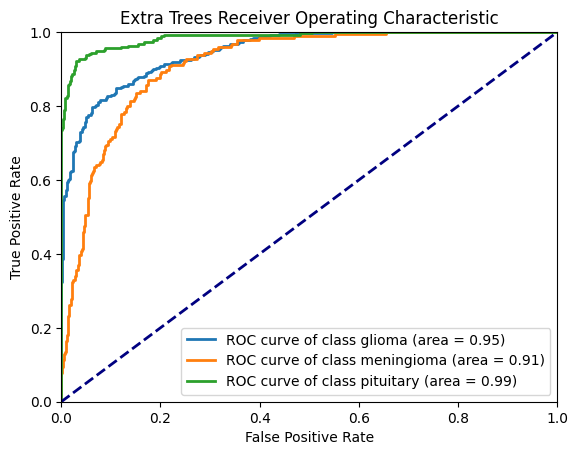


Training and evaluating Gradient Boosting pipeline...
Gradient Boosting cross-validated balanced accuracy on validation set: 0.918 ± 0.005
Gradient Boosting test accuracy: 0.842
Gradient Boosting Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.89      0.85      0.87       446
  meningioma       0.64      0.73      0.68       194
   pituitary       0.94      0.90      0.92       271

    accuracy                           0.84       911
   macro avg       0.82      0.83      0.82       911
weighted avg       0.85      0.84      0.84       911

Gradient Boosting test balanced accuracy: 0.828
Balanced Specificity: 0.920


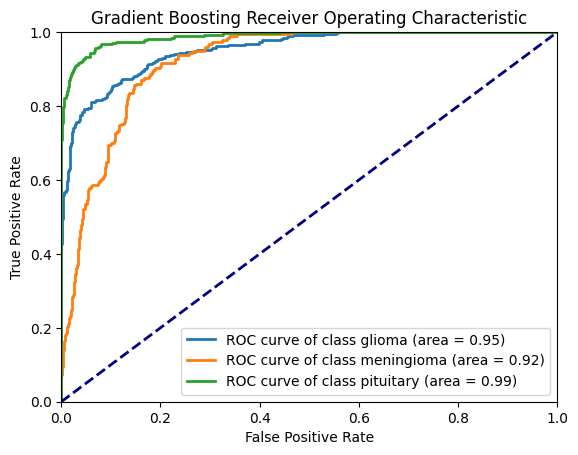


Training and evaluating AdaBoost pipeline...
AdaBoost cross-validated balanced accuracy on validation set: 0.750 ± 0.044
AdaBoost test accuracy: 0.749
AdaBoost Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.76      0.85      0.80       446
  meningioma       0.45      0.37      0.40       194
   pituitary       0.91      0.86      0.88       271

    accuracy                           0.75       911
   macro avg       0.71      0.69      0.70       911
weighted avg       0.74      0.75      0.74       911

AdaBoost test balanced accuracy: 0.691
Balanced Specificity: 0.862


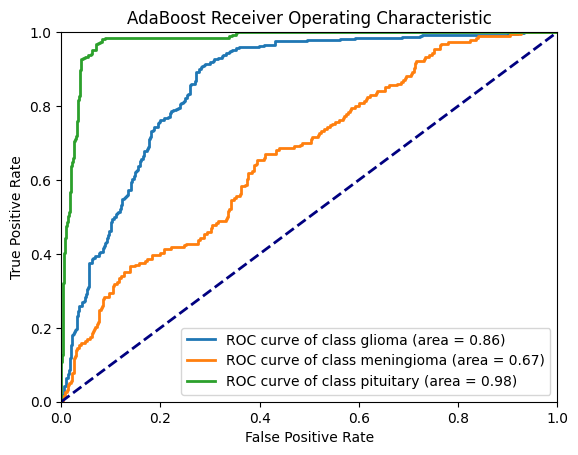


Training and evaluating XGBoost pipeline...
XGBoost cross-validated balanced accuracy on validation set: 0.908 ± 0.031
XGBoost test accuracy: 0.836
XGBoost Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.90      0.81      0.85       446
  meningioma       0.63      0.76      0.69       194
   pituitary       0.93      0.93      0.93       271

    accuracy                           0.84       911
   macro avg       0.82      0.83      0.82       911
weighted avg       0.85      0.84      0.84       911

XGBoost test balanced accuracy: 0.834
Balanced Specificity: 0.919


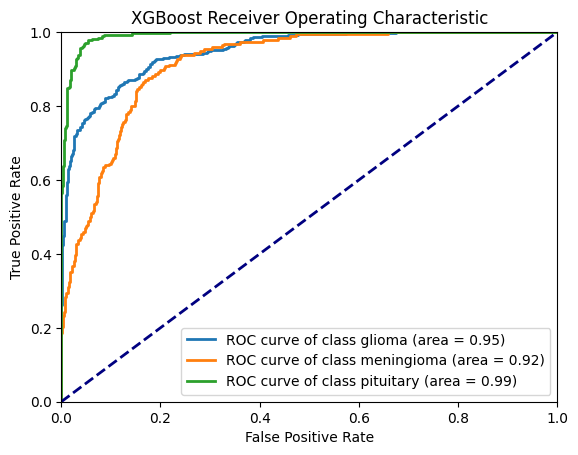


Training and evaluating Stacking 1 (SVM + Extra Trees) pipeline...
Stacking 1 (SVM + Extra Trees) cross-validated balanced accuracy on validation set: 0.947 ± 0.017
Stacking 1 (SVM + Extra Trees) test accuracy: 0.844
Stacking 1 (SVM + Extra Trees) Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.87      0.88      0.87       446
  meningioma       0.68      0.65      0.66       194
   pituitary       0.93      0.92      0.92       271

    accuracy                           0.84       911
   macro avg       0.82      0.82      0.82       911
weighted avg       0.84      0.84      0.84       911

Stacking 1 (SVM + Extra Trees) test balanced accuracy: 0.818
Balanced Specificity: 0.917


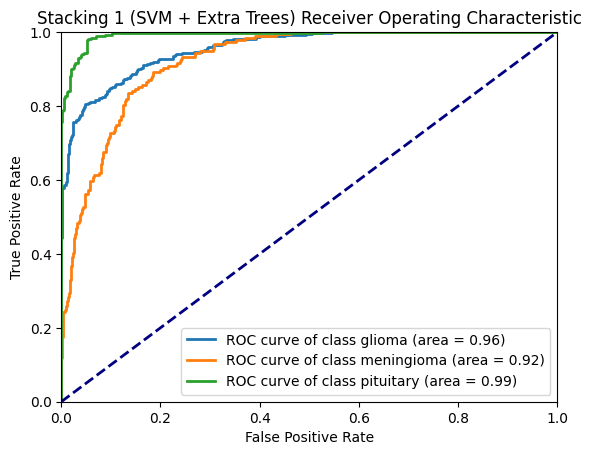


Training and evaluating Stacking 2 (Gradient Boosting + Random Forest) pipeline...
Stacking 2 (Gradient Boosting + Random Forest) cross-validated balanced accuracy on validation set: 0.918 ± 0.007
Stacking 2 (Gradient Boosting + Random Forest) test accuracy: 0.835
Stacking 2 (Gradient Boosting + Random Forest) Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.87      0.86      0.87       446
  meningioma       0.64      0.69      0.66       194
   pituitary       0.93      0.90      0.91       271

    accuracy                           0.84       911
   macro avg       0.81      0.82      0.81       911
weighted avg       0.84      0.84      0.84       911

Stacking 2 (Gradient Boosting + Random Forest) test balanced accuracy: 0.815
Balanced Specificity: 0.915


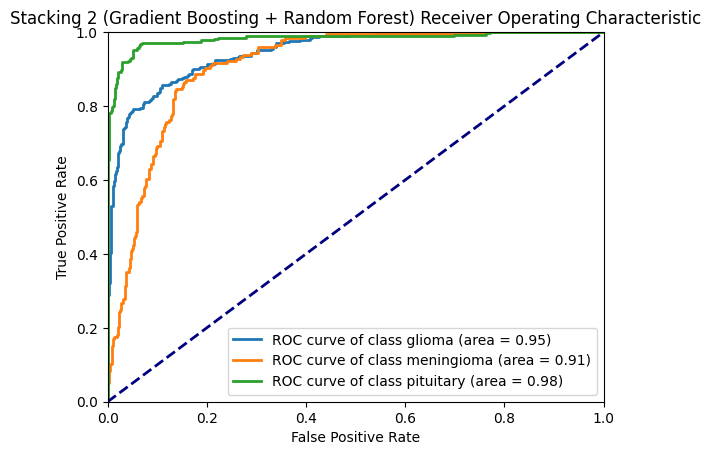


Training and evaluating Voting Ensemble pipeline...
Voting Ensemble cross-validated balanced accuracy on validation set: 0.919 ± 0.008
Voting Ensemble test accuracy: 0.844
Voting Ensemble Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.89      0.85      0.87       446
  meningioma       0.64      0.73      0.68       194
   pituitary       0.94      0.91      0.92       271

    accuracy                           0.84       911
   macro avg       0.82      0.83      0.83       911
weighted avg       0.85      0.84      0.85       911

Voting Ensemble test balanced accuracy: 0.832
Balanced Specificity: 0.921


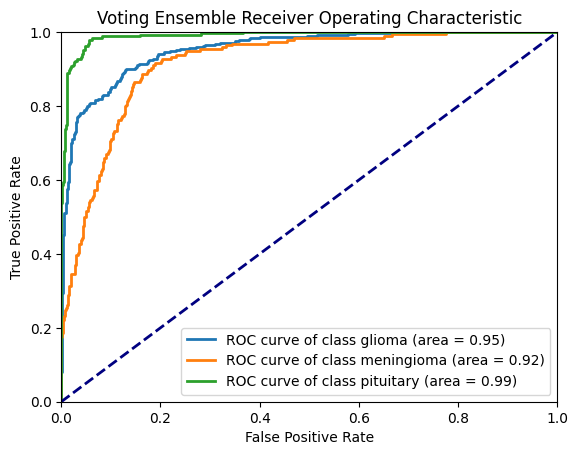

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, balanced_accuracy_score, accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.preprocessing import LabelEncoder

# Assume stratified_kfold, pipelines, X_train_com, y_train_com, X_val_com, y_val_com, X_test_com, y_test_com are defined earlier in your script

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_com)
y_val_encoded = label_encoder.transform(y_val_com)
y_test_encoded = label_encoder.transform(y_test_com)

# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_com, y_train_encoded)


    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_com, y_val_encoded, cv=stratified_kfold, scoring='balanced_accuracy', n_jobs=-1)
    print(f"{name} cross-validated balanced accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_com)
    test_accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_encoded, y_pred, target_names=label_encoder.classes_))

    # Calculate balanced accuracy on the test set
    balanced_acc = balanced_accuracy_score(y_test_encoded, y_pred)
    print(f'{name} test balanced accuracy: {balanced_acc:.3f}')

    # Confusion matrix function
    def calculate_specificity_per_class(y_true, y_pred):
        labels = np.unique(y_true)  # Get unique classes from true labels
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        specificity_per_class = []
        for i in range(len(cm)):
            tn = sum(sum(cm)) - (sum(cm[i, :]) + sum(cm[:, i]) - cm[i, i])
            fp = sum(cm[:, i]) - cm[i, i]
            specificity = tn / (tn + fp) if (tn + fp) != 0 else 0  # Handle division by zero
            specificity_per_class.append(specificity)
        return specificity_per_class

    # Calculate and print specificity per class
    specificity_per_class = calculate_specificity_per_class(y_test_encoded, y_pred)
    balanced_specificity = np.mean(specificity_per_class)
    print(f'Balanced Specificity: {balanced_specificity:.3f}')

    # Calculate ROC curve and AUC for each class
    y_test_prob = pipeline.predict_proba(X_test_com)
    plt.figure()
    for i in range(len(label_encoder.classes_)):
        fpr, tpr, _ = roc_curve(y_test_encoded == i, y_test_prob[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'ROC curve of class {label_encoder.classes_[i]} (area = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{name} Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()


###### Model 2- Random Forest: GM + GLCM

In [ ]:
from sklearn.ensemble import RandomForestClassifier

randomf_classifier = RandomForestClassifier(n_estimators = 1000, random_state = 42)
randomf_classifier.fit(X_train_com, y_train_com)

RandomForestClassifier(n_estimators=1000, random_state=42)

In [ ]:
y_val_pred = randomf_classifier.predict(X_val_com)

In [ ]:
print("Validation Accuracy:", accuracy_score(y_val_com, y_val_pred))
print("Validation Classification Report:\n", classification_report(y_val_com, y_val_pred))

Validation Accuracy: 0.8733031674208145
Validation Classification Report:
               precision    recall  f1-score   support

      glioma       0.95      0.84      0.89       366
  meningioma       0.57      0.84      0.68       100
   pituitary       0.98      0.95      0.96       197

    accuracy                           0.87       663
   macro avg       0.83      0.88      0.84       663
weighted avg       0.90      0.87      0.88       663



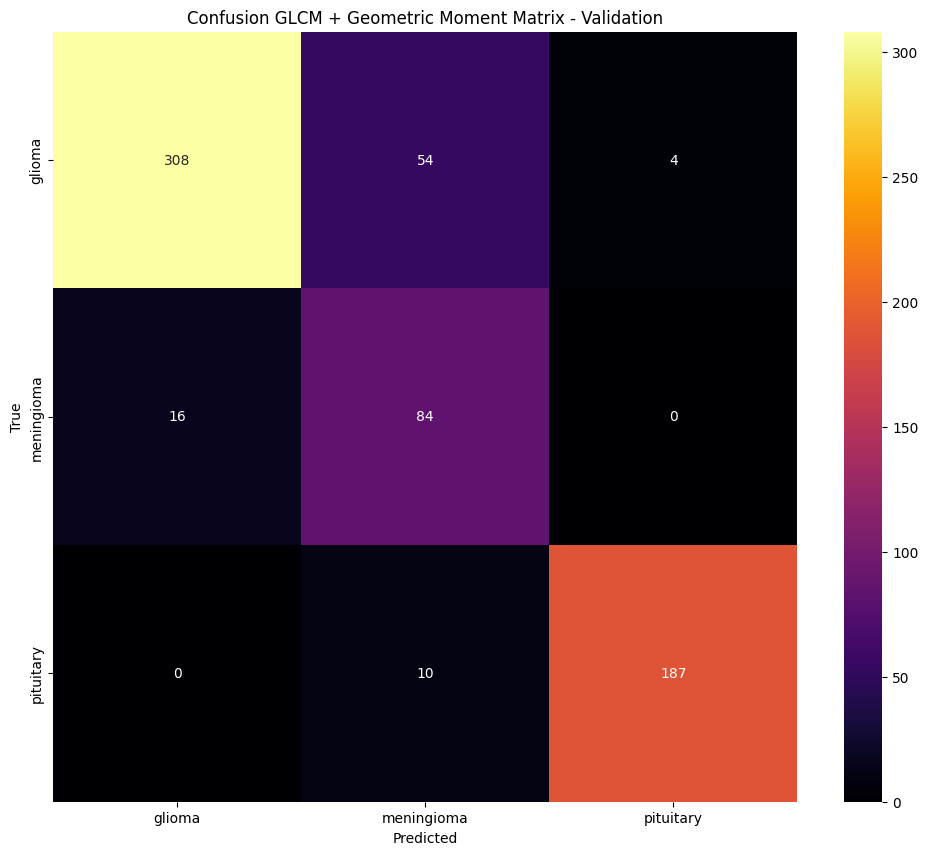

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_val_com, y_val_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='inferno', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion GLCM + Geometric Moment Matrix - Validation')
plt.show()


###### Hyperparameter Tuning - GLCM + GM

In [ ]:
from sklearn.model_selection import GridSearchCV, train_test_split, StratifiedKFold

param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'criterion':['entropy', 'gini'],
    # 'max_features': ['sqrt', 'log2'],
    'max_depth': [3, 5, 7, 9, 13],
    'class_weight': ['balanced']  # Use 'balanced' class weight
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=cv, n_jobs=-1, verbose=2)
grid_search.fit(X_train_com, y_train_com)

# Print the best parameters and the best score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best Parameters: {'class_weight': 'balanced', 'criterion': 'entropy', 'max_depth': 13, 'n_estimators': 2000}
Best Cross-Validation Score: 0.8865771812080536


In [ ]:
# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_val_pred = best_rf.predict(X_val_com)

# Evaluate the performance on the test set
print("Validation Accuracy:", accuracy_score(y_val_com, y_val_pred))
print("Validation Classification Report:\n", classification_report(y_val_com, y_val_pred))

Validation Accuracy: 0.8702865761689291
Validation Classification Report:
               precision    recall  f1-score   support

      glioma       0.95      0.83      0.89       366
  meningioma       0.57      0.85      0.69       100
   pituitary       0.96      0.95      0.96       197

    accuracy                           0.87       663
   macro avg       0.83      0.88      0.84       663
weighted avg       0.90      0.87      0.88       663



In [ ]:
# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_test_pred = best_rf.predict(X_test_com)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_com, y_test_pred))
print("Test Classification Report:\n", classification_report(y_test_com, y_test_pred))

Test Accuracy: 0.8375411635565313
Test Classification Report:
               precision    recall  f1-score   support

      glioma       0.90      0.82      0.86       446
  meningioma       0.63      0.79      0.70       194
   pituitary       0.92      0.90      0.91       271

    accuracy                           0.84       911
   macro avg       0.82      0.84      0.82       911
weighted avg       0.85      0.84      0.84       911



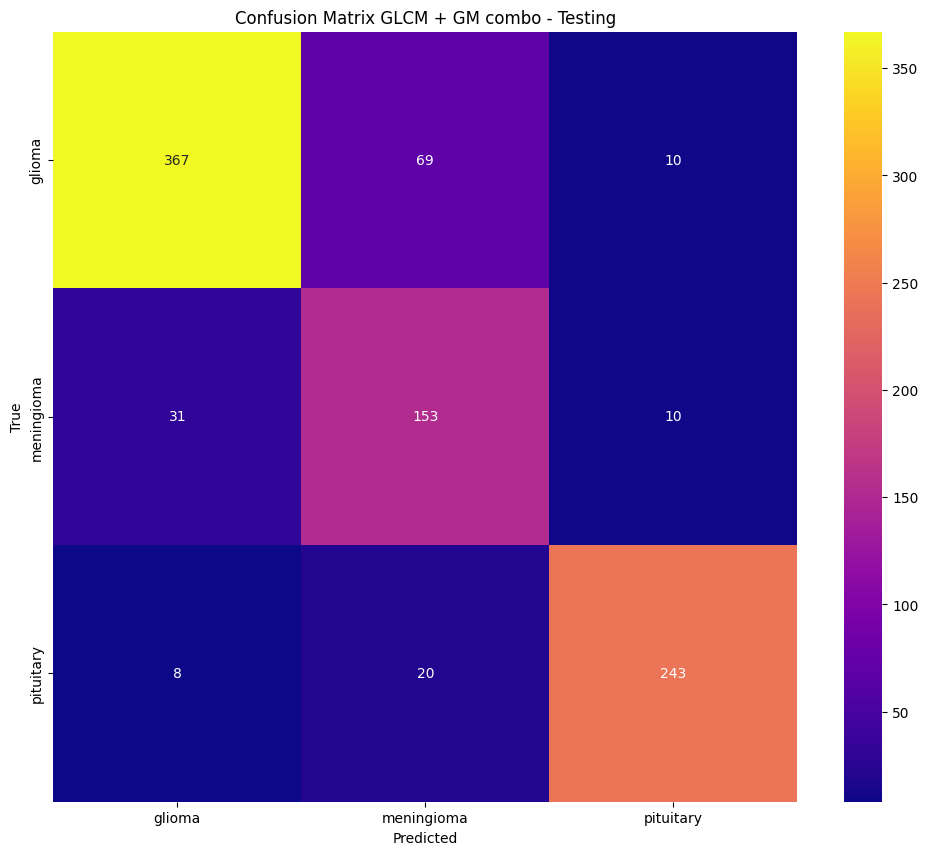

In [ ]:
# print confusion matrix
cm = confusion_matrix(y_test_com, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='plasma', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix GLCM + GM combo - Testing')
plt.show()


From all the initial iterations with just the GLCM descriptors, the combination performs better not only on the lower class but the higher classes as well.

the misclassification of glioma for meningioma has reduced by 40% and for glioma for pituitary more than 90%.

In [ ]:
# bayesian optimisation
# Step 2: Define the objective function for Optuna
def objective(trial):
    # Define the parameter search space
    n_estimators = trial.suggest_int('n_estimators', 100, 300)
    max_depth = trial.suggest_int('max_depth', 10, 30)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)
    bootstrap = trial.suggest_categorical('bootstrap', [True, False])

    # Initialize the RandomForestClassifier with the current hyperparameters
    rf = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        bootstrap=bootstrap,
        random_state=42
    )

    # Define the cross-validation strategy
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    # Perform cross-validation and return the mean accuracy
    scores = cross_val_score(rf, X_train_com, y_train_com, cv=cv, scoring='accuracy')
    return scores.mean()
# Step 3: Create an Optuna study and optimize the objective function
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, n_jobs=-1)

# Print the best parameters and the best score
print("Best Parameters:", study.best_params)
print("Best Cross-Validation Score:", study.best_value)

[I 2024-06-29 00:50:07,184] A new study created in memory with name: no-name-a3997404-88e4-4bdd-bcf2-5f28b81901ae
[I 2024-06-29 00:50:20,132] Trial 1 finished with value: 0.8516778523489933 and parameters: {'n_estimators': 256, 'max_depth': 11, 'min_samples_split': 9, 'min_samples_leaf': 3, 'bootstrap': True}. Best is trial 1 with value: 0.8516778523489933.
[I 2024-06-29 00:50:22,179] Trial 0 finished with value: 0.878523489932886 and parameters: {'n_estimators': 217, 'max_depth': 13, 'min_samples_split': 10, 'min_samples_leaf': 1, 'bootstrap': False}. Best is trial 0 with value: 0.878523489932886.
[I 2024-06-29 00:50:31,459] Trial 2 finished with value: 0.851006711409396 and parameters: {'n_estimators': 213, 'max_depth': 26, 'min_samples_split': 10, 'min_samples_leaf': 4, 'bootstrap': True}. Best is trial 0 with value: 0.878523489932886.
[I 2024-06-29 00:50:31,703] Trial 3 finished with value: 0.8604026845637585 and parameters: {'n_estimators': 161, 'max_depth': 18, 'min_samples_split

Best Parameters: {'n_estimators': 118, 'max_depth': 22, 'min_samples_split': 4, 'min_samples_leaf': 1, 'bootstrap': False}
Best Cross-Validation Score: 0.8926174496644295


In [ ]:
# , train the best model on the entire dataset
best_rf = RandomForestClassifier(
    n_estimators=study.best_params['n_estimators'],
    max_depth=study.best_params['max_depth'],
    bootstrap=study.best_params['bootstrap'],
    random_state=42
)
best_rf.fit(X_train_com, y_train_com)

RandomForestClassifier(bootstrap=False, max_depth=22, n_estimators=118,
                       random_state=42)

In [ ]:
# Evaluate the best model on the validation set
y_val_pred = best_rf.predict(X_val_com)
print("Validation Accuracy:", accuracy_score(y_val_com, y_val_pred))
print("Validation Classification Report:")
print(classification_report(y_val_com, y_val_pred))

Validation Accuracy: 0.8582202111613876
Validation Classification Report:
              precision    recall  f1-score   support

      glioma       0.92      0.84      0.88       366
  meningioma       0.55      0.77      0.64       100
   pituitary       0.97      0.94      0.96       197

    accuracy                           0.86       663
   macro avg       0.81      0.85      0.83       663
weighted avg       0.88      0.86      0.87       663



In [ ]:
# Evaluate the best model on the validation set
y_test_pred = best_rf.predict(X_test_com)
print("Validation Accuracy:", accuracy_score(y_test_com, y_test_pred))
print("Validation Classification Report:")
print(classification_report(y_test_com, y_test_pred))

Validation Accuracy: 0.8397365532381997
Validation Classification Report:
              precision    recall  f1-score   support

      glioma       0.91      0.84      0.87       446
  meningioma       0.63      0.79      0.70       194
   pituitary       0.94      0.87      0.90       271

    accuracy                           0.84       911
   macro avg       0.82      0.84      0.83       911
weighted avg       0.86      0.84      0.84       911



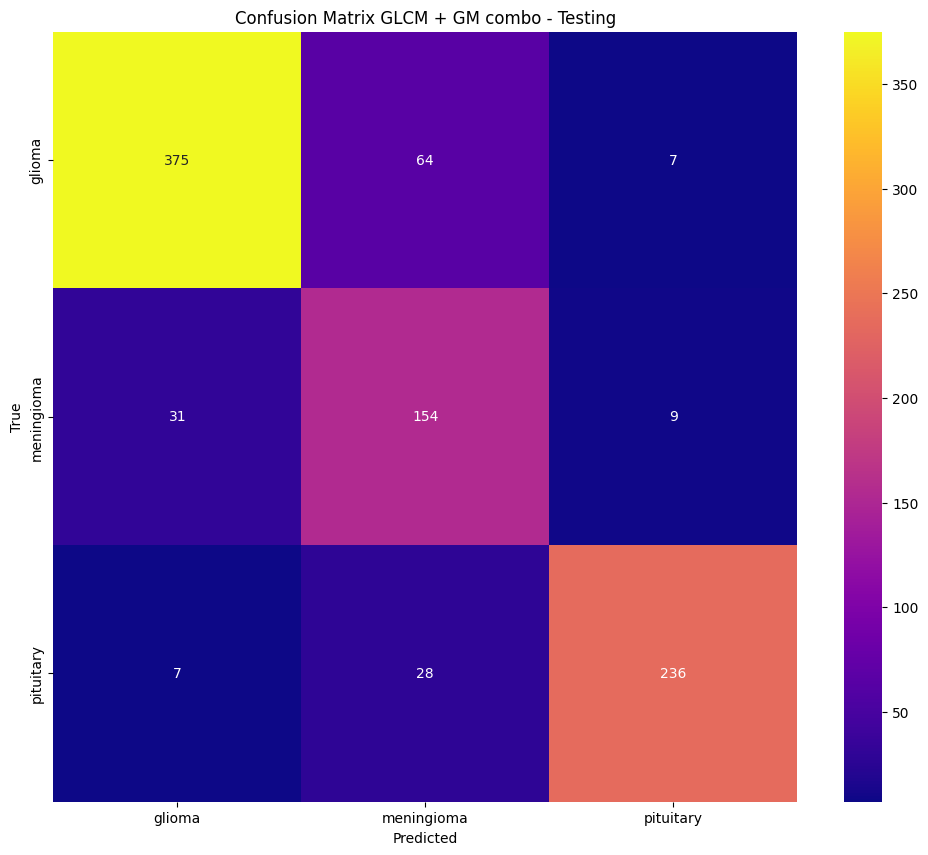

In [ ]:
# print confusion matrix
cm = confusion_matrix(y_test_com, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='plasma', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix GLCM + GM combo - Testing')
plt.show()


##### Feature Extractor 4: GLCM + GM Combo - Class Imbalance

1. Weighting

In [ ]:
# class imbalance
# weighting


from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight


# Encode the labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_com)
y_val_encoded = label_encoder.transform(y_val_com)
y_test_encoded = label_encoder.transform(y_test_com)

# Compute class weights
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_encoded), y=y_train_encoded)
class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}


In [ ]:
# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'criterion':['entropy', 'gini'],
    'max_depth': [3, 5, 7, 9, 13],
    'class_weight': ['balanced']  # Use 'balanced' class weight
}

# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Perform the grid search on the training data
grid_search.fit(X_train_com, y_train_com)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'class_weight': ['balanced'],
                         'criterion': ['entropy', 'gini'],
                         'max_depth': [3, 5, 7, 9, 13],
                         'n_estimators': [100, 500, 1000, 2000]},
             verbose=2)

In [ ]:
# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_val_pred_weight = best_rf.predict(X_val_com)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_val_encoded, y_val_pred_weight))
print("Test Classification Report:\n", classification_report(y_val_encoded, y_val_pred_weight))

Test Accuracy: 0.0


ValueError: Mix of label input types (string and number)

In [ ]:
# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_test_pred_weight = best_rf.predict(X_test_com)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_encoded, y_test_pred_weight))
print("Test Classification Report:\n", classification_report(y_test_encoded, y_test_pred_weight))

Test Accuracy: 0.8342480790340285
Test Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.83      0.86       446
           1       0.64      0.76      0.70       194
           2       0.93      0.89      0.91       271

    accuracy                           0.83       911
   macro avg       0.82      0.83      0.82       911
weighted avg       0.84      0.83      0.84       911



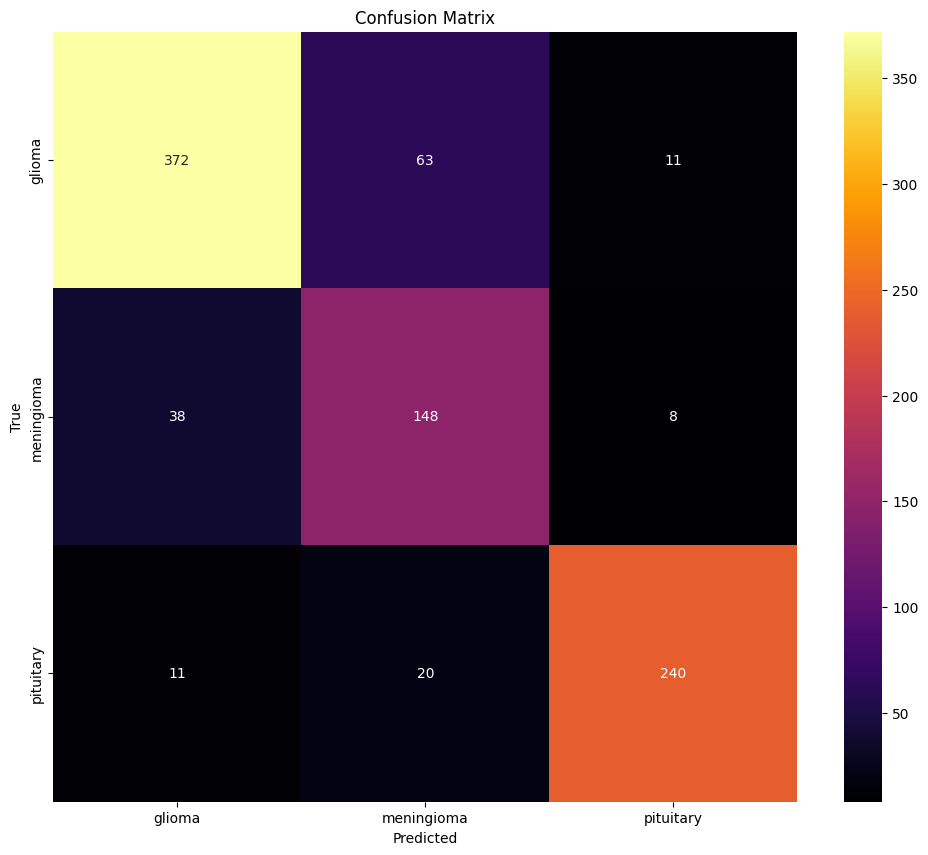

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_encoded, y_test_pred_weight)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='inferno', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


##### 2. SMOTE

In [ ]:
# Resample the training data using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_combined, y_train_combined)


# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'criterion':['entropy', 'gini'],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [3, 5, 7, 9, 13],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}


# Initialize GridSearchCV
rf = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train_resampled, y_train_resampled)

# Print the best parameters and the best score
print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)



Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best Cross-Validation Score: 0.8615646258503402


In [ ]:
# Use the best estimator to make predictions on the test set
best_rf = grid_search.best_estimator_
y_test_pred = best_rf.predict(X_test_com)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_encoded, y_test_pred))
print("Test Classification Report:\n", classification_report(y_test_encoded, y_test_pred))




Test Accuracy: 0.823271130625686
Test Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.82      0.85       446
           1       0.63      0.71      0.67       194
           2       0.88      0.91      0.89       271

    accuracy                           0.82       911
   macro avg       0.80      0.81      0.81       911
weighted avg       0.83      0.82      0.83       911



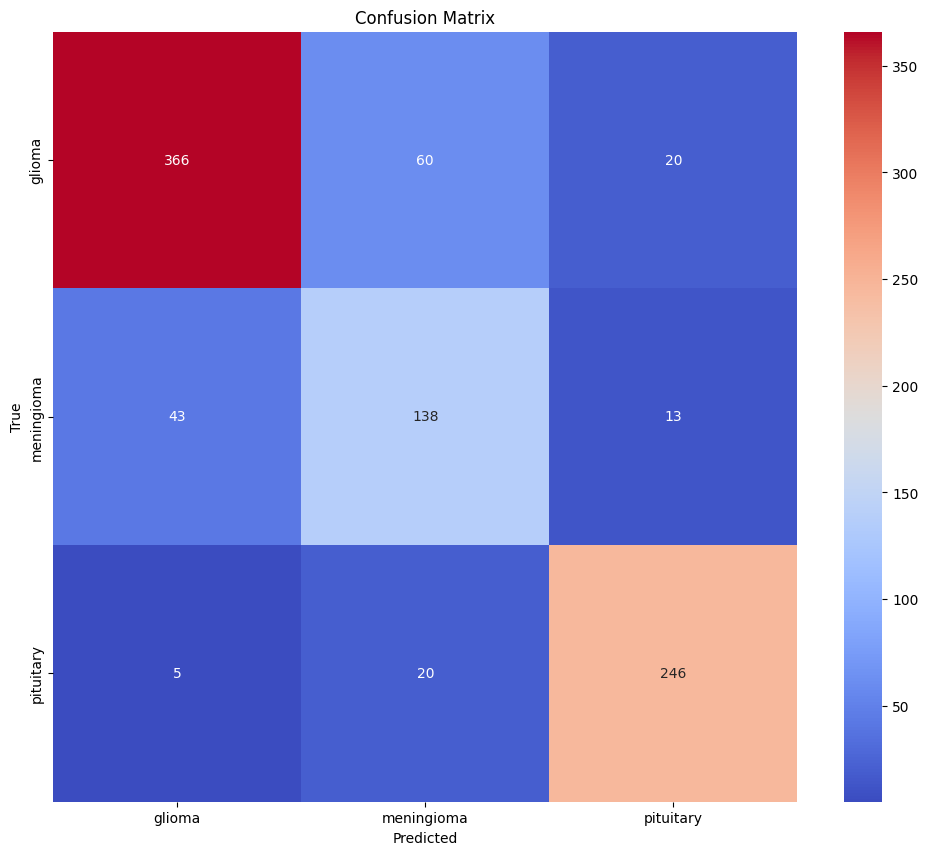

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_encoded, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

##### Model 3- Support Vector Machine SVM: GM + GLCM

In [ ]:
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train_com)
X_val = scaler.transform(X_val_com)
X_test = scaler.transform(X_test_com)

NameError: name 'X_train_com' is not defined

In [ ]:
svm_classifier = SVC(kernel='rbf')

# Hyperparameter tuning using Grid Search for RBF kernel
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [1, 0.1, 0.01, 0.001],
    'decision_function_shape': ['ovr', 'ovo']
}


baseline_svm = SVC(kernel='rbf', C=11, gamma='scale', class_weight="balanced", decision_function_shape="ovr",)  # Default parameters
baseline_svm.fit(X_train_com, y_train_com)


SVC(C=11, class_weight='balanced')

In [ ]:
# Evaluate the baseline model on the validation set
y_val_pred_baseline = baseline_svm.predict(X_val_com)
val_accuracy_baseline = accuracy_score(y_val_com, y_val_pred_baseline)
val_report_baseline = classification_report(y_val_com, y_val_pred_baseline)

print("Baseline Model Validation Performance:")
print(f"Validation Accuracy: {val_accuracy_baseline}")
print("Validation Classification Report:")
print(val_report_baseline)

Baseline Model Validation Performance:
Validation Accuracy: 0.8717948717948718
Validation Classification Report:
              precision    recall  f1-score   support

      glioma       0.90      0.87      0.89       366
  meningioma       0.66      0.83      0.73       100
   pituitary       0.96      0.89      0.92       197

    accuracy                           0.87       663
   macro avg       0.84      0.86      0.85       663
weighted avg       0.88      0.87      0.88       663



In [ ]:
# Evaluate the baseline model on the validation set
y_test_pred_baseline = baseline_svm.predict(X_test_com)
test_accuracy_baseline = accuracy_score(y_test_com, y_test_pred_baseline)
test_report_baseline = classification_report(y_test_com, y_test_pred_baseline)

print("Baseline Model Test Performance:")
print(f"Testing Accuracy: {test_accuracy_baseline}")
print("Testing Classification Report:")
print(test_report_baseline)

Baseline Model Test Performance:
Testing Accuracy: 0.8463227222832053
Testing Classification Report:
              precision    recall  f1-score   support

      glioma       0.89      0.83      0.86       446
  meningioma       0.67      0.70      0.68       194
   pituitary       0.90      0.97      0.94       271

    accuracy                           0.85       911
   macro avg       0.82      0.83      0.83       911
weighted avg       0.85      0.85      0.85       911



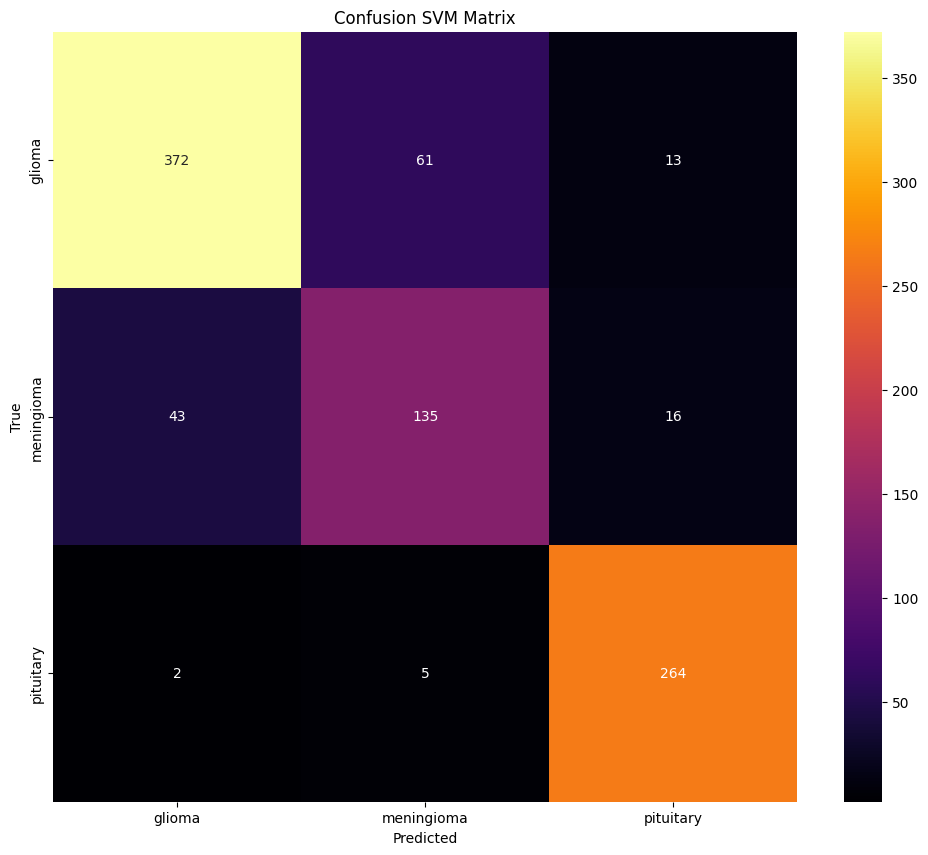

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_com, y_test_pred_baseline)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='inferno', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion SVM Matrix')
plt.show()

In [ ]:

grid_search = GridSearchCV(estimator=baseline_svm, param_grid=param_grid, cv=10, verbose=2, n_jobs=-1)
grid_search.fit(X_train_com, y_train_com)


Fitting 10 folds for each of 32 candidates, totalling 320 fits


GridSearchCV(cv=10, estimator=SVC(C=11, class_weight='balanced'), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100],
                         'decision_function_shape': ['ovr', 'ovo'],
                         'gamma': [1, 0.1, 0.01, 0.001]},
             verbose=2)

In [ ]:
# Best parameters
best_params = grid_search.best_params_
print(f"Best Parameters: {best_params}")

Best Parameters: {'C': 10, 'decision_function_shape': 'ovr', 'gamma': 0.1}


In [ ]:
# Train the best SVM classifier
best_svm_classifier = grid_search.best_estimator_
best_svm_classifier.fit(X_train_com, y_train_com)

SVC(C=10, class_weight='balanced', gamma=0.1)

In [ ]:
# Make predictions on the validation set
y_val_pred = best_svm_classifier.predict(X_val_com)

In [ ]:
# Evaluate the classifier on the validation set
val_accuracy = accuracy_score(y_val_com, y_val_pred)
val_report = classification_report(y_val_com, y_val_pred)

print(f"Validation Accuracy: {val_accuracy}")
print("Validation Classification Report:")
print(val_report)

Validation Accuracy: 0.8461538461538461
Validation Classification Report:
              precision    recall  f1-score   support

      glioma       0.86      0.89      0.87       366
  meningioma       0.60      0.66      0.63       100
   pituitary       0.97      0.86      0.91       197

    accuracy                           0.85       663
   macro avg       0.81      0.80      0.80       663
weighted avg       0.85      0.85      0.85       663



In [ ]:
# Make predictions on the test set
y_test_pred = best_svm_classifier.predict(X_test_com)

# Evaluate the classifier on the test set
test_accuracy = accuracy_score(y_test_com, y_test_pred)
test_report = classification_report(y_test_com, y_test_pred)

print(f"Test Accuracy: {test_accuracy}")
print("Test Classification Report:")
print(test_report)

Test Accuracy: 0.8243688254665203
Test Classification Report:
              precision    recall  f1-score   support

      glioma       0.86      0.85      0.85       446
  meningioma       0.63      0.63      0.63       194
   pituitary       0.91      0.93      0.92       271

    accuracy                           0.82       911
   macro avg       0.80      0.80      0.80       911
weighted avg       0.82      0.82      0.82       911



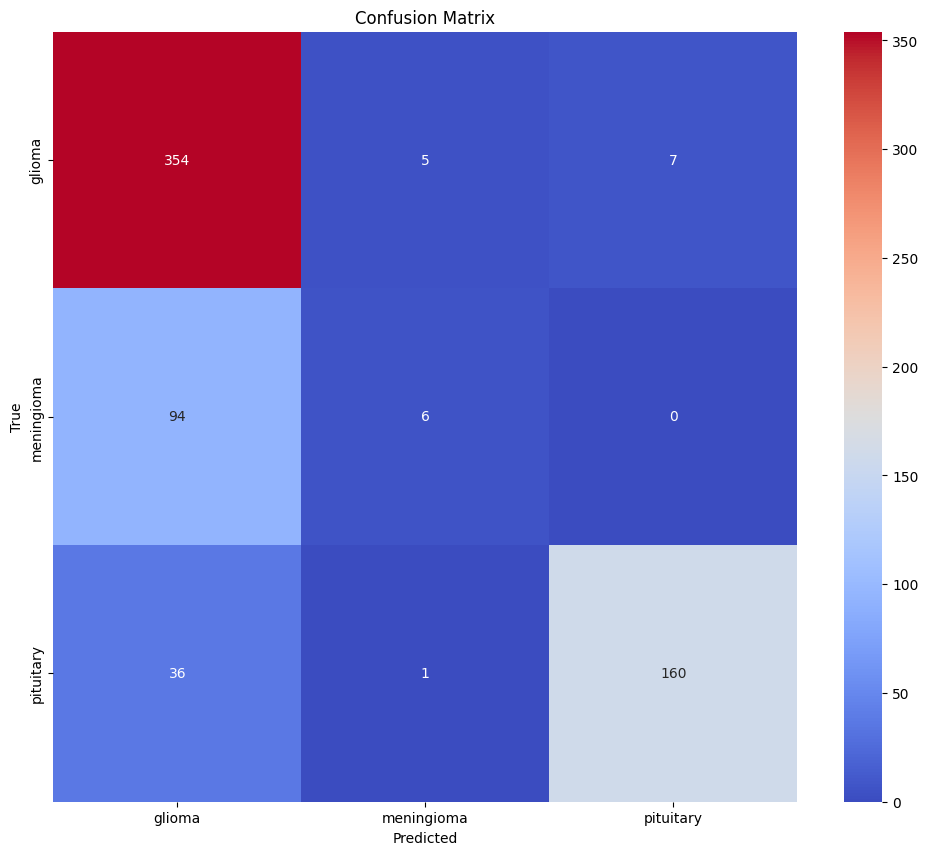

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_com, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


##### Model 4 - Extra Trees: GLCM + GM

##### Model 5- Gradient Boosting: GLCM + GM

##### Model 6 - Stacking Ensemble: GM + GLCM

### Feature Extractor 4: Local Binary Pattern

In [ ]:
# Function to apply Gaussian filter
def apply_gaussian_filter(image, sigma):
    return cv2.GaussianBlur(image, (0, 0), sigma)


# Function to extract LBP features from ROI defined by the mask
def extract_multiresolution_lbp_features_with_mask(image, mask, scales, n_points, method):
    features = []
    for (P, R, sigma) in scales:
        smoothed_image = apply_gaussian_filter(image, sigma)
        lbp = local_binary_pattern(smoothed_image, P, R, method=method)
        mask_indices = np.where(mask > 0)
        masked_lbp = lbp[mask_indices]
        hist, _ = np.histogram(masked_lbp, bins=np.arange(0, P + 3), range=(0, P + 2))
        features.extend(hist)
    return features

# Define parameters for multiresolution LBP
scales = [(8, 1, 1), (16, 3, 2), (24, 5, 3)]  # (P, R, sigma)
n_points = 24  # Number of points
method = 'uniform'  # LBP method

In [ ]:
# Adjusted load_data_lbp function
def load_data_lbp(images_dir, masks_dir, scales, n_points, method):
    X = []
    y = []

    for class_name in os.listdir(images_dir):
        class_image_dir = os.path.join(images_dir, class_name)
        class_mask_dir = os.path.join(masks_dir, class_name)

        if os.path.isdir(class_image_dir) and os.path.isdir(class_mask_dir):
            for image_name in os.listdir(class_image_dir):
                image_path = os.path.join(class_image_dir, image_name)
                mask_name = image_name.replace(".png", "_mask.png")
                mask_path = os.path.join(class_mask_dir, mask_name)

                if os.path.exists(image_path) and os.path.exists(mask_path):
                    # Convert paths to str for cv2.imread
                    image_path = str(image_path)
                    mask_path = str(mask_path)

                    # Read the image and mask
                    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

                    if image is not None and mask is not None:
                        # Extract LBP features
                        try:
                            features = extract_multiresolution_lbp_features_with_mask(image, mask, scales, n_points, method)
                            # Append features and label
                            X.append(features)
                            y.append(class_name)
                        except ValueError as e:
                            print(f"Error processing {image_path} and {mask_path}: {e}")
                            continue

    return np.array(X), np.array(y)

In [ ]:
# Feature selection on the various datasets
X_train_lbp, y_train_lbp = load_data_lbp(train_images_dir, train_masks_dir,  scales, n_points, method)
X_val_lbp, y_val_lbp = load_data_lbp(val_images_dir, val_masks_dir,  scales, n_points, method)
X_test_lbp, y_test_lbp = load_data_lbp(test_images_dir, test_masks_dir,  scales, n_points, method)

In [ ]:
X_train_lbp.shape

(1490, 54)

In [ ]:

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_lbp)
y_val_encoded = label_encoder.transform(y_val_lbp)
y_test_encoded = label_encoder.transform(y_test_lbp)

# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_lbp, y_train_encoded)

    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_lbp, y_val_encoded, cv=stratified_kfold, scoring='balanced_accuracy', n_jobs=-1)
    print(f"{name} cross-validated balanced accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_lbp)
    test_accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_encoded, y_pred, target_names=label_encoder.classes_))

    # Calculate balanced accuracy on the test set
    balanced_acc = balanced_accuracy_score(y_test_encoded, y_pred)
    print(f'{name} test balanced accuracy: {balanced_acc:.3f}')
      # Confusion matrix function
    def calculate_specificity_per_class(y_true, y_pred):
        labels = np.unique(y_true)  # Get unique classes from true labels
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        specificity_per_class = []
        for i in range(len(cm)):
            tn = sum(sum(cm)) - (sum(cm[i, :]) + sum(cm[:, i]) - cm[i, i])
            fp = sum(cm[:, i]) - cm[i, i]
            specificity = tn / (tn + fp) if (tn + fp) != 0 else 0  # Handle division by zero
            specificity_per_class.append(specificity)
        return specificity_per_class

    # Assuming y_test_encoded and y_pred are available
    specificity_per_class = calculate_specificity_per_class(y_test_encoded, y_pred)
    balanced_specificity = np.mean(specificity_per_class)

    print(f'Balanced Specificity: {balanced_specificity:.3f}')



Training and evaluating Logistic Regression pipeline...
Logistic Regression cross-validated balanced accuracy on validation set: 0.669 ± 0.038
Logistic Regression test accuracy: 0.741
Logistic Regression Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.92      0.70      0.79       446
  meningioma       0.70      0.65      0.67       194
   pituitary       0.61      0.88      0.72       271

    accuracy                           0.74       911
   macro avg       0.74      0.74      0.73       911
weighted avg       0.78      0.74      0.75       911

Logistic Regression test balanced accuracy: 0.742
Balanced Specificity: 0.875

Training and evaluating Random Forest pipeline...
Random Forest cross-validated balanced accuracy on validation set: 0.742 ± 0.022
Random Forest test accuracy: 0.774
Random Forest Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.89     

In [ ]:
print(f"Loaded {len(X_train_lbp)} training samples, {len(X_test_lbp)} testing samples, and {len(X_val_lbp)} validation samples.")


Loaded 1490 training samples, 911 testing samples, and 663 validation samples.


In [ ]:
# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_com, y_train_com)
    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_com, y_val_com, cv=stratified_kfold, scoring='accuracy', n_jobs=-1)
    print(f"{name} cross-validated accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_com)
    test_accuracy = accuracy_score(y_test_com, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_com, y_pred))

In [ ]:
X_train_lbp.shape

(1490, 54)

###### Model 1 - Logistic Regression

###### Model 2 - RandomForest LBP

In [ ]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_estimators=1000, random_state=42)
classifier.fit(X_train_lbp, y_train_lbp)

RandomForestClassifier(n_estimators=1000, random_state=42)

In [ ]:
# Predict on the validation set
y_val_pred = classifier.predict(X_val_lbp)

# Evaluate the classifier on the validation set
val_accuracy = accuracy_score(y_val_lbp, y_val_pred)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

Validation Accuracy: 78.88%


In [ ]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from scipy.stats import randint

# hyperparameter tuning
X_train_combined = np.vstack((X_train_lbp, X_val_lbp))
y_train_combined = np.hstack((y_train_lbp, y_val_lbp))

from sklearn.model_selection import GridSearchCV, train_test_split

# Define the parameter grid for hyperparameter tuning
# Reduced parameter grid for hyperparameter tuning
param_dist = {
    'n_estimators': randint(100, 2000),
    'max_depth': randint(3, 20),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 5),
    'criterion': ['entropy', 'gini'],
    'max_features': ['sqrt', 'log2']
}


# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=100, cv=5, n_jobs=-1, verbose=2, random_state=42)

# Perform the grid search on the training data
random_search.fit(X_train_combined, y_train_combined)

# Print the best parameters
print("Best parameters found: ", random_search.best_params_)




Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters found:  {'criterion': 'entropy', 'max_depth': 11, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1181}


In [ ]:
# Use the best estimator to make predictions on the test set
y_test_pred = random_search.predict(X_test_lbp)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_lbp, y_test_pred))
print("Test Classification Report:\n", classification_report(y_test_lbp, y_test_pred))



Test Accuracy: 0.7705817782656421
Test Classification Report:
               precision    recall  f1-score   support

      glioma       0.88      0.80      0.84       446
  meningioma       0.74      0.61      0.67       194
   pituitary       0.65      0.83      0.73       271

    accuracy                           0.77       911
   macro avg       0.76      0.75      0.75       911
weighted avg       0.78      0.77      0.77       911



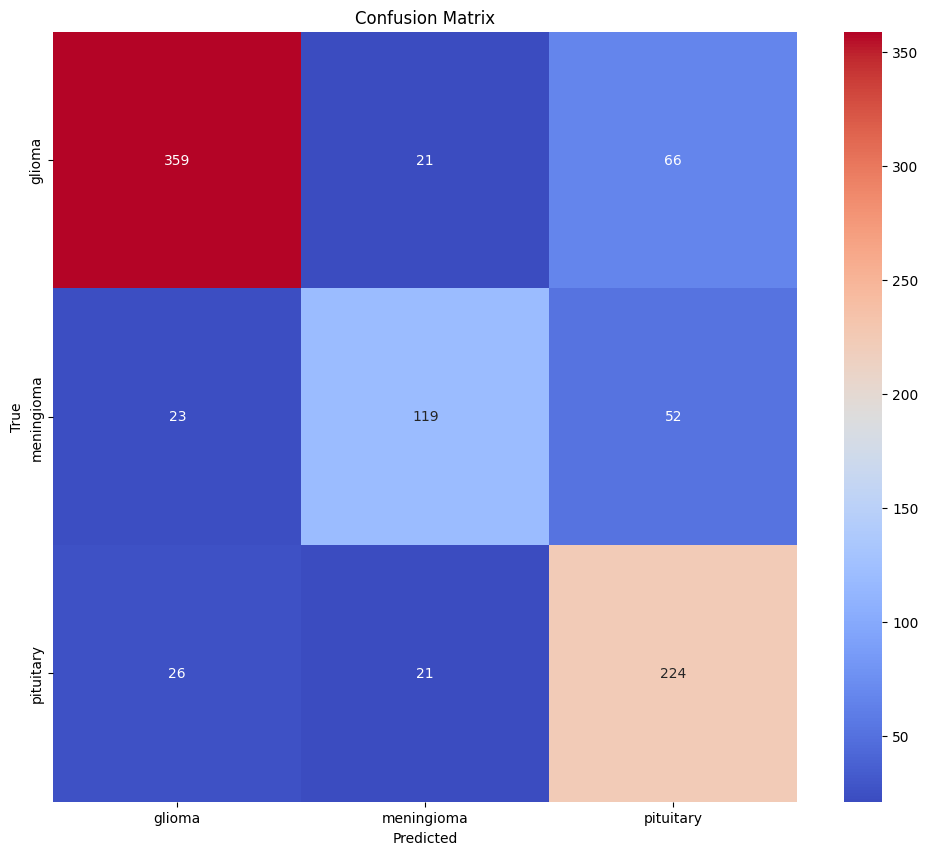

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_lbp, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
# Predict on the test set
y_test_pred = classifier.predict(X_test_lbp)

# Evaluate the classifier on the test set
test_accuracy = accuracy_score(y_test_lbp, y_test_pred)
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")

Test Accuracy: 77.28%


In [ ]:
# Detailed evaluation
conf_matrix = confusion_matrix(y_test_lbp, y_test_pred)
class_report = classification_report(y_test_lbp, y_test_pred)
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Confusion Matrix:
[[357  32  57]
 [ 19 138  37]
 [ 26  36 209]]

Classification Report:
              precision    recall  f1-score   support

      glioma       0.89      0.80      0.84       446
  meningioma       0.67      0.71      0.69       194
   pituitary       0.69      0.77      0.73       271

    accuracy                           0.77       911
   macro avg       0.75      0.76      0.75       911
weighted avg       0.78      0.77      0.78       911



In [ ]:
# deal with the class imbalance
# Resample the training data using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_combined, y_train_combined)

param_dist = {
    'n_estimators': randint(100, 2000),
    'max_depth': randint(3, 20),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 5),
    'criterion': ['entropy', 'gini'],
    'max_features': ['sqrt', 'log2']
}


# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=100, cv=10, n_jobs=-1, verbose=2, random_state=42)

# Perform the grid search on the training data
random_search.fit(X_train_resampled, y_train_resampled)

# Print the best parameters
print("Best parameters found: ", random_search.best_params_)




Fitting 10 folds for each of 100 candidates, totalling 1000 fits
Best parameters found:  {'criterion': 'gini', 'max_depth': 19, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1934}


In [ ]:
# Use the best estimator to make predictions on the test set
y_test_pred = random_search.predict(X_test_lbp)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_lbp, y_test_pred))
print("Test Classification Report:\n", classification_report(y_test_lbp, y_test_pred))



Test Accuracy: 0.7749725576289791
Test Classification Report:
               precision    recall  f1-score   support

      glioma       0.92      0.79      0.85       446
  meningioma       0.68      0.69      0.68       194
   pituitary       0.66      0.82      0.73       271

    accuracy                           0.77       911
   macro avg       0.75      0.76      0.75       911
weighted avg       0.79      0.77      0.78       911



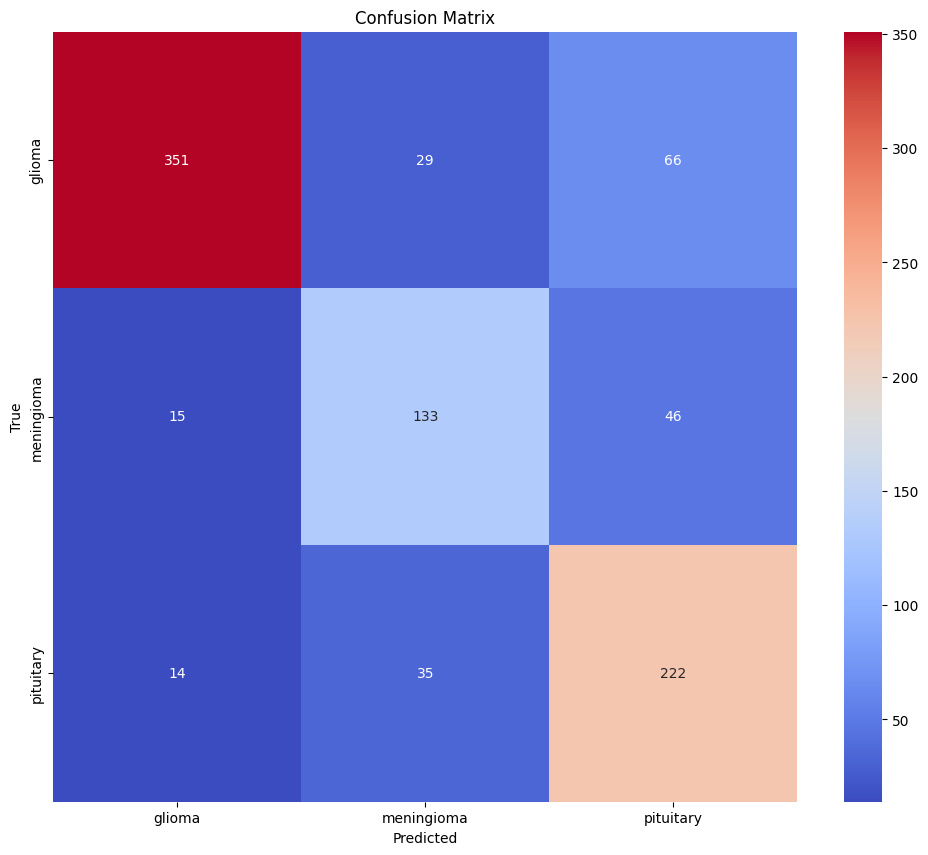

In [ ]:
# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_lbp, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


### Feature Extractor 5: Histogram of Oriented Gradients

In [ ]:
import cv2
import numpy as np
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score


In [ ]:
def extract_hog_features(image):
    features, hog_image = hog(image, orientations=9, pixels_per_cell=(8, 8),
                              cells_per_block=(2, 2), block_norm='L2-Hys',
                              visualize=True, transform_sqrt=True)
    return features, hog_image


In [ ]:
def visualize_hog(original_image, mask, masked_image, resized_image, hog_image):
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    plt.figure(figsize=(20, 8))

    plt.subplot(1, 5, 1)
    plt.title('Original Image')
    plt.imshow(original_image, cmap='gray')

    plt.subplot(1, 5, 2)
    plt.title('Mask')
    plt.imshow(mask, cmap='gray')

    plt.subplot(1, 5, 3)
    plt.title('Masked Image')
    plt.imshow(masked_image, cmap='gray')

    plt.subplot(1, 5, 4)
    plt.title('Resized Image')
    plt.imshow(resized_image, cmap='gray')

    plt.subplot(1, 5, 5)
    plt.title('HOG Features')
    plt.imshow(hog_image_rescaled, cmap='gray')

    plt.show()

In [ ]:
def load_data_hog(images_dir, masks_dir, target_size=(128, 64)):
    X = []
    y = []

    for class_name in os.listdir(images_dir):
        class_image_dir = os.path.join(images_dir, class_name)
        class_mask_dir = os.path.join(masks_dir, class_name)

        if os.path.isdir(class_image_dir) and os.path.isdir(class_mask_dir):
            for image_name in os.listdir(class_image_dir):
                image_path = os.path.join(class_image_dir, image_name)
                mask_name = image_name.replace(".png", "_mask.png")
                mask_path = os.path.join(class_mask_dir, mask_name)

                if os.path.exists(image_path) and os.path.exists(mask_path):
                    # Convert paths to str for cv2.imread
                    image_path = str(image_path)
                    mask_path = str(mask_path)

                    # Read the image and mask
                    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

                    if image is not None and mask is not None:
                        # Apply the mask to the image
                        masked_image = cv2.bitwise_and(image, image, mask=mask)

                        # Resize the masked image to the target size
                        resized_image = cv2.resize(masked_image, target_size)

                        # Extract HOG features
                        hog_features, hog_image = extract_hog_features(resized_image)

                        # Append features and label
                        X.append(hog_features)
                        y.append(class_name)

                        # Visualize one example (comment out after debugging)
                        # visualize_hog(image, mask, masked_image, resized_image, hog_image)
                        # return np.array(X), np.array(y)

    return np.array(X), np.array(y)

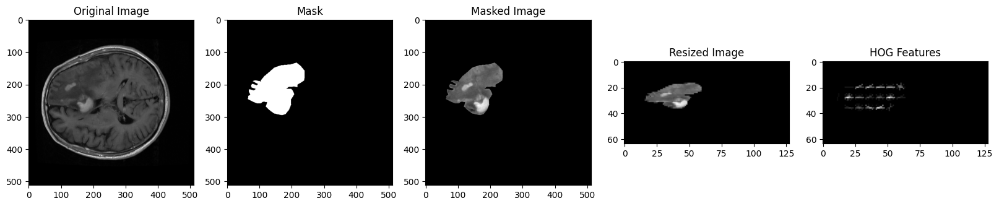

In [ ]:
X, y = load_data_hog(train_images_dir, train_masks_dir, target_size=(128, 64) )


In [ ]:
# Feature selection on the various datasets
X_train_hog, y_train_hog = load_data_hog(train_images_dir, train_masks_dir,  target_size=(128, 64))
X_val_hog, y_val_hog = load_data_hog(val_images_dir, val_masks_dir,  target_size=(128, 64))
X_test_hog, y_test_hog = load_data_hog(test_images_dir, test_masks_dir,  target_size=(128, 64))

In [ ]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LassoCV

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_hog)
y_val_encoded = label_encoder.transform(y_val_hog)
y_test_encoded = label_encoder.transform(y_test_hog)

model = RandomForestClassifier()
sfm = SelectFromModel(LassoCV(cv=5, max_iter=10000), threshold='mean')  # Using 'mean' to select features above average importance
sfm.fit(X_train_hog, y_train_encoded)


X_train_hog = sfm.transform(X_train_hog)
X_val_hog = sfm.transform(X_val_hog)
X_test_hog = sfm.transform(X_test_hog)

In [ ]:
X_train_hog.shape

(1490, 142)

In [ ]:


# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_hog, y_train_encoded)


    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_hog, y_val_encoded, cv=stratified_kfold, scoring='balanced_accuracy', n_jobs=-1)
    print(f"{name} cross-validated balanced accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_hog)
    test_accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_encoded, y_pred, target_names=label_encoder.classes_))

    # Calculate balanced accuracy on the test set
    balanced_acc = balanced_accuracy_score(y_test_encoded, y_pred)
    print(f'{name} test balanced accuracy: {balanced_acc:.3f}')

          # Confusion matrix function
    def calculate_specificity_per_class(y_true, y_pred):
        labels = np.unique(y_true)  # Get unique classes from true labels
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        specificity_per_class = []
        for i in range(len(cm)):
            tn = sum(sum(cm)) - (sum(cm[i, :]) + sum(cm[:, i]) - cm[i, i])
            fp = sum(cm[:, i]) - cm[i, i]
            specificity = tn / (tn + fp) if (tn + fp) != 0 else 0  # Handle division by zero
            specificity_per_class.append(specificity)
        return specificity_per_class

    # Assuming y_test_encoded and y_pred are available
    specificity_per_class = calculate_specificity_per_class(y_test_encoded, y_pred)
    balanced_specificity = np.mean(specificity_per_class)

    print(f'Balanced Specificity: {balanced_specificity:.3f}')


Training and evaluating Logistic Regression pipeline...
Logistic Regression cross-validated balanced accuracy on validation set: 0.815 ± 0.062
Logistic Regression test accuracy: 0.616
Logistic Regression Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.73      0.61      0.66       446
  meningioma       0.29      0.32      0.30       194
   pituitary       0.70      0.85      0.76       271

    accuracy                           0.62       911
   macro avg       0.57      0.59      0.58       911
weighted avg       0.63      0.62      0.62       911

Logistic Regression test balanced accuracy: 0.590
Balanced Specificity: 0.807

Training and evaluating Random Forest pipeline...
Random Forest cross-validated balanced accuracy on validation set: 0.817 ± 0.049
Random Forest test accuracy: 0.724
Random Forest Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.83     

##### Model 2 : Random Forest + HOG

In [ ]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_estimators=1000, random_state=42)
classifier.fit(X_train_hog, y_train_hog)

RandomForestClassifier(n_estimators=1000, random_state=42)

In [ ]:
# Predict on the validation set
y_val_pred = classifier.predict(X_val_hog)

# Evaluate the classifier on the validation set
val_accuracy = accuracy_score(y_val_hog, y_val_pred)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

Validation Accuracy: 74.96%


In [ ]:

from sklearn.model_selection import train_test_split, RandomizedSearchCV
from scipy.stats import randint

# hyperparameter tuning
X_train_combined = np.vstack((X_train_hog, X_val_hog))
y_train_combined = np.hstack((y_train_hog, y_val_hog))

from sklearn.model_selection import GridSearchCV, train_test_split

# Define the parameter grid for hyperparameter tuning
# Reduced parameter grid for hyperparameter tuning
param_dist = {
    'n_estimators': randint(100, 2000),
    'max_depth': randint(3, 20),
    'min_samples_split': randint(2, 10),
    'min_samples_leaf': randint(1, 5),
    'criterion': ['entropy', 'gini'],
    'max_features': ['sqrt', 'log2']
}


# Initialize the RandomForestClassifier
rf = RandomForestClassifier(random_state=42)

# Initialize GridSearchCV
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_dist, n_iter=100, cv=5, n_jobs=-1, verbose=2, random_state=42)

# Perform the grid search on the training data
random_search.fit(X_train_combined, y_train_combined)

# Print the best parameters
print("Best parameters found: ", random_search.best_params_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters found:  {'criterion': 'entropy', 'max_depth': 17, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 6, 'n_estimators': 1144}


Test Accuracy: 0.7343578485181119
Test Classification Report:
               precision    recall  f1-score   support

      glioma       0.81      0.77      0.79       446
  meningioma       0.51      0.34      0.40       194
   pituitary       0.72      0.96      0.83       271

    accuracy                           0.73       911
   macro avg       0.68      0.69      0.67       911
weighted avg       0.72      0.73      0.72       911



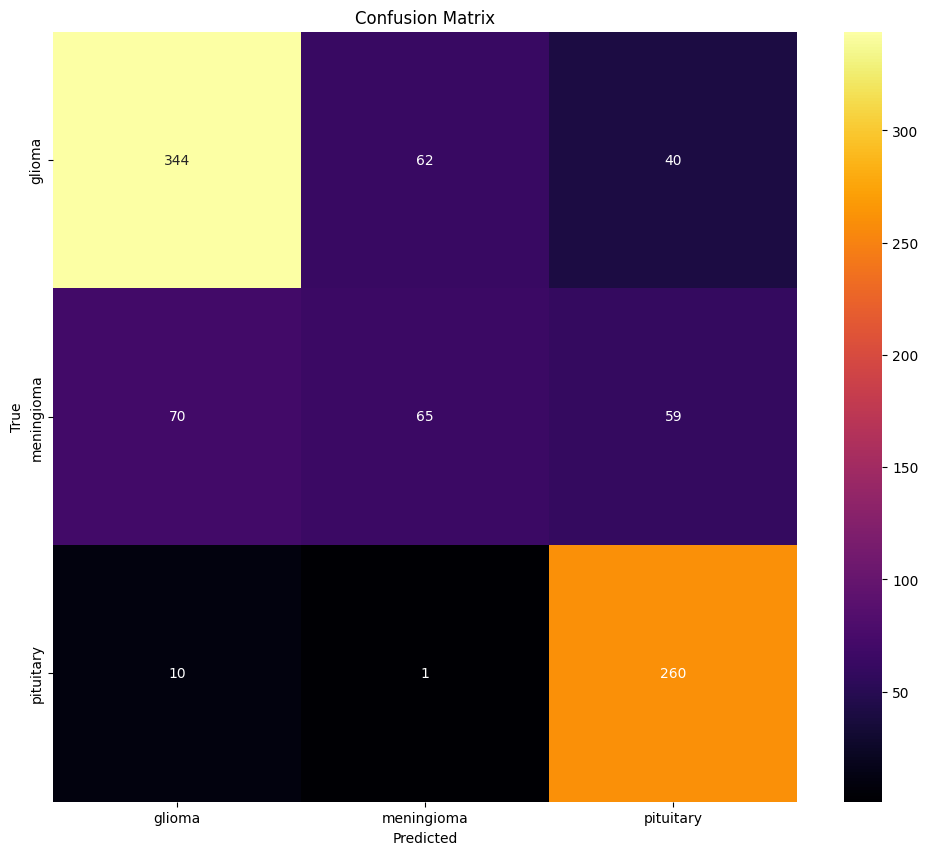

In [ ]:
# Use the best estimator to make predictions on the test set
y_test_pred = random_search.predict(X_test_hog)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_hog, y_test_pred))
print("Test Classification Report:\n", classification_report(y_test_hog, y_test_pred))

# print confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test_hog, y_test_pred)

# Create a larger plot
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='inferno', xticklabels=['glioma', 'meningioma', 'pituitary'], yticklabels=['glioma', 'meningioma', 'pituitary'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


### Feature Extractor 6: HOG + LBP

In [ ]:
def load_data_hog_lbp(images_dir, masks_dir, scales, n_points, method, target_size=(128, 64)):
    X = []
    y = []

    for class_name in os.listdir(images_dir):
        class_image_dir = os.path.join(images_dir, class_name)
        class_mask_dir = os.path.join(masks_dir, class_name)

        if os.path.isdir(class_image_dir) and os.path.isdir(class_mask_dir):
            for image_name in os.listdir(class_image_dir):
                image_path = os.path.join(class_image_dir, image_name)
                mask_name = image_name.replace(".png", "_mask.png")
                mask_path = os.path.join(class_mask_dir, mask_name)

                if os.path.exists(image_path) and os.path.exists(mask_path):
                    # Convert paths to str for cv2.imread
                    image_path = str(image_path)
                    mask_path = str(mask_path)

                    # Read the image and mask
                    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

                    if image is not None and mask is not None:
                        # Resize image and mask to target size
                        image = cv2.resize(image, target_size)
                        mask = cv2.resize(mask, target_size)

                        # Apply the mask to the image
                        masked_image = cv2.bitwise_and(image, image, mask=mask)

                        # Extract HOG features
                        hog_features, hog_image = extract_hog_features(masked_image)

                        # Extract LBP features
                        lbp_features = extract_multiresolution_lbp_features_with_mask(image, mask, scales, n_points, method)

                        # Combine HOG and LBP features
                        combined_features = np.concatenate((hog_features, lbp_features))

                        # Append combined features and label
                        X.append(combined_features)
                        y.append(class_name)

    return np.array(X), np.array(y)

In [ ]:
scales = [(8, 1, 1), (16, 2, 2)]  # Example scales
n_points = 8
method = 'uniform'

In [ ]:
X_train_hl, y_train_hl = load_data_hog_lbp(train_images_dir, train_masks_dir, scales, n_points, method, target_size=(128, 64))
X_val_hl, y_val_hl = load_data_hog_lbp(val_images_dir, val_masks_dir, scales, n_points, method, target_size=(128, 64))
X_test_hl, y_test_hl = load_data_hog_lbp(test_images_dir, test_masks_dir, scales, n_points, method, target_size=(128, 64))

In [ ]:
X_train_hl.shape

(1490, 3808)

In [ ]:

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_hl)
y_val_encoded = label_encoder.transform(y_val_hl)
y_test_encoded = label_encoder.transform(y_test_hl)

# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_hl, y_train_encoded)

    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_hl, y_val_encoded, cv=stratified_kfold, scoring='balanced_accuracy', n_jobs=-1)
    print(f"{name} cross-validated balanced accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_hl)
    test_accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_encoded, y_pred, target_names=label_encoder.classes_))

    # Calculate balanced accuracy on the test set
    balanced_acc = balanced_accuracy_score(y_test_encoded, y_pred)
    print(f'{name} test balanced accuracy: {balanced_acc:.3f}')

    # Confusion matrix function
    def calculate_specificity_per_class(y_true, y_pred):
        labels = np.unique(y_true)  # Get unique classes from true labels
        cm = confusion_matrix(y_true, y_pred, labels=labels)
        specificity_per_class = []
        for i in range(len(cm)):
            tn = sum(sum(cm)) - (sum(cm[i, :]) + sum(cm[:, i]) - cm[i, i])
            fp = sum(cm[:, i]) - cm[i, i]
            specificity = tn / (tn + fp) if (tn + fp) != 0 else 0  # Handle division by zero
            specificity_per_class.append(specificity)
        return specificity_per_class

    # Calculate and print specificity per class
    specificity_per_class = calculate_specificity_per_class(y_test_encoded, y_pred)
    balanced_specificity = np.mean(specificity_per_class)
    print(f'Balanced Specificity: {balanced_specificity:.3f}')


Training and evaluating Logistic Regression pipeline...
Logistic Regression cross-validated balanced accuracy on validation set: 0.874 ± 0.029
Logistic Regression test accuracy: 0.750
Logistic Regression Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.87      0.78      0.83       446
  meningioma       0.52      0.57      0.55       194
   pituitary       0.75      0.82      0.78       271

    accuracy                           0.75       911
   macro avg       0.71      0.73      0.72       911
weighted avg       0.76      0.75      0.75       911

Logistic Regression test balanced accuracy: 0.725
Balanced Specificity: 0.877

Training and evaluating Random Forest pipeline...
Random Forest cross-validated balanced accuracy on validation set: 0.914 ± 0.036
Random Forest test accuracy: 0.846
Random Forest Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.93     

##### Model 2 : Random Forest - HOG + LBP

In [ ]:
from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(n_estimators=1000, random_state=42)
classifier.fit(X_train_hl, y_train_hl)

In [ ]:
# Predict on the validation set
y_val_pred = classifier.predict(X_val_hl)

# Evaluate the classifier on the validation set
val_accuracy = accuracy_score(y_val_hl, y_val_hl)
print(f"Validation Accuracy: {val_accuracy * 100:.2f}%")

In [ ]:
# hyperparameter tuning
X_train_combined = np.vstack((X_train_hl, X_val_hl))

y_train_combined = np.hstack((y_train_hl, y_val_hl))

# Resample the training data using SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_combined, y_train_combined)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 500, 1000, 2000],
    'criterion':['entropy', 'gini'],
    'max_features': ['sqrt', 'log2'],
    'max_depth': [3, 5, 7, 9, 13],
}


# Initialize GridSearchCV
rf = RandomForestClassifier(random_state=42)
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train_resampled, y_train_resampled)




In [ ]:
# Use the best estimator to make predictions on the test set
y_test_pred = random_search.predict(X_test_lbp)

# Evaluate the performance on the test set
print("Test Accuracy:", accuracy_score(y_test_lbp, y_test_pred))
print("Test Classification Report:\n", classification_report(y_test_lbp, y_test_pred))



In [ ]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, GridSearchCV
import glob
import random

def augment_tumor_region(mask, radius):
    structuring_element = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (radius * 2 + 1, radius * 2 + 1))
    augmented_mask = cv2.dilate(mask, structuring_element)
    return augmented_mask

def compute_distance_to_border(roi):
    distance_map = cv2.distanceTransform(roi, cv2.DIST_L2, 3)
    max_distance = np.max(distance_map)
    if max_distance > 0:
        distance_map = distance_map / max_distance
    return distance_map

def split_into_ring_subregions(roi, distance_map, level):
    subregions = []
    for k in range(level + 1):
        num_subregions = 2 ** k
        interval = 1.0 / num_subregions
        for i in range(num_subregions):
            lower_bound = i * interval
            upper_bound = (i + 1) * interval
            subregion_mask = np.logical_and(distance_map >= lower_bound, distance_map < upper_bound)
            subregions.append(subregion_mask)
    return subregions

def extract_patches(image, patch_size=5):
    patches = []
    for y in range(image.shape[0] - patch_size + 1):
        for x in range(image.shape[1] - patch_size + 1):
            patch = image[y:y+patch_size, x:x+patch_size]
            patches.append(patch.flatten())
    return np.array(patches)

def sample_patches_from_images(images, masks, radii, sample_size=100000):
    all_patches = []
    for image, mask in zip(images, masks):
        for radius in radii:
            augmented_mask = augment_tumor_region(mask, radius)
            roi = segment_roi(image, augmented_mask)
            patches = extract_patches(roi)
            all_patches.extend(patches)
    random.shuffle(all_patches)
    return np.array(all_patches[:sample_size])

def construct_dictionary(patches, num_clusters=300):
    kmeans = KMeans(n_clusters=num_clusters, random_state=42).fit(patches)
    return kmeans.cluster_centers_

def create_histogram(patches, dictionary):
    histogram = np.zeros(len(dictionary))
    for patch in patches:
        distances = np.linalg.norm(dictionary - patch, axis=1)
        nearest_word = np.argmin(distances)
        histogram[nearest_word] += 1
    return histogram

def normalize_histogram(histogram):
    return normalize(histogram.reshape(1, -1), norm='l1').flatten()

def load_data(image_paths, mask_paths):
    images = [cv2.imread(image_path, cv2.IMREAD_GRAYSCALE) for image_path in image_paths]
    masks = [cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE) for mask_path in mask_paths]
    labels = [0 if i < len(image_paths) // 3 else 1 if i < 2 * len(image_paths) // 3 else 2 for i in range(len(image_paths))]  # Dummy labels, replace with actual
    return images, masks, labels

def spm_representation(image, mask, dictionary, radii, level):
    final_histogram = []
    for radius in radii:
        augmented_mask = augment_tumor_region(mask, radius)
        distance_map = compute_distance_to_border(augmented_mask)
        subregions = split_into_ring_subregions(augmented_mask, distance_map, level)

        for k in range(level + 1):
            num_subregions = 2 ** k
            weight = 1.0 / (2 ** (level - k))

            for subregion in subregions[:num_subregions]:
                patches = extract_patches_from_subregions(image, [subregion])
                histogram = create_histogram(patches, dictionary)
                normalized_histogram = normalize_histogram(histogram)
                weighted_histogram = weight * normalized_histogram
                final_histogram.extend(weighted_histogram)

            subregions = subregions[num_subregions:]

    return np.array(final_histogram)

def extract_patches_from_subregions(image, subregions, patch_size=5):
    patches = []
    for subregion in subregions:
        subregion_image = cv2.bitwise_and(image, image, mask=subregion.astype(np.uint8))
        subregion_patches = extract_patches(subregion_image, patch_size)
        patches.extend(subregion_patches)
    return np.array(patches)

def segment_roi(image, mask):
    return cv2.bitwise_and(image, image, mask=mask)

def main():
    image_paths = glob.glob('images/*.png')
    mask_paths = glob.glob('masks/*.png')

    images, masks, labels = load_data(image_paths, mask_paths)

    radii = [0, 8, 16, 24, 32]  # Radii for augmentation
    level = 3  # Example level for ring-form subregions

    sampled_patches = sample_patches_from_images(images, masks, radii, sample_size=100000)

    dictionary = construct_dictionary(sampled_patches)

    histograms = []
    for image, mask in zip(images, masks):
        spm_histogram = spm_representation(image, mask, dictionary, radii, level)
        histograms.append(spm_histogram)

    X_train, X_test, y_train, y_test = train_test_split(histograms, labels, test_size=0.2, random_state=42)

    param_grid = {'C': [0.1, 1, 10, 100, 1000]}
    svc = SVC(kernel='precomputed')

    def histogram_intersection_kernel(X, Y):
        return np.minimum(X[:, np.newaxis, :], Y[np.newaxis, :, :]).sum(axis=2)

    K_train = histogram_intersection_kernel(np.array(X_train), np.array(X_train))
    grid = GridSearchCV(svc, param_grid, cv=5)
    grid.fit(K_train, y_train)

    best_C = grid.best_params_['C']
    print(f"Best C parameter: {best_C}")

    svc = SVC(C=best_C, kernel='precomputed')
    svc.fit(K_train, y_train)

    K_test = histogram_intersection_kernel(np.array(X_test), np.array(X_train))
    y_pred = svc.predict(K_test)

    print(classification_report(y_test, y_pred))

if __name__ == '__main__':
    main()


##### Feature Extractor 7: ResNet34

In [ ]:
import os
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np

class ResNet34FeatureExtractorWithMask:
    def __init__(self, device):
        self.device = device
        self.model = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
        self.model = nn.Sequential(*list(self.model.children())[:-1])
        self.model = self.model.to(self.device)
        self.model.eval()
        self.preprocess_image = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])
        self.preprocess_mask = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
        ])
    def extract_features(self, image_path, mask_path):
        image = Image.open(image_path).convert('RGB')
        mask = Image.open(mask_path).convert('L')  # Assuming mask is grayscale

        # Preprocess the image and mask
        image = self.preprocess_image(image)
        mask = self.preprocess_mask(mask)

        # Apply mask to image
        image = image * mask

        image = image.unsqueeze(0).to(self.device)
        with torch.no_grad():
            features = self.model(image)
        return features.squeeze().cpu().numpy()



In [ ]:
def load_resnet_features(images_dir, masks_dir, device):
    X = []
    y = []

    feature_extractor = ResNet34FeatureExtractorWithMask(device)

    for class_name in os.listdir(images_dir):
        class_image_dir = os.path.join(images_dir, class_name)
        class_mask_dir = os.path.join(masks_dir, class_name)

        if os.path.isdir(class_image_dir) and os.path.isdir(class_mask_dir):
            for image_name in os.listdir(class_image_dir):
                image_path = os.path.join(class_image_dir, image_name)
                mask_path = os.path.join(class_mask_dir, image_name.replace(".png", "_mask.png"))

                if os.path.exists(image_path) and os.path.exists(mask_path):
                    # Extract ResNet-34 features
                    try:
                        features = feature_extractor.extract_features(image_path, mask_path)
                        # Append features and label
                        X.append(features)
                        y.append(class_name)
                    except Exception as e:
                        print(f"Error processing {image_path} and {mask_path}: {e}")
                        continue

    return np.array(X), np.array(y)



In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [ ]:
X_train_res, y_train_res = load_resnet_features(train_images_dir, train_masks_dir, device)
X_val_res, y_val_res = load_resnet_features(val_images_dir, val_masks_dir, device)
X_test_res, y_test_res = load_resnet_features(test_images_dir, test_masks_dir, device)

In [ ]:
X_train_res.shape

(1490, 512)

In [ ]:

# Encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train_res)
y_val_encoded = label_encoder.transform(y_val_res)
y_test_encoded = label_encoder.transform(y_test_res)

# Train, validate, and test each pipeline
for name, pipeline in pipelines:
    print(f"\nTraining and evaluating {name} pipeline...")

    # Train the model on the training set
    pipeline.fit(X_train_res, y_train_encoded)

    # Calculate training balanced accuracy
    y_train_pred = pipeline.predict(X_train_res)
    train_balanced_acc = balanced_accuracy_score(y_train_encoded, y_train_pred)
    print(f"{name} training balanced accuracy: {train_balanced_acc:.3f}")

    # Cross-validation for validation using validation set
    cv_scores = cross_val_score(pipeline, X_val_res, y_val_encoded, cv=stratified_kfold, scoring='balanced_accuracy', n_jobs=-1)
    print(f"{name} cross-validated balanced accuracy on validation set: {np.mean(cv_scores):.3f} ± {np.std(cv_scores):.3f}")

    # Evaluate the model on the test set
    y_pred = pipeline.predict(X_test_res)
    test_accuracy = accuracy_score(y_test_encoded, y_pred)
    print(f"{name} test accuracy: {test_accuracy:.3f}")
    print(f"{name} Classification Report on test set:\n", classification_report(y_test_encoded, y_pred, target_names=label_encoder.classes_))

    # Calculate balanced accuracy on the test set
    balanced_acc = balanced_accuracy_score(y_test_encoded, y_pred)
    print(f'{name} test balanced accuracy: {balanced_acc:.2f}')


Training and evaluating Logistic Regression pipeline...


/usr/local/lib/python3.10/dist-packages/scipy/optimize/_linesearch.py:314: LineSearchWarning: The line search algorithm did not converge
  warn('The line search algorithm did not converge', LineSearchWarning)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/optimize.py:203: UserWarning: Line Search failed
  warnings.warn("Line Search failed")


Logistic Regression training balanced accuracy: 0.921
Logistic Regression cross-validated balanced accuracy on validation set: 0.908 ± 0.006
Logistic Regression test accuracy: 0.838
Logistic Regression Classification Report on test set:
               precision    recall  f1-score   support

      glioma       0.94      0.85      0.89       446
  meningioma       0.74      0.81      0.77       194
   pituitary       0.77      0.83      0.80       271

    accuracy                           0.84       911
   macro avg       0.82      0.83      0.82       911
weighted avg       0.85      0.84      0.84       911

Logistic Regression test balanced accuracy: 0.83

Training and evaluating Random Forest pipeline...
Random Forest training balanced accuracy: 0.999
Random Forest cross-validated balanced accuracy on validation set: 0.857 ± 0.012
Random Forest test accuracy: 0.810
Random Forest Classification Report on test set:
               precision    recall  f1-score   support

      glioma

# 4. Deep Learning
4.1 Brain Tumor Segmentation


4.2 Brain Tumor Classification

-- Pipeline
1. Segmentation model - train and evaluate the segmentation model to accurately segregate the tumor regions

2. Extracted tumor regions - use the extracted tumor regions as inputs for the classification model

3. Classification Model on the segmented tumor regions into glioma, meningioma and pituitary

### 4.1 Tumor Segmentation

### Parameters and Configurations

In [ ]:
pip install torch warmup-scheduler

In [ ]:
pip install segmentation_models_pytorch

In [ ]:
pip install pytorch_lightning

In [ ]:
import torch
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import ModelCheckpoint
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import cv2
import torch
import pytorch_lightning as pl
import segmentation_models_pytorch as smp
from torch.optim.lr_scheduler import CosineAnnealingLR
import torch.nn as nn
from torch.nn import ConvTranspose2d
from torch.nn import Conv2d
from torch.nn import MaxPool2d
from torch.nn import Module
from torch.nn import ModuleList
from torch.nn import ReLU
from torchvision.transforms import CenterCrop
from torch.nn import functional as F
import torch.optim as optim
import sys
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torchvision import models
from torch.optim.lr_scheduler import CosineAnnealingLR
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.cuda.amp import GradScaler, autocast
import matplotlib.pyplot as plt
import torch
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.cuda.amp import GradScaler, autocast
import time
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, CosineAnnealingLR, ReduceLROnPlateau
from torch.optim import Adam

In [ ]:
class LinearWarmupScheduler(torch.optim.lr_scheduler._LRScheduler):
    def __init__(self, optimizer, warmup_steps, final_lr, last_epoch=-1):
        self.warmup_steps = warmup_steps
        self.final_lr = final_lr
        super(LinearWarmupScheduler, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        if self.last_epoch < self.warmup_steps:
            return [self.final_lr * (self.last_epoch + 1) / self.warmup_steps for _ in self.optimizer.param_groups]
        return [base_lr for base_lr in self.base_lrs]


In [ ]:
# Define constants
NUM_CHANNELS = 1  # For grayscale images
NUM_CLASSES = 2  # Including background
INIT_LR = 1e-4
WEIGHT_DECAY = 1e-2  # Adjust weight decay as needed


DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
import torch

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")

Using device: cuda


#### 4.1.1 Preparing the Dataset

In [ ]:
# datapath for the subsequent sessions
project_directory  = Path('/content/drive/My Drive/MRI_data/patient_split_image_with_masks/patient_split_image_with_masks/')

In [ ]:
train_images_dir = project_directory / 'train/images'
train_masks_dir = project_directory / 'train/masks'
val_images_dir = project_directory / 'val/images'
val_masks_dir = project_directory / 'val/masks'
test_images_dir = project_directory / 'test/images'
test_masks_dir = project_directory / 'test/masks'

In [ ]:

def count_image_and_mask_files_in_folders(base_dir):
    counts = {}
    for subdir in ['train', 'val', 'test']:
        for data_type in ['images', 'masks']:
            for class_folder in ['meningioma', 'glioma', 'pituitary']:
                folder_path = os.path.join(base_dir, subdir, data_type, class_folder)
                try:
                    if os.path.exists(folder_path):
                        file_count = len([f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))])
                        counts[f'{subdir}/{data_type}/{class_folder}'] = file_count
                    else:
                        counts[f'{subdir}/{data_type}/{class_folder}'] = 0
                except Exception as e:
                    print(f"Error accessing {folder_path}: {e}")
                    counts[f'{subdir}/{data_type}/{class_folder}'] = 0
    return counts

# Count the number of image and mask files in each folder
file_counts = count_image_and_mask_files_in_folders(project_directory)

# Print the counts
for folder, count in file_counts.items():
    print(f'{folder}: {count} files')

train/images/meningioma: 414 files
train/images/glioma: 614 files
train/images/pituitary: 462 files
train/masks/meningioma: 414 files
train/masks/glioma: 614 files
train/masks/pituitary: 462 files
val/images/meningioma: 100 files
val/images/glioma: 366 files
val/images/pituitary: 197 files
val/masks/meningioma: 100 files
val/masks/glioma: 366 files
val/masks/pituitary: 197 files
test/images/meningioma: 194 files
test/images/glioma: 446 files
test/images/pituitary: 271 files
test/masks/meningioma: 194 files
test/masks/glioma: 446 files
test/masks/pituitary: 271 files


In [ ]:
import torch
import numpy as np
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from PIL import Image
import cv2
import os

import cv2
import numpy as np
from PIL import Image

class HistogramEqualization(object):
    def __call__(self, img):
        img = np.array(img)
        img = cv2.equalizeHist(img)
        return Image.fromarray(img)

class AdaptiveHistogramEqualization(object):
    def __init__(self, clip_limit=2.0, tile_grid_size=(8, 8)):
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size

    def __call__(self, img):
        img = np.array(img)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        img = clahe.apply(img)
        return Image.fromarray(img)

import os
import torch
from torch.utils.data import Dataset
from PIL import Image
import numpy as np

class SegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_paths = []
        self.mask_paths = []
        self.transform = transform

        for subdir in os.listdir(image_dir):
            image_subdir = os.path.join(image_dir, subdir)
            mask_subdir = os.path.join(mask_dir, subdir)
            for filename in os.listdir(image_subdir):
                image_path = os.path.join(image_subdir, filename)
                mask_filename = os.path.splitext(filename)[0] + '_mask.png'
                mask_path = os.path.join(mask_subdir, mask_filename)
                if os.path.exists(mask_path):
                    self.image_paths.append(image_path)
                    self.mask_paths.append(mask_path)
                else:
                    print(f"Mask file {mask_path} not found for image {image_path}")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("L")  # Ensure image is single-channel
        mask = Image.open(self.mask_paths[idx]).convert("L")  # Ensure mask is single-channel

        if self.transform:
            # Apply the same transform to both image and mask
            seed = np.random.randint(2147483647)  # Get a random seed for reproducibility
            torch.manual_seed(seed)
            image = self.transform(image)
            torch.manual_seed(seed)
            mask = self.transform(mask)

        # Convert the mask to FloatTensor and normalize to [0, 1]
        mask = torch.tensor(np.array(mask) / 255.0).float()

        return image, mask


def compute_mean_std(dataset):
    loader = DataLoader(dataset, batch_size=8, shuffle=False, num_workers=2)
    mean = torch.zeros(1)
    std = torch.zeros(1)
    n_samples = 0

    for images, _ in loader:
        n_samples += images.size(0)
        images = images.view(images.size(0), images.size(1), -1)
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)

    mean /= n_samples
    std /= n_samples
    return mean, std

# Define data transformation for mean and std calculation
transform_compute = transforms.Compose([
    transforms.Resize((256, 256), transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
])

# Create the dataset with the transform
train_dataset = SegmentationDataset(train_images_dir, train_masks_dir, transform=transform_compute)

# Compute mean and std
mean, std = compute_mean_std(train_dataset)

print(f"Mean: {mean}")
print(f"Std: {std}")

# Now, you can use the computed mean and std for your actual training transformations
transform_train = transforms.Compose([

    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(90),
    transforms.Resize((256, 256), transforms.InterpolationMode.BICUBIC),

    transforms.RandomResizedCrop((256, 256), scale=(0.8, 1.0)),

    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    AdaptiveHistogramEqualization(),  # Adding Adaptive Histogram Equalization

    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)  # Normalize using calculated mean and std
])
transform_val = transforms.Compose([
    transforms.Resize((256, 256), transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)  # Normalize using calculated mean and std
])

transform_test = transforms.Compose([
    transforms.Resize((256, 256), transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)  # Normalize using calculated mean and std
])



# Create datasets
train_dataset = SegmentationDataset(train_images_dir, train_masks_dir, transform=transform_train)
val_dataset = SegmentationDataset(val_images_dir, val_masks_dir, transform=transform_val )
test_dataset = SegmentationDataset(test_images_dir, test_masks_dir, transform=transform_test)


# Print dataset lengths
print(f"[INFO] found {len(train_dataset)} images in the training set...")
print(f"[INFO] found {len(val_dataset)} images in the validation set...")
print(f"[INFO] found {len(test_dataset)} images in the test set...")

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=11)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=11)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=11)


dataloaders = {
    'train': train_loader,
    'val': val_loader,
    'test': test_loader
}

Mean: tensor([0.1598])
Std: tensor([0.1632])
[INFO] found 1490 images in the training set...
[INFO] found 663 images in the validation set...
[INFO] found 911 images in the test set...


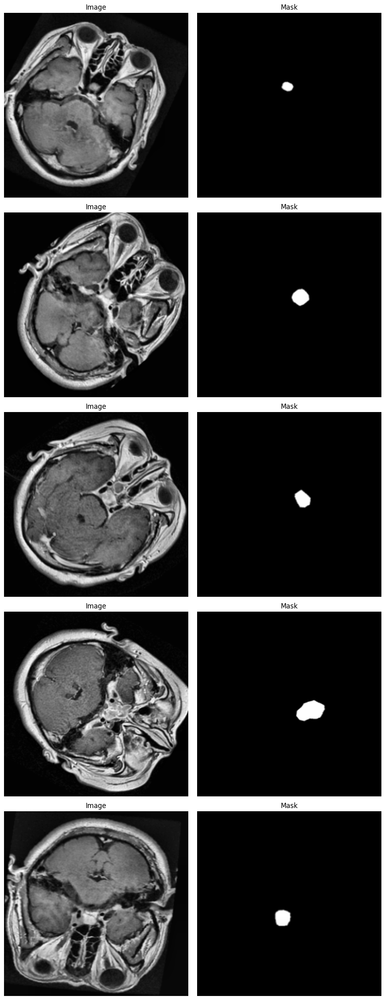

In [ ]:
# Example DataLoader
from torch.utils.data import DataLoader


# Function to visualize dataset samples
def visualize_dataset_samples(dataset, num_samples=5):
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 5 * num_samples))

    for i in range(num_samples):
        image, mask = dataset[i]

        # Convert tensors to numpy arrays for visualization
        image_np = image.numpy().transpose((1, 2, 0))  # Convert to NumPy array and transpose to HWC
        mask_np = mask.numpy().squeeze()  # Convert mask to NumPy array and squeeze

        axes[i, 0].imshow(image_np, cmap='gray')
        axes[i, 0].set_title('Image')
        axes[i, 0].axis('off')

        axes[i, 1].imshow(mask_np, cmap='gray')
        axes[i, 1].set_title('Mask')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualize some samples from the training dataset
visualize_dataset_samples(train_dataset)

## Loss Metrics

In [ ]:
# Dice Loss definition
class DiceLoss(nn.Module):
    def __init__(self, smooth=1):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, inputs, targets):
        inputs = torch.sigmoid(inputs)
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + self.smooth) / (inputs.sum() + targets.sum() + self.smooth)
        return 1 - dice

import torch

class JaccardLoss(torch.nn.Module):
    def __init__(self):
        super(JaccardLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        """
        Calculates the Jaccard Loss (IoU loss) between the predicted inputs and the target labels.

        Args:
            inputs (torch.Tensor): Predicted inputs.
            targets (torch.Tensor): Target labels.
            smooth (float, optional): Smoothing factor to avoid division by zero. Defaults to 1.

        Returns:
            torch.Tensor: Jaccard Loss value.
        """
        # Apply sigmoid activation to the inputs to convert logits to probabilities
        inputs = inputs.sigmoid()

        # Flatten the tensors to 1D
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        # Calculate the intersection and union
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection

        # Calculate the Jaccard coefficient
        jaccard = (intersection + smooth) / (union + smooth)

        # Return the Jaccard loss
        return 1 - jaccard

import torch

class DiceMetric(torch.nn.Module):
    def __init__(self):
        super(DiceMetric, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        """
        Calculate the Dice coefficient between two tensors.

        Args:
            inputs (torch.Tensor): Predicted masks with logits (before sigmoid).
            targets (torch.Tensor): Ground truth binary masks.
            smooth (float): Smoothing factor to prevent division by zero.

        Returns:
            float: Dice coefficient.
        """
        # Apply sigmoid to convert logits to probabilities if needed
        inputs = inputs.sigmoid()

        # Flatten the tensors for comparison
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        # Calculate the intersection and the sums
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)

        return dice



In [ ]:


class SegModel(pl.LightningModule):
    def __init__(self, arch, encoder_name, in_channels, out_classes, **kwargs):
        super(SegModel, self).__init__()
        self.model = smp.create_model(
            arch, encoder_name=encoder_name, in_channels=in_channels, classes=out_classes, **kwargs
        )

        # Preprocessing parameters for image normalization
        params = smp.encoders.get_preprocessing_params(encoder_name)
        self.register_buffer("std", torch.tensor(params["std"]).view(1, 3, 1, 1))
        self.register_buffer("mean", torch.tensor(params["mean"]).view(1, 3, 1, 1))

        # Loss and metrics
        self.dice_loss = DiceLoss()
        self.dice_metric = DiceMetric()
        self.iou = JaccardLoss()

    def forward(self, image):
        # Normalize image
        image = (image - self.mean) / self.std
        mask = self.model(image)
        return mask

  ## it was initially ADAM
    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(), lr=1e-5, momentum=0.8, nesterov=True)
        scheduler = CosineAnnealingLR(optimizer, T_max=50, eta_min=1e-6)
        return [optimizer], [scheduler]

    def training_step(self, batch, batch_idx):
        images, masks = batch
        preds = self(images)
        loss = self.dice_loss(preds, masks)
        self.log("train_loss", loss, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, masks = batch
        preds = self(images)
        loss = self.dice_loss(preds, masks)
        dice_score = self.dice_metric(preds, masks)
        iou_score = self.iou(preds, masks)
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_dice", dice_score, prog_bar=True)
        self.log("val_iou", iou_score, prog_bar=True)

    def test_step(self, batch, batch_idx):
        images, masks = batch
        preds = self(images)
        loss = self.dice_loss(preds, masks)
        dice_score = self.dice_metric(preds, masks)
        iou_score = self.iou(preds, masks)
        self.log("test_loss", loss, prog_bar=True)
        self.log("test_dice", dice_score, prog_bar=True)
        self.log("test_iou", iou_score, prog_bar=True)


### UNET + ResNet Model
1. Block module: reusable building block consisting of several layers used repeatably through the U-network. The encoder and decoder consists of repeated blocks. The blocks contain a series of convolutional layers, activations (like ReLU). the blocks encapsulate the repeated structures

2. Encoder
3. Decoder

In [ ]:
import torch

if torch.cuda.is_available():
    cuda_device = torch.device("cuda")
    print(f"CUDA Device: {torch.cuda.get_device_name(cuda_device)}")
    print(f"CUDA Capability: {torch.cuda.get_device_capability(cuda_device)}")
else:
    print("CUDA is not available.")


CUDA Device: NVIDIA A100-SXM4-40GB
CUDA Capability: (8, 0)


In [ ]:
resunet_model = SegModel("Unet", 'resnet34', encoder_weights='imagenet', in_channels=3, out_classes=1)
# Callbacks
logger = CSVLogger("/content", name="resunet_model")
early_stop_callback = pl.callbacks.EarlyStopping(monitor='val_loss', patience=15, verbose=True, mode='min')
resunet_model_checkpoint = ModelCheckpoint(
    dirpath='/content/checkpoints/',
    filename='Unet_{epoch}-{val_loss:.2f}',
    monitor='val_loss',
    mode='min',
    verbose=True
)
# Trainer
trainer = pl.Trainer(
    logger=logger,
    callbacks=[early_stop_callback, resunet_model_checkpoint],
    max_epochs=60  # Specify the maximum number of epochs
)

# Assuming `train_dataloader` and `val_dataloader` are defined
# Train the model
trainer.fit(resunet_model, train_loader, val_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type        | Params | Mode 
----------------------------------------------------
0 | model       | Unet        | 24.4 M | train
1 | dice_loss   | DiceLoss    | 0      | train
2 | dice_metric | DiceMetric  | 0      | train
3 | iou         | JaccardLoss | 0      | train
----------------------------------------------------
24.4 M    Trainable params
0         Non-trainable params
24.4 M    Total params
97.745    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 1.006
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 187: 'val_loss' reached 1.00640 (best 1.00640), saving model to '/content/checkpoints/Unet_epoch=0-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.006
INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 374: 'val_loss' reached 1.00590 (best 1.00590), saving model to '/content/checkpoints/Unet_epoch=1-val_loss=1.01-v1.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.006
INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 561: 'val_loss' reached 1.00553 (best 1.00553), saving model to '/content/checkpoints/Unet_epoch=2-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.005
INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 748: 'val_loss' reached 1.00497 (best 1.00497), saving model to '/content/checkpoints/Unet_epoch=3-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.004
INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 935: 'val_loss' reached 1.00448 (best 1.00448), saving model to '/content/checkpoints/Unet_epoch=4-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.004
INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 1122: 'val_loss' reached 1.00377 (best 1.00377), saving model to '/content/checkpoints/Unet_epoch=5-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.003
INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 1309: 'val_loss' reached 1.00302 (best 1.00302), saving model to '/content/checkpoints/Unet_epoch=6-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.003
INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 1496: 'val_loss' reached 1.00258 (best 1.00258), saving model to '/content/checkpoints/Unet_epoch=7-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.002
INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 1683: 'val_loss' reached 1.00150 (best 1.00150), saving model to '/content/checkpoints/Unet_epoch=8-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.001
INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 1870: 'val_loss' reached 1.00101 (best 1.00101), saving model to '/content/checkpoints/Unet_epoch=9-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.000
INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 2057: 'val_loss' reached 1.00023 (best 1.00023), saving model to '/content/checkpoints/Unet_epoch=10-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.999
INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 2244: 'val_loss' reached 0.99945 (best 0.99945), saving model to '/content/checkpoints/Unet_epoch=11-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.998
INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 2431: 'val_loss' reached 0.99815 (best 0.99815), saving model to '/content/checkpoints/Unet_epoch=12-val_loss=1.00-v1.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.997
INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 2618: 'val_loss' reached 0.99727 (best 0.99727), saving model to '/content/checkpoints/Unet_epoch=13-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.996
INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 2805: 'val_loss' reached 0.99625 (best 0.99625), saving model to '/content/checkpoints/Unet_epoch=14-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.995
INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 2992: 'val_loss' reached 0.99492 (best 0.99492), saving model to '/content/checkpoints/Unet_epoch=15-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.994
INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 3179: 'val_loss' reached 0.99372 (best 0.99372), saving model to '/content/checkpoints/Unet_epoch=16-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.993
INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 3366: 'val_loss' reached 0.99289 (best 0.99289), saving model to '/content/checkpoints/Unet_epoch=17-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.992
INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 3553: 'val_loss' reached 0.99153 (best 0.99153), saving model to '/content/checkpoints/Unet_epoch=18-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.989
INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 3740: 'val_loss' reached 0.98945 (best 0.98945), saving model to '/content/checkpoints/Unet_epoch=19-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.989
INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 3927: 'val_loss' reached 0.98866 (best 0.98866), saving model to '/content/checkpoints/Unet_epoch=20-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.988
INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 4114: 'val_loss' reached 0.98818 (best 0.98818), saving model to '/content/checkpoints/Unet_epoch=21-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.987
INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 4301: 'val_loss' reached 0.98679 (best 0.98679), saving model to '/content/checkpoints/Unet_epoch=22-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.986
INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 4488: 'val_loss' reached 0.98602 (best 0.98602), saving model to '/content/checkpoints/Unet_epoch=23-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.983
INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 4675: 'val_loss' reached 0.98331 (best 0.98331), saving model to '/content/checkpoints/Unet_epoch=24-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.983
INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 4862: 'val_loss' reached 0.98304 (best 0.98304), saving model to '/content/checkpoints/Unet_epoch=25-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.982
INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 5049: 'val_loss' reached 0.98191 (best 0.98191), saving model to '/content/checkpoints/Unet_epoch=26-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.981
INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 5236: 'val_loss' reached 0.98130 (best 0.98130), saving model to '/content/checkpoints/Unet_epoch=27-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.981
INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 5423: 'val_loss' reached 0.98119 (best 0.98119), saving model to '/content/checkpoints/Unet_epoch=28-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.980
INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 5610: 'val_loss' reached 0.98038 (best 0.98038), saving model to '/content/checkpoints/Unet_epoch=29-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.979
INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 5797: 'val_loss' reached 0.97864 (best 0.97864), saving model to '/content/checkpoints/Unet_epoch=30-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.978
INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 5984: 'val_loss' reached 0.97841 (best 0.97841), saving model to '/content/checkpoints/Unet_epoch=31-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.977
INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 6171: 'val_loss' reached 0.97663 (best 0.97663), saving model to '/content/checkpoints/Unet_epoch=32-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.976
INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 6358: 'val_loss' reached 0.97601 (best 0.97601), saving model to '/content/checkpoints/Unet_epoch=33-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 6545: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.976
INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 6732: 'val_loss' reached 0.97599 (best 0.97599), saving model to '/content/checkpoints/Unet_epoch=35-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 6919: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 7106: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.974
INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 7293: 'val_loss' reached 0.97388 (best 0.97388), saving model to '/content/checkpoints/Unet_epoch=38-val_loss=0.97.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 7480: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 0.958
INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 7667: 'val_loss' reached 0.95770 (best 0.95770), saving model to '/content/checkpoints/Unet_epoch=40-val_loss=0.96.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 41, global step 7854: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 42, global step 8041: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 43, global step 8228: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 44, global step 8415: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.096 >= min_delta = 0.0. New best score: 0.862
INFO:pytorch_lightning.utilities.rank_zero:Epoch 45, global step 8602: 'val_loss' reached 0.86167 (best 0.86167), saving model to '/content/checkpoints/Unet_epoch=45-val_loss=0.86.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 46, global step 8789: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 47, global step 8976: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 48, global step 9163: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 49, global step 9350: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 50, global step 9537: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 51, global step 9724: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 52, global step 9911: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 53, global step 10098: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 54, global step 10285: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 55, global step 10472: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 56, global step 10659: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 57, global step 10846: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 58, global step 11033: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 59, global step 11220: 'val_loss' was not in top 1
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=60` reached.


In [ ]:
# when i use NAG
resunet_model = SegModel("Unet", 'resnet34', encoder_weights='imagenet', in_channels=3, out_classes=1)
# Callbacks
logger = CSVLogger("/content", name="resunet_model")
early_stop_callback = pl.callbacks.EarlyStopping(monitor='val_loss', patience=15, verbose=True, mode='min')
resunet_model_checkpoint = ModelCheckpoint(
    dirpath='/content/checkpoints/',
    filename='Unet_{epoch}-{val_loss:.2f}',
    monitor='val_loss',
    mode='min',
    verbose=True
)
# Trainer
trainer = pl.Trainer(
    logger=logger,
    callbacks=[early_stop_callback, resunet_model_checkpoint],
    max_epochs=60  # Specify the maximum number of epochs
)

# Assuming `train_dataloader` and `val_dataloader` are defined
# Train the model
trainer.fit(resunet_model, train_loader, val_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type        | Params | Mode 
----------------------------------------------------
0 | model       | Unet        | 24.4 M | train
1 | dice_loss   | DiceLoss    | 0      | train
2 | dice_metric | DiceMetric  | 0      | train
3 | iou         | JaccardLoss | 0      | train
----------------------------------------------------
24.4 M    Trainable params
0         Non-trainable params
24.4 M    Total params
97.745    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 1.007
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 187: 'val_loss' reached 1.00716 (best 1.00716), saving model to '/content/checkpoints/Unet_epoch=0-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 374: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 561: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 748: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 935: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 1122: 'val_loss' was not in top 1
Exception ignored in: 

In [ ]:
# run validation dataset
valid_metrics = trainer.validate(resunet_model, dataloaders=val_loader, verbose=False)
print(valid_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

[{'val_loss': 0.9884001612663269, 'val_dice': 0.011599956080317497, 'val_iou': 0.9921609163284302}]


In [ ]:
# run test dataset
test_metrics = trainer.test(resunet_model, dataloaders=test_loader, verbose=False)
print(test_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'test_loss': 1.0029820203781128, 'test_dice': -0.0029819603078067303, 'test_iou': 1.000529170036316}]


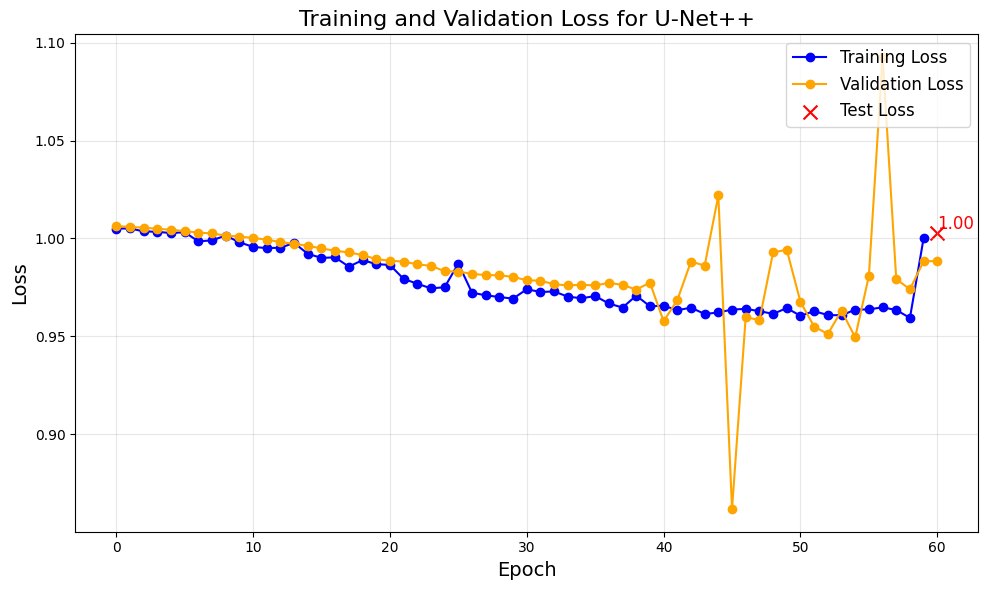

In [ ]:
# plot training and validation loss
metrics = pd.read_csv('/content/resunet_model/version_5/metrics.csv')
test_epoch = metrics['epoch'].max()
test_loss = metrics['test_loss'].max()

val_metrics = metrics[metrics['val_loss'].notna()]
train_metrics = metrics[metrics['train_loss'].notna()].drop_duplicates(subset='epoch',keep='last')

# Extract relevant columns
epochs = val_metrics['epoch']
train_loss = train_metrics['train_loss']
val_loss = val_metrics['val_loss']

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(epochs[:len(train_loss)], train_loss, label='Training Loss', color='blue', marker='o')
plt.plot(epochs[:len(val_loss)], val_loss, label='Validation Loss', color='orange', marker='o')
plt.scatter(test_epoch, test_loss, color='red', marker='x', s=100, label='Test Loss')
plt.text(test_epoch, test_loss, f'{test_loss:.2f}', color='red', fontsize=12, verticalalignment='bottom')
# Adding labels and title
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss for U-Net++', fontsize=16)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()

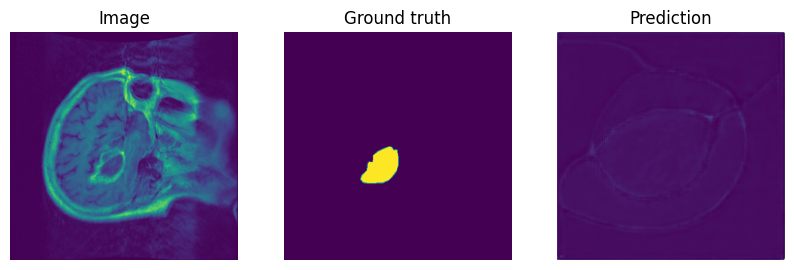

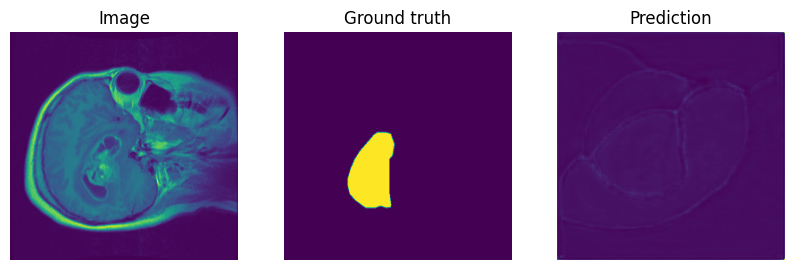

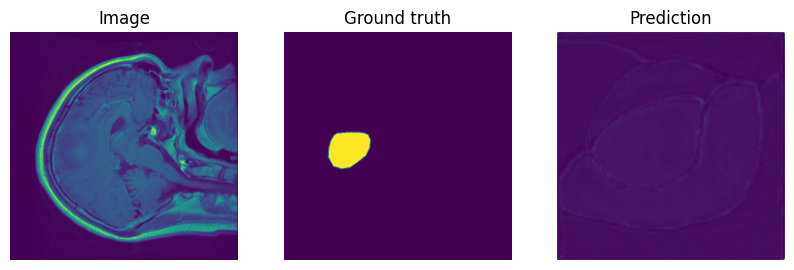

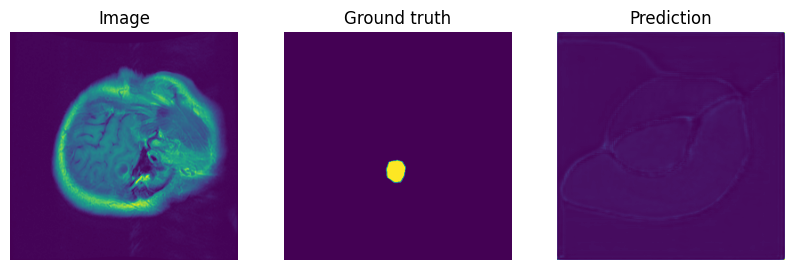

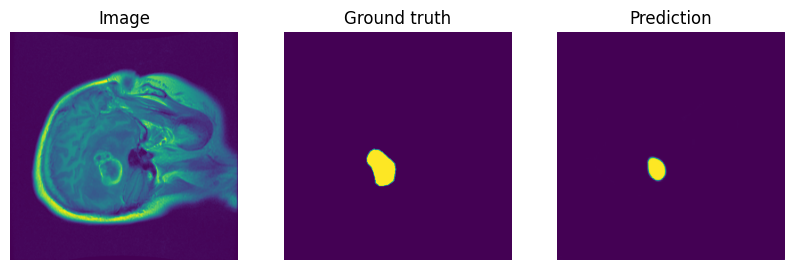

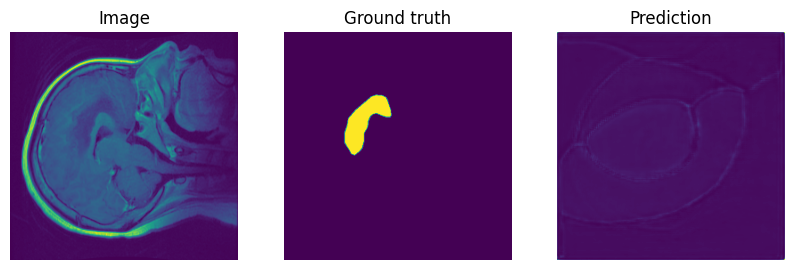

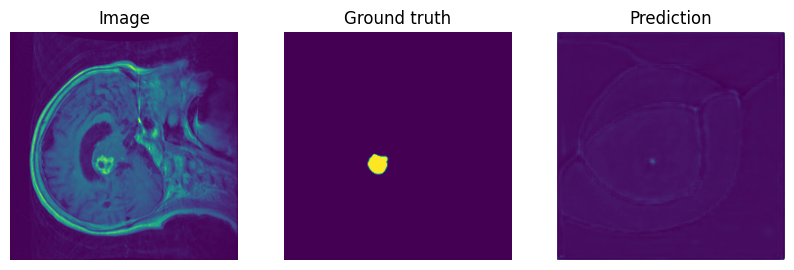

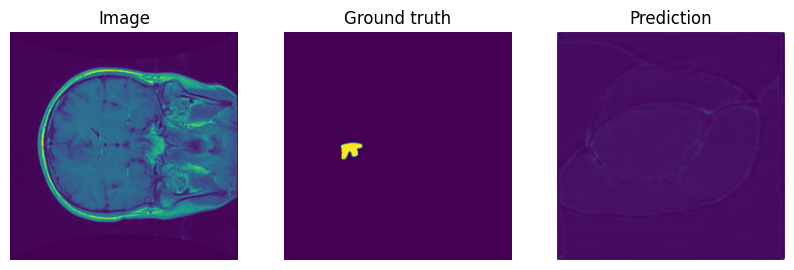

In [ ]:
batch = next(iter(test_loader))
with torch.no_grad():
    resunet_model.eval()
    logits = resunet_model(batch[0])
pr_masks = logits.sigmoid()

for image, gt_mask, pr_mask in zip(batch[0], batch[1], pr_masks):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image.numpy().transpose(1, 2, 0))  # convert CHW -> HWC
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.numpy().squeeze())
    plt.title("Ground truth")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pr_mask.numpy().squeeze())
    plt.title("Prediction")
    plt.axis("off")

    plt.show()

### UNET (RESNext Encoder)

In [ ]:
nextunet_model = SegModel("Unet", "resnext50_32x4d", in_channels=3, out_classes=1)
logger = CSVLogger("/content", name="resnext50")
early_stop_callback = pl.callbacks.EarlyStopping(monitor='val_loss', patience=15, verbose=True, mode='min')
nextunet_model_checkpoint = ModelCheckpoint(
    dirpath='/content/checkpoints/',
    filename='resnext50_32x4d_{epoch}-{val_loss:.2f}',
    monitor='val_loss',
    mode='min',
    verbose=True
)
# Trainer
trainer = pl.Trainer(
    logger=logger,
    callbacks=[early_stop_callback, nextunet_model_checkpoint],
    max_epochs=50  # Specify the maximum number of epochs
)
# Train the model
trainer.fit(nextunet_model, train_loader, val_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:652: Checkpoint directory /content/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type        | Params | Mode 
----------------------------------------------------
0 | model       | Unet        | 32.0 M | train
1 | dice_loss   | DiceLoss    | 0      | train
2 | dice_metric | DiceMetric  | 0      | train
3 | iou         | JaccardLoss | 0      | train
----------------------------------------------------
32.0 M    Trainable params
0         Non-trainable params
32.0 M    Total params
127.972   Total estimated model params siz

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 1.006
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 187: 'val_loss' reached 1.00559 (best 1.00559), saving model to '/content/checkpoints/resnext50_32x4d_epoch=0-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.005
INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 374: 'val_loss' reached 1.00503 (best 1.00503), saving model to '/content/checkpoints/resnext50_32x4d_epoch=1-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.004
INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 561: 'val_loss' reached 1.00400 (best 1.00400), saving model to '/content/checkpoints/resnext50_32x4d_epoch=2-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.004
INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 748: 'val_loss' reached 1.00353 (best 1.00353), saving model to '/content/checkpoints/resnext50_32x4d_epoch=3-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.003
INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 935: 'val_loss' reached 1.00325 (best 1.00325), saving model to '/content/checkpoints/resnext50_32x4d_epoch=4-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.002
INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 1122: 'val_loss' reached 1.00153 (best 1.00153), saving model to '/content/checkpoints/resnext50_32x4d_epoch=5-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.000
INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 1309: 'val_loss' reached 1.00031 (best 1.00031), saving model to '/content/checkpoints/resnext50_32x4d_epoch=6-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.000
INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 1496: 'val_loss' reached 0.99967 (best 0.99967), saving model to '/content/checkpoints/resnext50_32x4d_epoch=7-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 1683: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.998
INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 1870: 'val_loss' reached 0.99811 (best 0.99811), saving model to '/content/checkpoints/resnext50_32x4d_epoch=9-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.996
INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 2057: 'val_loss' reached 0.99643 (best 0.99643), saving model to '/content/checkpoints/resnext50_32x4d_epoch=10-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.996
INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 2244: 'val_loss' reached 0.99585 (best 0.99585), saving model to '/content/checkpoints/resnext50_32x4d_epoch=11-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.993
INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 2431: 'val_loss' reached 0.99319 (best 0.99319), saving model to '/content/checkpoints/resnext50_32x4d_epoch=12-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.992
INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 2618: 'val_loss' reached 0.99200 (best 0.99200), saving model to '/content/checkpoints/resnext50_32x4d_epoch=13-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.991
INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 2805: 'val_loss' reached 0.99118 (best 0.99118), saving model to '/content/checkpoints/resnext50_32x4d_epoch=14-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.989
INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 2992: 'val_loss' reached 0.98913 (best 0.98913), saving model to '/content/checkpoints/resnext50_32x4d_epoch=15-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.988
INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 3179: 'val_loss' reached 0.98765 (best 0.98765), saving model to '/content/checkpoints/resnext50_32x4d_epoch=16-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.987
INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 3366: 'val_loss' reached 0.98687 (best 0.98687), saving model to '/content/checkpoints/resnext50_32x4d_epoch=17-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.986
INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 3553: 'val_loss' reached 0.98632 (best 0.98632), saving model to '/content/checkpoints/resnext50_32x4d_epoch=18-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.986
INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 3740: 'val_loss' reached 0.98576 (best 0.98576), saving model to '/content/checkpoints/resnext50_32x4d_epoch=19-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.984
INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 3927: 'val_loss' reached 0.98410 (best 0.98410), saving model to '/content/checkpoints/resnext50_32x4d_epoch=20-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.982
INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 4114: 'val_loss' reached 0.98216 (best 0.98216), saving model to '/content/checkpoints/resnext50_32x4d_epoch=21-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.981
INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 4301: 'val_loss' reached 0.98134 (best 0.98134), saving model to '/content/checkpoints/resnext50_32x4d_epoch=22-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.980
INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 4488: 'val_loss' reached 0.97971 (best 0.97971), saving model to '/content/checkpoints/resnext50_32x4d_epoch=23-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.979
INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 4675: 'val_loss' reached 0.97883 (best 0.97883), saving model to '/content/checkpoints/resnext50_32x4d_epoch=24-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.977
INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 4862: 'val_loss' reached 0.97748 (best 0.97748), saving model to '/content/checkpoints/resnext50_32x4d_epoch=25-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 5049: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 5236: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.977
INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 5423: 'val_loss' reached 0.97704 (best 0.97704), saving model to '/content/checkpoints/resnext50_32x4d_epoch=28-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 5610: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 5797: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.040 >= min_delta = 0.0. New best score: 0.937
INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 5984: 'val_loss' reached 0.93662 (best 0.93662), saving model to '/content/checkpoints/resnext50_32x4d_epoch=31-val_loss=0.94.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 6171: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 6358: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 6545: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.928
INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 6732: 'val_loss' reached 0.92782 (best 0.92782), saving model to '/content/checkpoints/resnext50_32x4d_epoch=35-val_loss=0.93.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 6919: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 7106: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 7293: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 7480: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 7667: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 41, global step 7854: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 42, global step 8041: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 43, global step 8228: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 44, global step 8415: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 45, global step 8602: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 46, global step 8789: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 47, global step 8976: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 48, global step 9163: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 49, global step 9350: 'val_loss' was not in top 1
INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


In [ ]:
# run validation dataset
valid_metrics = trainer.validate(nextunet_model, dataloaders=val_loader, verbose=False)
print(valid_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

[{'val_loss': 0.9892515540122986, 'val_dice': 0.010748599655926228, 'val_iou': 0.993935763835907}]


In [ ]:
# run validation dataset
test_metrics = trainer.test(nextunet_model, dataloaders=val_loader, verbose=False)
print(valid_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'val_loss': 0.9892515540122986, 'val_dice': 0.010748599655926228, 'val_iou': 0.993935763835907}]


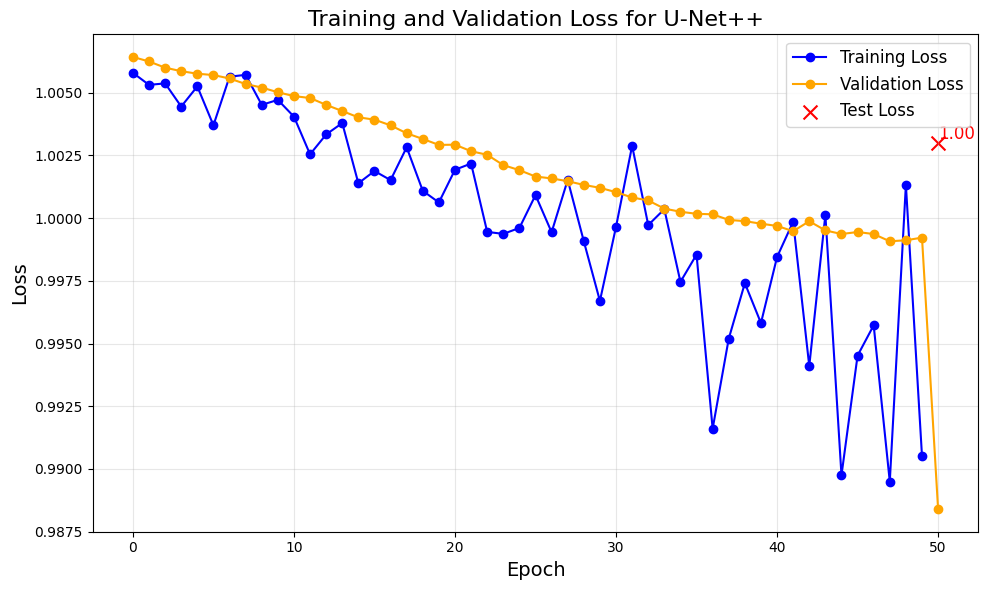

In [ ]:
# plot training and validation loss
metrics = pd.read_csv('/content/resnext50/version_2/metrics.csv')
test_epoch = metrics['epoch'].max()
test_loss = metrics['test_loss'].max()

val_metrics = metrics[metrics['val_loss'].notna()]
train_metrics = metrics[metrics['train_loss'].notna()].drop_duplicates(subset='epoch',keep='last')

# Extract relevant columns
epochs = val_metrics['epoch']
train_loss = train_metrics['train_loss']
val_loss = val_metrics['val_loss']

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(epochs[:len(train_loss)], train_loss, label='Training Loss', color='blue', marker='o')
plt.plot(epochs[:len(val_loss)], val_loss, label='Validation Loss', color='orange', marker='o')
plt.scatter(test_epoch, test_loss, color='red', marker='x', s=100, label='Test Loss')
plt.text(test_epoch, test_loss, f'{test_loss:.2f}', color='red', fontsize=12, verticalalignment='bottom')
# Adding labels and title
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss for resnext50 encoding UNET', fontsize=16)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()

In [ ]:
# run validation dataset
valid_metrics = trainer.validate(nextunet_model, dataloaders=val_loader, verbose=False)
print(valid_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

[{'val_loss': 0.9892515540122986, 'val_dice': 0.010748600587248802, 'val_iou': 0.9939358234405518}]


In [ ]:
# run test dataset
test_metrics = trainer.test(nextunet_model, dataloaders=test_loader, verbose=False)
print(test_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'test_loss': 0.9764986634254456, 'test_dice': 0.023501316085457802, 'test_iou': 0.9896166920661926}]


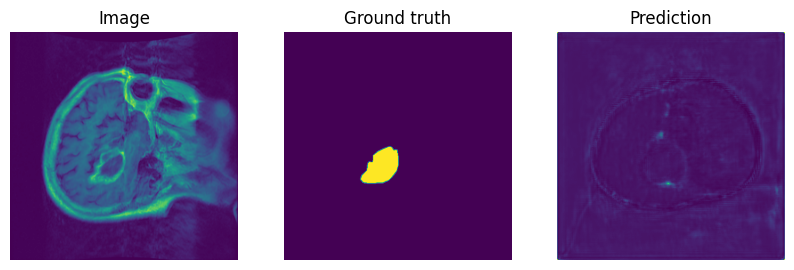

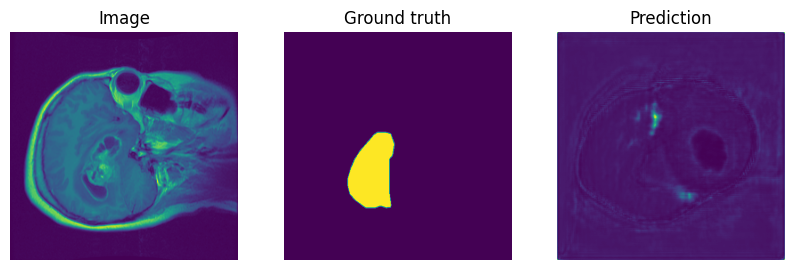

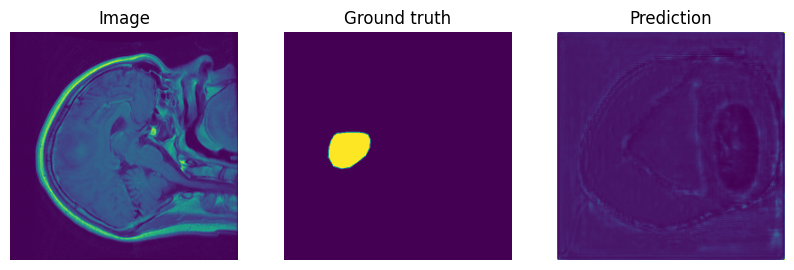

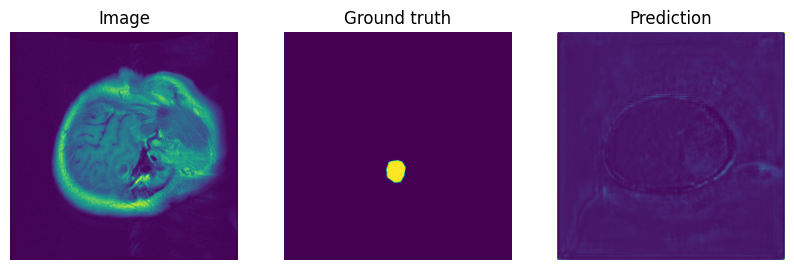

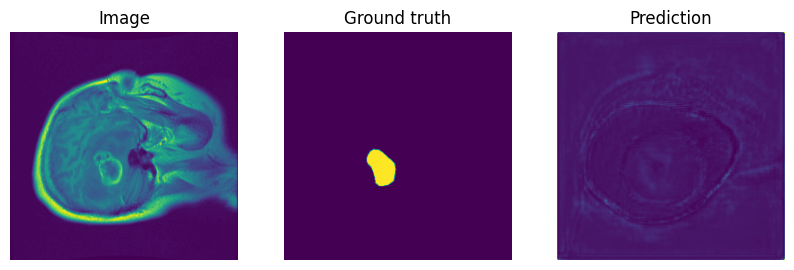

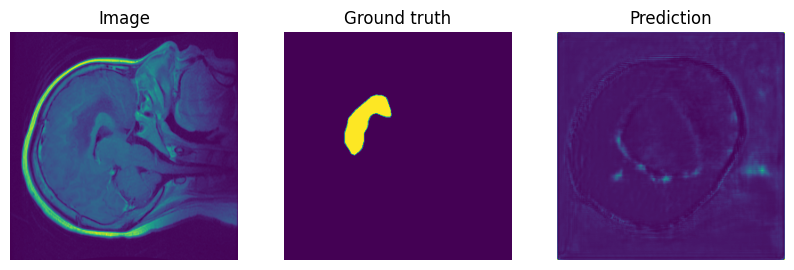

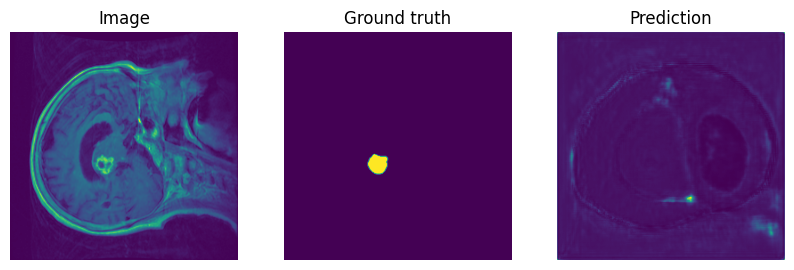

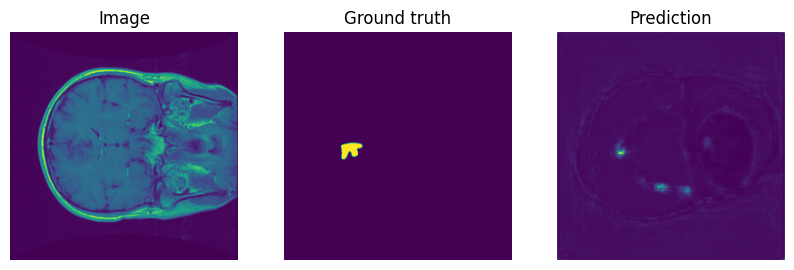

In [ ]:
batch = next(iter(test_loader))
with torch.no_grad():
    nextunet_model.eval()
    logits = nextunet_model(batch[0])
pr_masks = logits.sigmoid()

for image, gt_mask, pr_mask in zip(batch[0], batch[1], pr_masks):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image.numpy().transpose(1, 2, 0))  # convert CHW -> HWC
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.numpy().squeeze())
    plt.title("Ground truth")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pr_mask.numpy().squeeze())
    plt.title("Prediction")
    plt.axis("off")

    plt.show()

### UNET++ + EfficientNet

In [ ]:
unet_eff_model = SegModel("Unetplusplus", "efficientnet-b0", in_channels=3, out_classes=1)

# Callbacks
logger = CSVLogger("/content", name="UnetPlusPlusEfficientNetB0")
early_stop_callback = pl.callbacks.EarlyStopping(monitor='val_loss', patience=15, verbose=True, mode='min')
unetpp_eff_model_checkpoint = ModelCheckpoint(dirpath='/content/checkpoints/',filename='Unet_eff++{epoch}-{val_loss:.2f}', monitor='val_loss', mode='min', verbose=True)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth


100%|██████████| 20.4M/20.4M [00:00<00:00, 523MB/s]


In [ ]:
trainer = pl.Trainer(
    devices=1,
    max_epochs=100,
    logger=logger,
    callbacks= [early_stop_callback, unetpp_eff_model_checkpoint],
    log_every_n_steps=25
)

trainer.fit(
    unet_eff_model,
    train_dataloaders=train_loader,
    val_dataloaders=val_loader,

)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:652: Checkpoint directory /content/checkpoints exists and is not empty.
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type         | Params | Mode 
-----------------------------------------------------
0 | model       | UnetPlusPlus | 6.6 M  | train
1 | dice_loss   | DiceLoss     | 0      | train
2 | dice_metric | DiceMetric   | 0      | train
3 | iou         | JaccardLoss  | 0      | train
-----------------------------------------------------
6.6 M     Trainable params
0         Non-trainable params
6.6 M     Total params
26.278    Total estimated model par

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 1.006
INFO:pytorch_lightning.utilities.rank_zero:Epoch 0, global step 187: 'val_loss' reached 1.00631 (best 1.00631), saving model to '/content/checkpoints/Unet_eff++epoch=0-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.006
INFO:pytorch_lightning.utilities.rank_zero:Epoch 1, global step 374: 'val_loss' reached 1.00586 (best 1.00586), saving model to '/content/checkpoints/Unet_eff++epoch=1-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.006
INFO:pytorch_lightning.utilities.rank_zero:Epoch 2, global step 561: 'val_loss' reached 1.00552 (best 1.00552), saving model to '/content/checkpoints/Unet_eff++epoch=2-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.005
INFO:pytorch_lightning.utilities.rank_zero:Epoch 3, global step 748: 'val_loss' reached 1.00511 (best 1.00511), saving model to '/content/checkpoints/Unet_eff++epoch=3-val_loss=1.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.005
INFO:pytorch_lightning.utilities.rank_zero:Epoch 4, global step 935: 'val_loss' reached 1.00467 (best 1.00467), saving model to '/content/checkpoints/Unet_eff++epoch=4-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.004
INFO:pytorch_lightning.utilities.rank_zero:Epoch 5, global step 1122: 'val_loss' reached 1.00428 (best 1.00428), saving model to '/content/checkpoints/Unet_eff++epoch=5-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.004
INFO:pytorch_lightning.utilities.rank_zero:Epoch 6, global step 1309: 'val_loss' reached 1.00388 (best 1.00388), saving model to '/content/checkpoints/Unet_eff++epoch=6-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.003
INFO:pytorch_lightning.utilities.rank_zero:Epoch 7, global step 1496: 'val_loss' reached 1.00339 (best 1.00339), saving model to '/content/checkpoints/Unet_eff++epoch=7-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.003
INFO:pytorch_lightning.utilities.rank_zero:Epoch 8, global step 1683: 'val_loss' reached 1.00298 (best 1.00298), saving model to '/content/checkpoints/Unet_eff++epoch=8-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.003
INFO:pytorch_lightning.utilities.rank_zero:Epoch 9, global step 1870: 'val_loss' reached 1.00256 (best 1.00256), saving model to '/content/checkpoints/Unet_eff++epoch=9-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.002
INFO:pytorch_lightning.utilities.rank_zero:Epoch 10, global step 2057: 'val_loss' reached 1.00199 (best 1.00199), saving model to '/content/checkpoints/Unet_eff++epoch=10-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.002
INFO:pytorch_lightning.utilities.rank_zero:Epoch 11, global step 2244: 'val_loss' reached 1.00157 (best 1.00157), saving model to '/content/checkpoints/Unet_eff++epoch=11-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.001
INFO:pytorch_lightning.utilities.rank_zero:Epoch 12, global step 2431: 'val_loss' reached 1.00105 (best 1.00105), saving model to '/content/checkpoints/Unet_eff++epoch=12-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.000
INFO:pytorch_lightning.utilities.rank_zero:Epoch 13, global step 2618: 'val_loss' reached 1.00025 (best 1.00025), saving model to '/content/checkpoints/Unet_eff++epoch=13-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.000
INFO:pytorch_lightning.utilities.rank_zero:Epoch 14, global step 2805: 'val_loss' reached 0.99978 (best 0.99978), saving model to '/content/checkpoints/Unet_eff++epoch=14-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.999
INFO:pytorch_lightning.utilities.rank_zero:Epoch 15, global step 2992: 'val_loss' reached 0.99882 (best 0.99882), saving model to '/content/checkpoints/Unet_eff++epoch=15-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 16, global step 3179: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.998
INFO:pytorch_lightning.utilities.rank_zero:Epoch 17, global step 3366: 'val_loss' reached 0.99774 (best 0.99774), saving model to '/content/checkpoints/Unet_eff++epoch=17-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 18, global step 3553: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.996
INFO:pytorch_lightning.utilities.rank_zero:Epoch 19, global step 3740: 'val_loss' reached 0.99622 (best 0.99622), saving model to '/content/checkpoints/Unet_eff++epoch=19-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.996
INFO:pytorch_lightning.utilities.rank_zero:Epoch 20, global step 3927: 'val_loss' reached 0.99621 (best 0.99621), saving model to '/content/checkpoints/Unet_eff++epoch=20-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.996
INFO:pytorch_lightning.utilities.rank_zero:Epoch 21, global step 4114: 'val_loss' reached 0.99563 (best 0.99563), saving model to '/content/checkpoints/Unet_eff++epoch=21-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.995
INFO:pytorch_lightning.utilities.rank_zero:Epoch 22, global step 4301: 'val_loss' reached 0.99515 (best 0.99515), saving model to '/content/checkpoints/Unet_eff++epoch=22-val_loss=1.00.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.995
INFO:pytorch_lightning.utilities.rank_zero:Epoch 23, global step 4488: 'val_loss' reached 0.99464 (best 0.99464), saving model to '/content/checkpoints/Unet_eff++epoch=23-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.993
INFO:pytorch_lightning.utilities.rank_zero:Epoch 24, global step 4675: 'val_loss' reached 0.99297 (best 0.99297), saving model to '/content/checkpoints/Unet_eff++epoch=24-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.992
INFO:pytorch_lightning.utilities.rank_zero:Epoch 25, global step 4862: 'val_loss' reached 0.99246 (best 0.99246), saving model to '/content/checkpoints/Unet_eff++epoch=25-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.992
INFO:pytorch_lightning.utilities.rank_zero:Epoch 26, global step 5049: 'val_loss' reached 0.99238 (best 0.99238), saving model to '/content/checkpoints/Unet_eff++epoch=26-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.991
INFO:pytorch_lightning.utilities.rank_zero:Epoch 27, global step 5236: 'val_loss' reached 0.99127 (best 0.99127), saving model to '/content/checkpoints/Unet_eff++epoch=27-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 28, global step 5423: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.991
INFO:pytorch_lightning.utilities.rank_zero:Epoch 29, global step 5610: 'val_loss' reached 0.99093 (best 0.99093), saving model to '/content/checkpoints/Unet_eff++epoch=29-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.991
INFO:pytorch_lightning.utilities.rank_zero:Epoch 30, global step 5797: 'val_loss' reached 0.99059 (best 0.99059), saving model to '/content/checkpoints/Unet_eff++epoch=30-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.990
INFO:pytorch_lightning.utilities.rank_zero:Epoch 31, global step 5984: 'val_loss' reached 0.99011 (best 0.99011), saving model to '/content/checkpoints/Unet_eff++epoch=31-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 32, global step 6171: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 33, global step 6358: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.989
INFO:pytorch_lightning.utilities.rank_zero:Epoch 34, global step 6545: 'val_loss' reached 0.98885 (best 0.98885), saving model to '/content/checkpoints/Unet_eff++epoch=34-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 35, global step 6732: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.988
INFO:pytorch_lightning.utilities.rank_zero:Epoch 36, global step 6919: 'val_loss' reached 0.98831 (best 0.98831), saving model to '/content/checkpoints/Unet_eff++epoch=36-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.988
INFO:pytorch_lightning.utilities.rank_zero:Epoch 37, global step 7106: 'val_loss' reached 0.98816 (best 0.98816), saving model to '/content/checkpoints/Unet_eff++epoch=37-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.988
INFO:pytorch_lightning.utilities.rank_zero:Epoch 38, global step 7293: 'val_loss' reached 0.98773 (best 0.98773), saving model to '/content/checkpoints/Unet_eff++epoch=38-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.987
INFO:pytorch_lightning.utilities.rank_zero:Epoch 39, global step 7480: 'val_loss' reached 0.98712 (best 0.98712), saving model to '/content/checkpoints/Unet_eff++epoch=39-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 40, global step 7667: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.987
INFO:pytorch_lightning.utilities.rank_zero:Epoch 41, global step 7854: 'val_loss' reached 0.98703 (best 0.98703), saving model to '/content/checkpoints/Unet_eff++epoch=41-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 42, global step 8041: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.987
INFO:pytorch_lightning.utilities.rank_zero:Epoch 43, global step 8228: 'val_loss' reached 0.98688 (best 0.98688), saving model to '/content/checkpoints/Unet_eff++epoch=43-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.986
INFO:pytorch_lightning.utilities.rank_zero:Epoch 44, global step 8415: 'val_loss' reached 0.98631 (best 0.98631), saving model to '/content/checkpoints/Unet_eff++epoch=44-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 45, global step 8602: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 46, global step 8789: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 47, global step 8976: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 48, global step 9163: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.986
INFO:pytorch_lightning.utilities.rank_zero:Epoch 49, global step 9350: 'val_loss' reached 0.98580 (best 0.98580), saving model to '/content/checkpoints/Unet_eff++epoch=49-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 50, global step 9537: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.986
INFO:pytorch_lightning.utilities.rank_zero:Epoch 51, global step 9724: 'val_loss' reached 0.98563 (best 0.98563), saving model to '/content/checkpoints/Unet_eff++epoch=51-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.985
INFO:pytorch_lightning.utilities.rank_zero:Epoch 52, global step 9911: 'val_loss' reached 0.98515 (best 0.98515), saving model to '/content/checkpoints/Unet_eff++epoch=52-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 53, global step 10098: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.985
INFO:pytorch_lightning.utilities.rank_zero:Epoch 54, global step 10285: 'val_loss' reached 0.98512 (best 0.98512), saving model to '/content/checkpoints/Unet_eff++epoch=54-val_loss=0.99.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 55, global step 10472: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.984
INFO:pytorch_lightning.utilities.rank_zero:Epoch 56, global step 10659: 'val_loss' reached 0.98445 (best 0.98445), saving model to '/content/checkpoints/Unet_eff++epoch=56-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 57, global step 10846: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 58, global step 11033: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 59, global step 11220: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 60, global step 11407: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.983
INFO:pytorch_lightning.utilities.rank_zero:Epoch 61, global step 11594: 'val_loss' reached 0.98348 (best 0.98348), saving model to '/content/checkpoints/Unet_eff++epoch=61-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.983
INFO:pytorch_lightning.utilities.rank_zero:Epoch 62, global step 11781: 'val_loss' reached 0.98279 (best 0.98279), saving model to '/content/checkpoints/Unet_eff++epoch=62-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 63, global step 11968: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 64, global step 12155: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.983
INFO:pytorch_lightning.utilities.rank_zero:Epoch 65, global step 12342: 'val_loss' reached 0.98256 (best 0.98256), saving model to '/content/checkpoints/Unet_eff++epoch=65-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 66, global step 12529: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.982
INFO:pytorch_lightning.utilities.rank_zero:Epoch 67, global step 12716: 'val_loss' reached 0.98233 (best 0.98233), saving model to '/content/checkpoints/Unet_eff++epoch=67-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 68, global step 12903: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.980
INFO:pytorch_lightning.utilities.rank_zero:Epoch 69, global step 13090: 'val_loss' reached 0.98022 (best 0.98022), saving model to '/content/checkpoints/Unet_eff++epoch=69-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.979
INFO:pytorch_lightning.utilities.rank_zero:Epoch 70, global step 13277: 'val_loss' reached 0.97857 (best 0.97857), saving model to '/content/checkpoints/Unet_eff++epoch=70-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 71, global step 13464: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 72, global step 13651: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.978
INFO:pytorch_lightning.utilities.rank_zero:Epoch 73, global step 13838: 'val_loss' reached 0.97772 (best 0.97772), saving model to '/content/checkpoints/Unet_eff++epoch=73-val_loss=0.98.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 74, global step 14025: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.967
INFO:pytorch_lightning.utilities.rank_zero:Epoch 75, global step 14212: 'val_loss' reached 0.96689 (best 0.96689), saving model to '/content/checkpoints/Unet_eff++epoch=75-val_loss=0.97.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 76, global step 14399: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 77, global step 14586: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.960 >= min_delta = 0.0. New best score: 0.007
INFO:pytorch_lightning.utilities.rank_zero:Epoch 78, global step 14773: 'val_loss' reached 0.00738 (best 0.00738), saving model to '/content/checkpoints/Unet_eff++epoch=78-val_loss=0.01.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 79, global step 14960: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 80, global step 15147: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 81, global step 15334: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 82, global step 15521: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 83, global step 15708: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 84, global step 15895: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 85, global step 16082: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 86, global step 16269: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 87, global step 16456: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 88, global step 16643: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 89, global step 16830: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 90, global step 17017: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 91, global step 17204: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:Epoch 92, global step 17391: 'val_loss' was not in top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 15 records. Best score: 0.007. Signaling Trainer to stop.
INFO:pytorch_lightning.utilities.rank_zero:Epoch 93, global step 17578: 'val_loss' was not in top 1


In [ ]:
# run validation dataset
valid_metrics = trainer.validate(unet_eff_model, dataloaders=val_loader, verbose=False)
print(valid_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

[{'val_loss': 1.0084271430969238, 'val_dice': -0.008427110500633717, 'val_iou': 1.0041667222976685}]


In [ ]:
valid_metrics = trainer.test(unet_eff_model, dataloaders=val_loader, verbose=False)
print(valid_metrics)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'test_loss': 1.0084271430969238, 'test_dice': -0.008427110500633717, 'test_iou': 1.0041667222976685}]


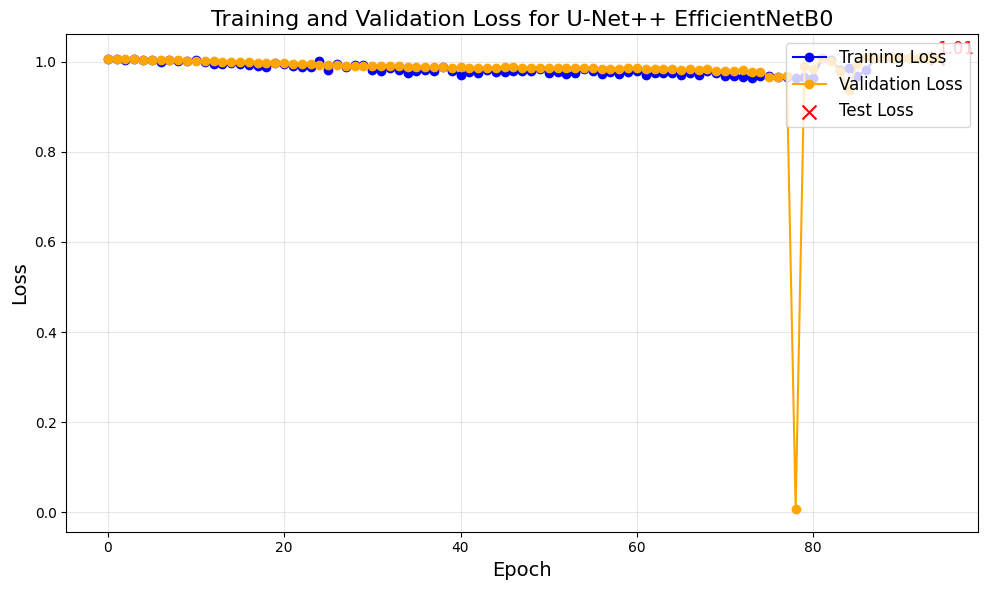

In [ ]:
# plot training and validation loss
metrics = pd.read_csv('/content/UnetPlusPlusEfficientNetB0/version_0/metrics.csv')
# Extract relevant columns
test_epoch = metrics['epoch'].max()
test_loss = metrics['test_loss'].max()

val_metrics = metrics[metrics['val_loss'].notna()]
train_metrics = metrics[metrics['train_loss'].notna()].drop_duplicates(subset='epoch',keep='last')

# Extract relevant columns
epochs = val_metrics['epoch']
train_loss = train_metrics['train_loss']
val_loss = val_metrics['val_loss']

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(epochs[:len(train_loss)], train_loss, label='Training Loss', color='blue', marker='o')
plt.plot(epochs[:len(val_loss)], val_loss, label='Validation Loss', color='orange', marker='o')
plt.scatter(test_epoch, test_loss, color='red', marker='x', s=100, label='Test Loss')
plt.text(test_epoch, test_loss, f'{test_loss:.2f}', color='red', fontsize=12, verticalalignment='bottom')
# Adding labels and title
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss for U-Net++ EfficientNetB0', fontsize=16)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()

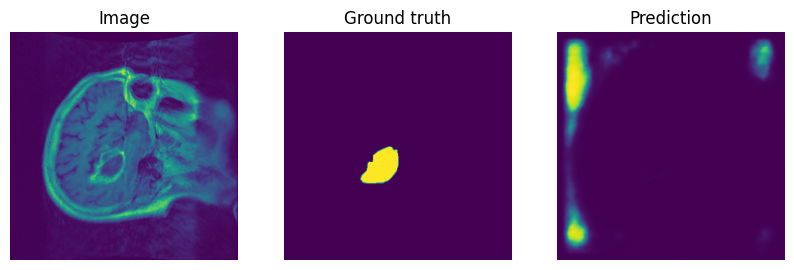

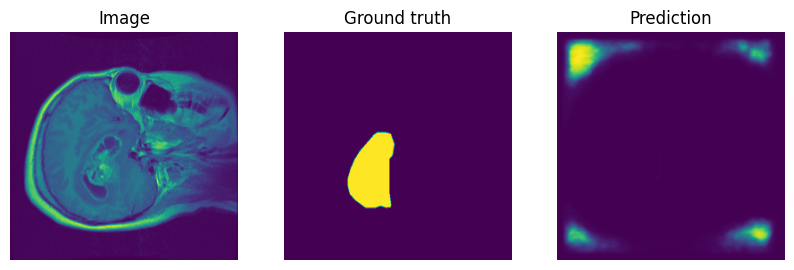

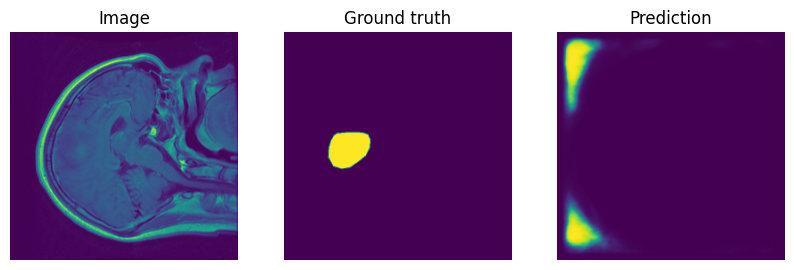

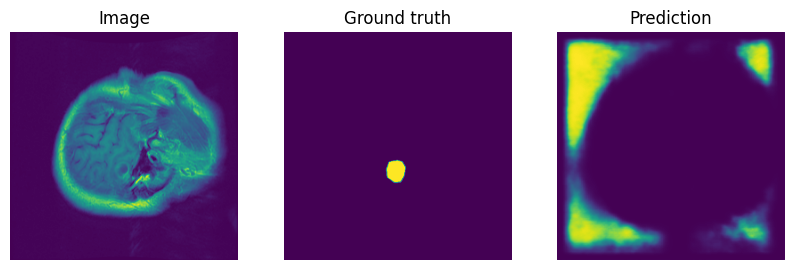

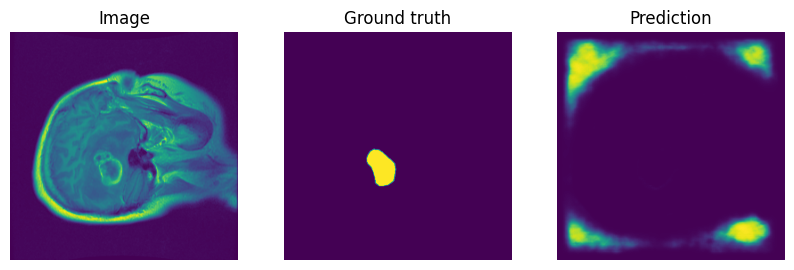

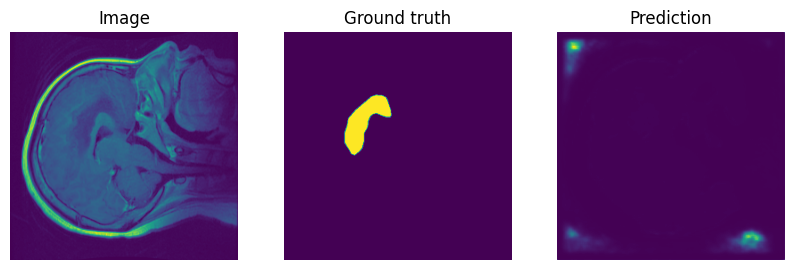

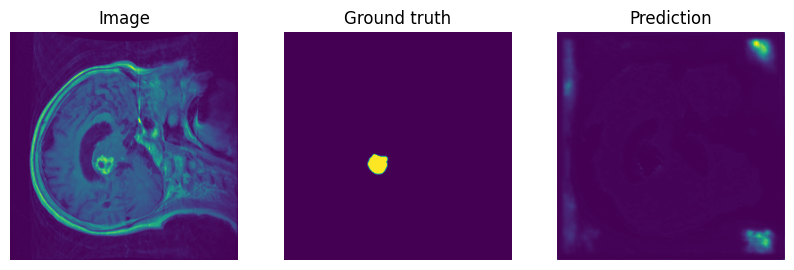

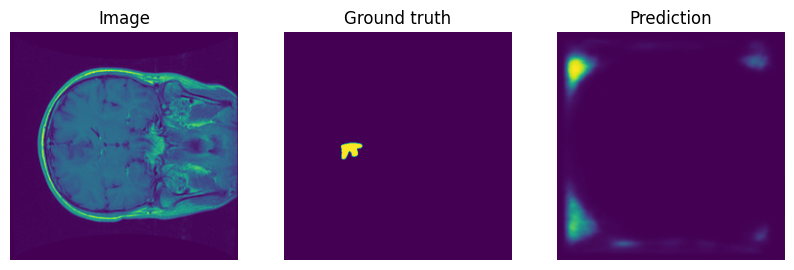

In [ ]:
batch = next(iter(test_loader))
with torch.no_grad():
    nextunet_model.eval()
    logits = unet_eff_model(batch[0])
pr_masks = logits.sigmoid()

for image, gt_mask, pr_mask in zip(batch[0], batch[1], pr_masks):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image.numpy().transpose(1, 2, 0))  # convert CHW -> HWC
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(gt_mask.numpy().squeeze())
    plt.title("Ground truth")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pr_mask.numpy().squeeze())
    plt.title("Prediction")
    plt.axis("off")

    plt.show()

In [ ]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, inputs, targets):
        inputs = torch.sigmoid(inputs)
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + self.smooth) / (inputs.sum() + targets.sum() + self.smooth)
        return 1 - dice


In [ ]:
# Define constants
INIT_LR = 1e-4
WEIGHT_DECAY = 1e-4
NUM_CLASSES = 1
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
EPOCHS = 50

# Initialize the model
model = TransUnet(num_classes=NUM_CLASSES).to(DEVICE)
criterion = nn.BCEWithLogitsLoss(smooth=1)

# Define the optimizer
optimizer = optim.AdamW(model.parameters(), lr=INIT_LR, weight_decay=WEIGHT_DECAY)

# Define the warm-up scheduler
warmup_steps = 1000
base_lr = 0.001
cosine_scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2)
warmup_scheduler = GradualWarmupScheduler(optimizer, multiplier=base_lr/INIT_LR, total_epoch=warmup_steps, after_scheduler=cosine_scheduler)


In [ ]:
import time
import torch
import torch.nn as nn
import torch.optim as optim
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
from warmup_scheduler import GradualWarmupScheduler
from tqdm import tqdm
from torchvision import transforms

# Function to save a checkpoint
def save_checkpoint(net, optimizer, scheduler, epoch, train_losses, val_losses, train_accuracies, val_accuracies, file_path='checkpoint.pth'):
    checkpoint = {
        'model_state_dict': net.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'epoch': epoch,
        'train_losses': train_losses,
        'val_losses': val_losses,
        'train_accuracies': train_accuracies,
        'val_accuracies': val_accuracies
    }
    torch.save(checkpoint, file_path)
    print(f"Checkpoint saved at {file_path}")

# Function to load a checkpoint
def load_checkpoint(net, optimizer, scheduler, file_path='checkpoint.pth'):
    checkpoint = torch.load(file_path)
    net.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    epoch = checkpoint['epoch']
    train_losses = checkpoint['train_losses']
    val_losses = checkpoint['val_losses']
    train_accuracies = checkpoint['train_accuracies']
    val_accuracies = checkpoint['val_accuracies']
    print(f"Checkpoint loaded from {file_path} (epoch {epoch})")
    return epoch, train_losses, val_losses, train_accuracies, val_accuracies

# Dice Loss definition
class DiceLoss(nn.Module):
    def __init__(self, smooth=1):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, inputs, targets):
        inputs = torch.sigmoid(inputs)
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + self.smooth) / (inputs.sum() + targets.sum() + self.smooth)
        return 1 - dice

def train_one_epoch(net, dataloader, optimizer, criterion, device, scaler, accumulation_steps=4):
    net.train()
    loss_sum = 0.0
    correct = 0
    total = 0
    optimizer.zero_grad()

    for i, batch in enumerate(dataloader):
        start_time = time.time()
        inputs, targets = batch
        inputs, targets = inputs.to(device, non_blocking=True), targets.to(device, non_blocking=True)
        targets = targets.squeeze(1)

        with autocast(enabled=device == "cuda"):
            outputs = net(inputs)
            loss = criterion(outputs, targets.float()) / accumulation_steps

        scaler.scale(loss).backward()

        if (i + 1) % accumulation_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad()

        loss_sum += loss.item() * accumulation_steps
        outputs_max = torch.argmax(outputs, dim=1)
        correct += (outputs_max == targets).sum().item()
        total += targets.numel()

        batch_time = time.time() - start_time
        print(f"Batch {i+1}/{len(dataloader)}, Loss: {loss.item():.4f}, Time: {batch_time:.4f} sec")

    accuracy = correct / total
    return loss_sum / len(dataloader), accuracy

def validate_one_epoch(net, dataloader, criterion, device):
    net.eval()
    loss_sum = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for i, batch in enumerate(dataloader):
            start_time = time.time()
            inputs, targets = batch
            inputs, targets = inputs.to(device, non_blocking=True), targets.to(device, non_blocking=True)
            targets = targets.squeeze(1)

            outputs = net(inputs)
            loss = criterion(outputs, targets.float())
            loss_sum += loss.item()
            outputs_max = torch.argmax(outputs, dim=1)
            correct += (outputs_max == targets).sum().item()
            total += targets.numel()

            batch_time = time.time() - start_time
            print(f"Validation Batch {i+1}/{len(dataloader)}, Loss: {loss.item():.4f}, Time: {batch_time:.4f} sec")

    accuracy = correct / total
    return loss_sum / len(dataloader), accuracy

# Training and validation function with detailed logging and checkpointing
def train_and_validate(net, train_loader, val_loader, optimizer, scheduler, criterion, device, epochs, experiment_ID="transunet_experiment", checkpoint_path="checkpoint.pth"):
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []
    best_val_loss = float('inf')

    start_epoch = 0
    scaler = GradScaler()

    # Optionally load from checkpoint
    try:
        start_epoch, train_losses, val_losses, train_accuracies, val_accuracies = load_checkpoint(net, optimizer, scheduler, checkpoint_path)
    except FileNotFoundError:
        print("No checkpoint found, starting from scratch.")

    for epoch in range(start_epoch, epochs):
        print(f"Epoch {epoch+1}/{epochs}...")
        train_loss, train_accuracy = train_one_epoch(net, train_loader, optimizer, criterion, device, scaler)
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)

        val_loss, val_accuracy = validate_one_epoch(net, val_loader, criterion, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        scheduler.step()

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

        # Save the best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(net.state_dict(), f"{experiment_ID}_best_model.pth")

        # Save checkpoint
        save_checkpoint(net, optimizer, scheduler, epoch + 1, train_losses, val_losses, train_accuracies, val_accuracies, checkpoint_path)

        # Plotting the losses and accuracies
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, epoch + 2), train_losses, label='Train Loss')
        plt.plot(range(1, epoch + 2), val_losses, label='Val Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title('Loss vs. Epoch')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.plot(range(1, epoch + 2), train_accuracies, label='Train Accuracy')
        plt.plot(range(1, epoch + 2), val_accuracies, label='Val Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.title('Accuracy vs. Epoch')
        plt.legend()

        plt.show()

    torch.save(net.state_dict(), f"{experiment_ID}_final_model.pth")

    return train_losses, val_losses, train_accuracies, val_accuracies



In [ ]:
train_model = True
epochs = 50

if train_model:
    train_losses, val_losses, train_accuracies, val_accuracies = train_and_validate(
        model, train_loader, val_loader, optimizer, warmup_scheduler, criterion, DEVICE, epochs, experiment_ID="transunet_experiment", checkpoint_path="transunet_experiment_checkpoint.pth"
    )
else:
    model.load_state_dict(torch.load('transunet_final_model.pth'))
    test_loss, test_accuracy = validate_one_epoch(model, test_loader, criterion, DEVICE)
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%")

/usr/local/lib/python3.10/dist-packages/torch/amp/grad_scaler.py:131: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(


No checkpoint found, starting from scratch.
Epoch 1/50...


KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

# Define the test function
def test_model(model, test_loader, device, loss_fn):
    model.eval()
    total_test_loss = 0
    correct_test = 0
    total_test = 0
    total_iou = 0

    with torch.no_grad():
        for i, (images, masks) in enumerate(test_loader):
            images, masks = images.to(device), masks.to(device)
            predictions = model(images)
            loss = loss_fn(predictions, masks.float())  # Ensure masks are float for Dice Loss
            total_test_loss += loss.item()

            predictions = torch.sigmoid(predictions)
            predictions = (predictions > 0.5).float()

            correct_test += (predictions == masks).sum().item()
            total_test += masks.numel()

            # Compute IoU
            intersection = torch.logical_and(predictions, masks)
            union = torch.logical_or(predictions, masks)
            iou = torch.sum(intersection).float() / torch.sum(union).float()
            total_iou += iou.item()

            if i == 0:  # visualize only the first batch for simplicity
                visualize_predictions(images, predictions, masks)

    avg_test_loss = total_test_loss / len(test_loader)
    accuracy_test = correct_test / total_test * 100
    avg_iou = total_iou / len(test_loader)

    print(f'Test Loss: {avg_test_loss:.4f}, Test Accuracy: {accuracy_test:.2f}%, Average IoU: {avg_iou:.4f}')
    return avg_test_loss, accuracy_test, avg_iou

# Function to visualize predictions
def visualize_predictions(images, predictions, masks):
    images = images.cpu()
    predictions = predictions.cpu()
    masks = masks.cpu()

    fig, axes = plt.subplots(len(images), 3, figsize=(12, len(images) * 4))

    if len(images) == 1:
        axes = [axes]

    for idx, (image, prediction, mask) in enumerate(zip(images, predictions, masks)):
        image = image.permute(1, 2, 0).numpy()  # reshape for visualization
        axes[idx][0].imshow(image, cmap='gray')
        axes[idx][0].set_title('Image')
        axes[idx][0].axis('off')

        axes[idx][1].imshow(prediction.squeeze(), cmap='gray')
        axes[idx][1].set_title('Predicted Mask')
        axes[idx][1].axis('off')

        axes[idx][2].imshow(mask.squeeze(), cmap='gray')
        axes[idx][2].set_title('Actual Mask')
        axes[idx][2].axis('off')

    plt.show()



In [ ]:
# Main script to load the model and test it
if __name__ == "__main__":
    # Initialize model, criterion, and device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = AttentionUNet(n_classes=1, in_channel=1, dropout_rate=0.5).to(device)
    criterion = DiceLoss()

    # Load the saved model
    model.load_state_dict(torch.load('unet_experiment_best_model.pth'))

    # Assuming test_loader is defined
    test_loss, test_accuracy, avg_iou = test_model(model, test_loader, device, criterion)


#### Deep Learning - Classification

#### ResNet-34 Classification

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
import cv2

class HistogramEqualization(object):
    def __call__(self, img):
        img = np.array(img)
        img = cv2.equalizeHist(img)
        return Image.fromarray(img)

class AdaptiveHistogramEqualization(object):
    def __init__(self, clip_limit=2.0, tile_grid_size=(8, 8)):
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size

    def __call__(self, img):
        img = np.array(img)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit, tileGridSize=self.tile_grid_size)
        img = clahe.apply(img)
        return Image.fromarray(img)

class ClassificationDataset(Dataset):
    def __init__(self, image_dir, label_mapping, transform=None):
        self.image_paths = []
        self.labels = []
        self.transform = transform
        self.label_mapping = label_mapping

        for subdir in os.listdir(image_dir):
            label = self.label_mapping[subdir]
            subdir_path = os.path.join(image_dir, subdir)
            for filename in os.listdir(subdir_path):
                image_path = os.path.join(subdir_path, filename)
                self.image_paths.append(image_path)
                self.labels.append(label)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("L")  # Ensure image is single-channel
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

def compute_mean_std(dataset):
    loader = DataLoader(dataset, batch_size=8, shuffle=False, num_workers=2)
    mean = torch.zeros(1)
    std = torch.zeros(1)
    n_samples = 0

    for images, _ in loader:
        n_samples += images.size(0)
        images = images.view(images.size(0), images.size(1), -1)
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)

    mean /= n_samples
    std /= n_samples
    return mean, std

# Define label mapping
label_mapping = {
    'meningioma': 0,
    'glioma': 1,
    'pituitary': 2
}

# Define data transformation for mean and std calculation
transform_compute = transforms.Compose([
    transforms.Resize((256, 256), transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
])

# Create the dataset with the transform for mean and std calculation
train_dataset = ClassificationDataset(train_images_dir, label_mapping, transform=transform_compute)

# Compute mean and std
mean, std = compute_mean_std(train_dataset)

print(f"Mean: {mean}")
print(f"Std: {std}")

# Define actual training transformations
transform_train = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(90),
    transforms.Resize((256, 256), transforms.InterpolationMode.BICUBIC),
    transforms.RandomResizedCrop((256, 256), scale=(0.8, 1.0)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    AdaptiveHistogramEqualization(),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

transform_val_test = transforms.Compose([
    transforms.Resize((256, 256), transforms.InterpolationMode.BICUBIC),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std)
])

# Create datasets
train_dataset = ClassificationDataset(train_images_dir, label_mapping, transform=transform_train)
val_dataset = ClassificationDataset(val_images_dir, label_mapping, transform=transform_val_test)
test_dataset = ClassificationDataset(test_images_dir, label_mapping, transform=transform_val_test)

# Print dataset lengths
print(f"[INFO] found {len(train_dataset)} images in the training set...")
print(f"[INFO] found {len(val_dataset)} images in the validation set...")
print(f"[INFO] found {len(test_dataset)} images in the test set...")

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=11)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=11)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=11)

dataloaders = {
    'train': train_loader,
    'val': val_loader,
    'test': test_loader
}


Mean: tensor([0.1598])
Std: tensor([0.1632])
[INFO] found 1490 images in the training set...
[INFO] found 663 images in the validation set...
[INFO] found 911 images in the test set...


In [ ]:
# Fine-tuning Model
class ResNetFineTuningModule(pl.LightningModule):
    """
    Lightning Module for fine-tuning a ResNet model on a custom dataset.
    """
    def __init__(self, num_classes=3, learning_rate=1e-5, layers_to_unfreeze=7):
        super().__init__()
        self.learning_rate = learning_rate
        self.resnet = models.resnet34(pretrained=True)

        # Modify the first convolutional layer to accept single-channel input
        self.resnet.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Freeze layers except the last 'layers_to_unfreeze' layers
        for name, param in self.resnet.named_parameters():
            param.requires_grad = False

        # Unfreeze the last 'layers_to_unfreeze' layers
        total_layers = sum(1 for _ in self.resnet.parameters())
        layers_unfrozen = 0
        for name, param in reversed(list(self.resnet.named_parameters())):
            if layers_unfrozen < layers_to_unfreeze:
                param.requires_grad = True
                layers_unfrozen += 1

        # Replace the fully connected layer
        num_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_features, num_classes)

        self.loss_fn = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.resnet(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y = y.squeeze()  # Ensure y is 1D
        logits = self(x)
        loss = self.loss_fn(logits, y)
        self.log('train_loss', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y = y.squeeze()  # Ensure y is 1D
        logits = self(x)
        loss = self.loss_fn(logits, y)
        acc = (logits.argmax(dim=1) == y).float().mean()
        self.log('val_loss', loss, prog_bar=True)
        self.log('val_acc', acc, prog_bar=True)
        return loss

    def test_step(self, batch, batch_idx):
        x, y = batch
        y = y.unsqueeze()  # Ensure y is 1D
        logits = self(x)
        loss = self.loss_fn(logits, y)
        acc = (logits.argmax(dim=1) == y).float().mean()
        self.log('test_loss', loss, prog_bar=True)
        self.log('test_acc', acc, prog_bar=True)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        scheduler = CosineAnnealingLR(optimizer, T_max=50, eta_min=1e-6)
        return [optimizer], [scheduler]




In [ ]:
# Initialize the LightningModule
rn_fine_model = ResNetFineTuningModule(num_classes=3, learning_rate=1e-4, layers_to_unfreeze=7)

# Setup Callbacks
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',
    dirpath='/content/checkpoints/',
    filename='resnet34-finetune-{epoch:02d}-{val_loss:.2f}',
    save_top_k=1,
    mode='min'
)

early_stopping = pl.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=15,
    verbose=True,
    mode='min'
)

# Logger
logger = CSVLogger('/content', name='resnet34_finetune')

# Initialize the Trainer
trainer = pl.Trainer(
    max_epochs=100,
    callbacks=[checkpoint_callback, early_stopping],
    logger=logger
)

# Train the model
trainer.fit(rn_fine_model, train_loader, val_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type             | Params | Mode 
-----------------------------------------------------
0 | resnet  | ResNet           | 21.3 M | train
1 | loss_fn | CrossEntropyLoss | 0      | train
-----------------------------------------------------
2.4 M     Trainable params
18.9 M    Non-trainable params
21.3 M    Total params
85.120    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.679


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.679


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.666


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.077 >= min_delta = 0.0. New best score: 0.589


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 0.552


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 0.527


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.061 >= min_delta = 0.0. New best score: 0.466


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.034 >= min_delta = 0.0. New best score: 0.431


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 15 records. Best score: 0.431. Signaling Trainer to stop.


In [ ]:
# run validation dataset
val_metrics = trainer.validate(rn_fine_model, dataloaders=val_loader, verbose=False)
print(val_metrics)
# run test dataset


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

[{'val_loss': 0.6461629867553711, 'val_acc': 0.7164404392242432}]


In [ ]:
test_metrics = trainer.test(rn_fine_model, dataloaders=test_loader, verbose=False)
print(test_metrics, y)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

TypeError: unsqueeze() missing 1 required positional arguments: "dim"

In [ ]:
# plot training and validation loss
metrics = pd.read_csv('/content/rn_fine_model_full_training/version_2/metrics.csv')
# Extract relevant columns
test_epoch = metrics['epoch'].max()
test_loss = metrics['test_loss'].max()

val_metrics = metrics[metrics['val_loss'].notna()]
train_metrics = metrics[metrics['train_loss'].notna()].drop_duplicates(subset='epoch',keep='last')

# Extract relevant columns
val_epochs = val_metrics['epoch']
train_epochs = train_metrics['epoch']
train_loss = train_metrics['train_loss']
val_loss = val_metrics['val_loss']

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(train_epochs[:len(train_loss)], train_loss, label='Training Loss', color='blue', marker='o')
plt.plot(val_epochs[:len(val_loss)], val_loss, label='Validation Loss', color='orange', marker='o')
plt.scatter(test_epoch, test_loss, color='red', marker='x', s=100, label='Test Loss')
plt.text(test_epoch, test_loss, f'{test_loss:.2f}', color='red', fontsize=12, verticalalignment='bottom')
# Adding labels and title
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss for ResNet Fine-Tuning', fontsize=16)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()

KeyError: 'test_loss'

In [ ]:
# Initialize the LightningModule
rn_fine_model = ResNetFineTuningModule(num_classes=3, layers_to_unfreeze=-1)

# Setup Callbacks
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',
    dirpath='/content/checkpoints/',
    filename='vgg19-full-training-{epoch:02d}-{val_loss:.2f}',
    save_top_k=1,
    mode='min'
)

early_stopping = pl.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=15,
    verbose=True,
    mode='min'
)

# Logger
logger = CSVLogger('/content', name='rn_fine_model_full_training')

# Initialize the Trainer
trainer = pl.Trainer(
    devices=1,
    max_epochs=100,
    callbacks=[checkpoint_callback, early_stopping],
    logger=logger
)

# Train the model
trainer.fit(rn_fine_model, train_loader, val_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type             | Params | Mode 
-----------------------------------------------------
0 | resnet  | ResNet           | 21.3 M | train
1 | loss_fn | CrossEntropyLoss | 0      | train
-----------------------------------------------------
1.5 K     Trainable params
21.3 M    Non-trainable params
21.3 M    Total params
85.120    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 1.189


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.071 >= min_delta = 0.0. New best score: 1.119


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.044 >= min_delta = 0.0. New best score: 1.075


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 1.062


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.034 >= min_delta = 0.0. New best score: 1.028


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.026


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 1.004


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.995


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.981


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.973


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 0.946


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.942


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.938


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.930


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 0.928


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 0.902


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 15 records. Best score: 0.902. Signaling Trainer to stop.


In [ ]:
# run validation dataset
val_metrics = trainer.validate(rn_fine_model, dataloaders=val_loader, verbose=False)
print(val_metrics)
# run test dataset
test_metrics = trainer.test(rn_fine_model, dataloaders=test_loader, verbose=False)
print(test_metrics)

In [ ]:
# plot training and validation loss
metrics = pd.read_csv('/content/rn_fine_model/version_0/metrics.csv')
# Extract relevant columns
test_epoch = metrics['epoch'].max()
test_loss = metrics['test_loss'].max()

val_metrics = metrics[metrics['val_loss'].notna()]
train_metrics = metrics[metrics['train_loss'].notna()].drop_duplicates(subset='epoch',keep='last')

# Extract relevant columns
val_epochs = val_metrics['epoch']
train_epochs = train_metrics['epoch']
train_loss = train_metrics['train_loss']
val_loss = val_metrics['val_loss']

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(train_epochs[:len(train_loss)], train_loss, label='Training Loss', color='blue', marker='o')
plt.plot(val_epochs[:len(val_loss)], val_loss, label='Validation Loss', color='orange', marker='o')
plt.scatter(test_epoch, test_loss, color='red', marker='x', s=100, label='Test Loss')
plt.text(test_epoch, test_loss, f'{test_loss:.2f}', color='red', fontsize=12, verticalalignment='bottom')
# Adding labels and title
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss for EfficientNet Fine Tuning', fontsize=16)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()

In [ ]:
# Initialize the LightningModule
rn_fine_model = ResNetFineTuningModule(num_classes=3, layers_to_unfreeze=-1)

# Setup Callbacks
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',
    dirpath='/content/checkpoints/',
    filename='resnet-full-training-{epoch:02d}-{val_loss:.2f}',
    save_top_k=1,
    mode='min'
)

early_stopping = pl.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=15,
    verbose=True,
    mode='min'
)

# Logger
logger = CSVLogger('/content', name='rn_fine_model_full_training')

# Initialize the Trainer
trainer = pl.Trainer(
    devices=1,
    max_epochs=100,
    callbacks=[checkpoint_callback, early_stopping],
    logger=logger
)

# Train the model
trainer.fit(rn_fine_model, train_loader, val_loader)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:652: Checkpoint directory /content/checkpoin

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 1.115


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.035 >= min_delta = 0.0. New best score: 1.080


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 1.062


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.062


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.044 >= min_delta = 0.0. New best score: 1.018


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.008


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.993


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.980


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.977


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.963


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.954


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 0.941


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 0.919


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.911


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.900


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.886


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.884


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.865


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.856


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.855


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 0.848


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.842


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 0.834


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.831


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 0.816


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.815


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.811


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.808


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 0.806


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 0.804


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.798


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 0.787


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.776


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 0.772


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 0.757


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 0.748


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 0.726


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.721


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 0.710


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


#### DenseNet - Classification

In [ ]:
import torch
import torch.nn as nn
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import CSVLogger
from torch.optim.lr_scheduler import CosineAnnealingLR
from torchvision import models

class DenseNetFineTuningModule(pl.LightningModule):
    """
    Lightning Module for fine-tuning a DenseNet model on a custom dataset.
    """
    def __init__(self, num_classes, learning_rate=1e-5, layers_to_unfreeze=7):
        super().__init__()
        self.learning_rate = learning_rate
        self.densenet = models.densenet169(pretrained=True)
        self.densenet.features.conv0 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)


        if layers_to_unfreeze > 0:
            # Freeze all layers up to a certain layer
            for param in list(self.densenet.parameters())[:-layers_to_unfreeze]:
                param.requires_grad = False
        elif layers_to_unfreeze == 0:
            # Freeze all layers
            for param in self.densenet.parameters():
                param.requires_grad = False
        else:
            # Unfreeze all layers
            for param in self.densenet.parameters():
                param.requires_grad = True

        # Replace the classifier layer
        num_features = self.densenet.classifier.in_features
        self.densenet.classifier = nn.Linear(num_features, num_classes)

        self.loss_fn = nn.CrossEntropyLoss()

    def forward(self, x):
        return self.densenet(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y)
        self.log('train_loss', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y)
        acc = (logits.argmax(dim=1) == y).float().mean()
        self.log('val_loss', loss, prog_bar=True)
        self.log('val_acc', acc, prog_bar=True)
        return loss

    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fn(logits, y)
        acc = (logits.argmax(dim=1) == y).float().mean()
        self.log('test_loss', loss, prog_bar=True)
        self.log('test_acc', acc, prog_bar=True)
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        scheduler = CosineAnnealingLR(optimizer, T_max=50, eta_min=1e-6)
        return [optimizer], [scheduler]



In [ ]:

# Initialize the LightningModule
dense_fine_model = DenseNetFineTuningModule(num_classes=3, learning_rate=1e-5, layers_to_unfreeze=7)

# Setup Callbacks
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',
    dirpath='/content/checkpoints/',  # Ensure this path exists or modify it as needed
    filename='densenet-finetune-{epoch:02d}-{val_loss:.2f}',
    save_top_k=1,
    mode='min'
)

early_stopping = pl.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=15,
    verbose=True,
    mode='min'
)

# Logger
logger = CSVLogger('/content', name='densenet_finetune')

# Initialize the Trainer
trainer = pl.Trainer(
    devices=1,
    max_epochs=100,
    callbacks=[checkpoint_callback, early_stopping],
    logger=logger
)

# Train the model
trainer.fit(rn_fine_model, train_loader, val_loader)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet169_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet169_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:652: Checkpoint directory /content/che

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 0.737


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 0.725


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.706


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 0.688


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 0.668


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 0.668


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 0.662


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.642


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Monitored metric val_loss did not improve in the last 15 records. Best score: 0.642. Signaling Trainer to stop.


In [ ]:
# run validation dataset
val_metrics = trainer.validate(dense_fine_model, dataloaders=val_loader, verbose=False)
print(val_metrics)
# run test dataset


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

[{'val_loss': 1.1336547136306763, 'val_acc': 0.2986425459384918}]


In [ ]:
# run validation dataset
val_metrics = trainer.test(dense_fine_model, dataloaders=val_loader, verbose=False)
print(val_metrics)
# run test dataset


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

[{'test_loss': 1.1336547136306763, 'test_acc': 0.2986425459384918}]


In [ ]:
# Initialize the LightningModule
rn_fine_model = DenseNetFineTuningModule(num_classes=3, layers_to_unfreeze=-1)

# Setup Callbacks
checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',
    dirpath='/content/checkpoints/',
    filename='densenet-full-training-{epoch:02d}-{val_loss:.2f}',
    save_top_k=1,
    mode='min'
)

early_stopping = pl.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=15,
    verbose=True,
    mode='min'
)

# Logger
logger = CSVLogger('/content', name='densenet_full_training')

# Initialize the Trainer
trainer = pl.Trainer(
    devices=1,
    max_epochs=100,
    callbacks=[checkpoint_callback, early_stopping],
    logger=logger
)

# Train the model
trainer.fit(rn_fine_model, train_loader, val_loader)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet169_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet169_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:652: Checkpoint directory /content/che

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved. New best score: 1.024


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.320 >= min_delta = 0.0. New best score: 0.704


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.145 >= min_delta = 0.0. New best score: 0.559


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.203 >= min_delta = 0.0. New best score: 0.356


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 0.336


Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.084 >= min_delta = 0.0. New best score: 0.251


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 0.224


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.callbacks.early_stopping:Metric val_loss improved by 0.036 >= min_delta = 0.0. New best score: 0.188


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

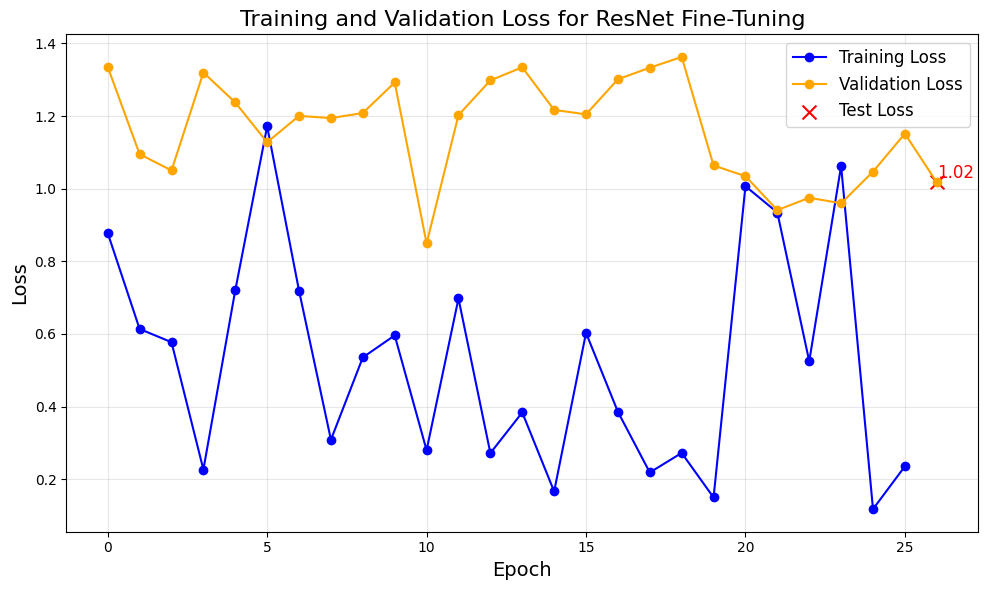

In [ ]:
# plot training and validation loss
metrics = pd.read_csv('/content/densenet_finetune/version_2/metrics.csv')
# Extract relevant columns
test_epoch = metrics['epoch'].max()
test_loss = metrics['test_loss'].max()

val_metrics = metrics[metrics['val_loss'].notna()]
train_metrics = metrics[metrics['train_loss'].notna()].drop_duplicates(subset='epoch',keep='last')

# Extract relevant columns
val_epochs = val_metrics['epoch']
train_epochs = train_metrics['epoch']
train_loss = train_metrics['train_loss']
val_loss = val_metrics['val_loss']

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(train_epochs[:len(train_loss)], train_loss, label='Training Loss', color='blue', marker='o')
plt.plot(val_epochs[:len(val_loss)], val_loss, label='Validation Loss', color='orange', marker='o')
plt.scatter(test_epoch, test_loss, color='red', marker='x', s=100, label='Test Loss')
plt.text(test_epoch, test_loss, f'{test_loss:.2f}', color='red', fontsize=12, verticalalignment='bottom')
# Adding labels and title
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss for ResNet Fine-Tuning', fontsize=16)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()

In [ ]:
# run validation dataset
val_metrics = trainer.validate(dense_fine_model, dataloaders=val_loader, verbose=False)
print(val_metrics)
# run test dataset

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

[{'val_loss': 1.1336547136306763, 'val_acc': 0.2986425459384918}]


In [ ]:
# plot training and validation loss
metrics = pd.read_csv('/content/densenet_finetune/version_2/metrics.csv')
# Extract relevant columns
test_epoch = metrics['epoch'].max()
test_loss = metrics['test_loss'].max()

val_metrics = metrics[metrics['val_loss'].notna()]
train_metrics = metrics[metrics['train_loss'].notna()].drop_duplicates(subset='epoch',keep='last')

# Extract relevant columns
val_epochs = val_metrics['epoch']
train_epochs = train_metrics['epoch']
train_loss = train_metrics['train_loss']
val_loss = val_metrics['val_loss']

# Plotting the training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(train_epochs[:len(train_loss)], train_loss, label='Training Loss', color='blue', marker='o')
plt.plot(val_epochs[:len(val_loss)], val_loss, label='Validation Loss', color='orange', marker='o')
plt.scatter(test_epoch, test_loss, color='red', marker='x', s=100, label='Test Loss')
plt.text(test_epoch, test_loss, f'{test_loss:.2f}', color='red', fontsize=12, verticalalignment='bottom')
# Adding labels and title
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss for ResNet Fine-Tuning', fontsize=16)
plt.legend(loc='upper right', fontsize=12)
plt.grid(alpha=0.3)
plt.tight_layout()

# Display the plot
plt.show()